# Previsão de Evasão em cursos técnicos na Rede Federal de Educação Profissional, Científica e Tecnológica

<i>Este projeto tem por objetivo construir um modelo de aprendizado de máquina para prever a probabilidade de evasão em curso técnico na Rede Federal de Educação Profissional, Científica e Tecnológica no Brasil. Isso envolve aprendizado supervisionado (usando um conjunto de treinamento rotulado) para classificação, onde o <b>alvo</b> é 1 se o aluno evadiu de um curso técnico, caso contrário, 0.</i>

###  <b>Pipeline</b> utilizado baseado na estrutura <b>CRISP-DM:</b>

1. Entendimento do negócio: definir o problema de negócio.<<br>
2. Entendimento dos dados: coletar os dados e obter uma visão geral.<br>
3. Preparação dos dados: engenharia de características, limpeza e pré-processamento dos dados. Explorar os dados (análise exploratória de dados).<br>
<b>4. Modelagem: dividir os dados em conjuntos de treinamento e teste, treinamento do modelo, comparação, seleção de características e tunning.</b><br>
<b>5. Avaliação: teste e avaliação do modelo final em produção.</b><br>
<b>6. Implementação (deployment): interpretar os resultados do modelo, concluir e implantar.</b><br>
<center>

![CRISP-DM](https://www.ibm.com/docs/pt-br/SS3RA7_18.4.0/modeler_crispdm_ddita/clementine/images/crisp_process.jpg)

</center>

  
<i>Neste notebook, será realizada a modelagem de aprendizado de máquina, abrangendo as etapas 4 a 8 do pipeline descrito acima. O principal objetivo aqui é construir um modelo capaz de prever com precisão a probabilidade de um aluno abandonar o curso técnico (evadido) na Rede Federal. Após construir este modelo, a Instituições poderão planejar estratégias para retenção de alunos, garantindo o êxito, visto que a evasão causa impactos relevantes na ações e nos objetivos da Rede Federal. Além disso, será abordado essas etapas em detalhes, explicando o motivo de cada decisão tomada.</i>

### Importando as bibliotecas


In [ ]:
!pip install optuna shap xgboost 

   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ---------------------------------------- 2.1/2.1 MB 18.9 MB/s eta 0:00:00

   ---------------------------------------- 0/6 [Mako]
   ---------------------------------------- 0/6 [Mako]
   ---------------------------------------- 0/6 [Mako]
   ------ --------------------------------- 1/6 [greenlet]
   ------ --------------------------------- 1/6 [greenlet]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   -------------------- ------------------- 3/6 [sqlalchemy]
   ------------------


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
# Manipulação e visualização de dados
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import imblearn

# Modelling
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.feature_selection import RFECV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, roc_auc_score, classification_report, roc_curve, precision_recall_curve, recall_score, f1_score, brier_score_loss
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, Pool, cv
import xgboost as xgb
import pickle
import optuna
import shap
shap.initjs()

# Filter warnings.
import warnings
warnings.filterwarnings('ignore') 

### Visualization Settings
%matplotlib inline

mpl.style.use('ggplot') 

plt.rcParams['figure.facecolor'] = 'white'  # Define fundo branco nas figuras
mpl.rcParams['axes.facecolor']      = 'white'
mpl.rcParams['axes.linewidth']      = 1
mpl.rcParams['xtick.color']         = 'black'
mpl.rcParams['ytick.color']         = 'black'
mpl.rcParams['grid.color']          = 'lightgray'

mpl.rcParams['axes.grid']           = True
mpl.rcParams['font.size']           = 12

# Palette Setting
# color_palette = ['#023047', '#e85d04', '#0077b6', '#ff8200', '#0096c7', '#ff9c33']
color_palette = ['#023177', '#e85d04', '#006494', '#ff9000', '#1B98E0', '#ff9c20']
# color_palette = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0"]

# Setting as the palette
sns.set_palette(sns.color_palette(color_palette))

#  Display
sns.color_palette(color_palette)

c:\Users\jabsondias\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[(0.00784313725490196, 0.19215686274509805, 0.4666666666666667),
 (0.9098039215686274, 0.36470588235294116, 0.01568627450980392),
 (0.0, 0.39215686274509803, 0.5803921568627451),
 (1.0, 0.5647058823529412, 0.0),
 (0.10588235294117647, 0.596078431372549, 0.8784313725490196),
 (1.0, 0.611764705882353, 0.12549019607843137)]

### Carregando o dataset

In [2]:
# Base de dado ajustada com o tratamento realizado na fase de preparação dos dados
# data_path = '../input/BaseEvasao_ajustada.csv' 
# df = pd.read_csv(data_path, sep=';')

In [3]:
# Base de dado ajustada com o tratamento realizado na fase de preparação dos dados
data_path = '../input/microdados_eficiencia_2023_todas_colunas_categoricas_CatBoostV1.csv' 
dfEf = pd.read_csv(data_path, sep=';')

In [4]:
dfEf

,Unnamed: 0,CATEGORIA_SITUACAO,COR_RACA,IDADE,SEXO,RENDA_FAMILIAR,MODALIDADE_DE_ENSINO,TIPO_DE_OFERTA,TURNO,NOME_DE_CURSO,EIXO_TECNOLOGICO,CARGA_HORARIA_MINIMA,UF,MUNICIPIO,REGIAO,INSTITUICAO,UNIDADE_DE_ENSINO,REGIÃO_METROPOLINA_UE
0,0,Concluídos,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
1,1,Evadidos,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
2,2,Concluídos,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM
3,3,Evadidos,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO
4,4,Evadidos,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,145826,Em Curso,Parda,28,Masculino,"1,5<RFP<=2,5",Educação a Distância,Subsequente,Não se aplica,Técnico em Manutenção e Suporte em Informática,Informação e Comunicação,1000,MG,Machado,Sudeste,Instituto Federal do Sul de Minas Gerais,Campus Machado,NÃO
145747,145827,Concluídos,Não declarada,20,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,GO,Goiânia,Centro-Oeste,Instituto Federal de Goiás,Campus Goiânia,SIM
145748,145828,Concluídos,Amarela/Branca,19,Feminino,"0,5<RFP<=1",Educação Presencial,Integrado,Vespertino,Técnico em Informática,Informação e Comunicação,1000,MS,Campo Grande,Centro-Oeste,Instituto Federal do Mato Grosso do Sul,Campus Campo Grande,NÃO
145749,145829,Concluídos,Não declarada,22,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Buriticupu,Nordeste,Instituto Federal do Maranhão,Campus Buriticupu,NÃO


In [5]:
dfEf.shape

(145751, 18)

In [6]:
dfEf.head()

,Unnamed: 0,CATEGORIA_SITUACAO,COR_RACA,IDADE,SEXO,RENDA_FAMILIAR,MODALIDADE_DE_ENSINO,TIPO_DE_OFERTA,TURNO,NOME_DE_CURSO,EIXO_TECNOLOGICO,CARGA_HORARIA_MINIMA,UF,MUNICIPIO,REGIAO,INSTITUICAO,UNIDADE_DE_ENSINO,REGIÃO_METROPOLINA_UE
0,0,Concluídos,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
1,1,Evadidos,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
2,2,Concluídos,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM
3,3,Evadidos,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO
4,4,Evadidos,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM


In [7]:
dfEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   Unnamed: 0             145751 non-null  int64 
 1   CATEGORIA_SITUACAO     145751 non-null  object
 2   COR_RACA               145751 non-null  object
 3   IDADE                  145751 non-null  int64 
 4   SEXO                   145751 non-null  object
 5   RENDA_FAMILIAR         145751 non-null  object
 6   MODALIDADE_DE_ENSINO   145751 non-null  object
 7   TIPO_DE_OFERTA         145751 non-null  object
 8   TURNO                  145751 non-null  object
 9   NOME_DE_CURSO          145751 non-null  object
 10  EIXO_TECNOLOGICO       145751 non-null  object
 11  CARGA_HORARIA_MINIMA   145751 non-null  int64 
 12  UF                     145751 non-null  object
 13  MUNICIPIO              145751 non-null  object
 14  REGIAO                 145751 non-null  object
 15  

- O Dataset contém 17 colunas. Porém, a coluna de índice será excluída por não contribuir com a análise.

---------------------------------------

# 4. Engenharia de características, limpeza e pré-processamento de dados.
Para ajustar algoritmos de aprendizado de máquina, é necessário aplicar algumas transformações aos dados. Não há valores ausentes no conjunto de dados, e os outliers não representam informações inconsistentes. Assim, será necessário apenas aplicar técnicas de pré-processamento, conforme descrito a seguir.

Considerando que modelos lineares e baseados em árvores requerem técnicas de pré-processamento distintas:
- Para o pré-processador de modelos baseados em árvores:
Não será aplicado nenhuma técnica de escalonamento às variáveis numéricas, pois esses modelos não requerem normalização de características. Para as variáveis categóricas com relações ordinais (renda familiar), será aplicado *ordinal encoding*, preservando essa característica. O *one-hot encoding* será aplicado as variáveis de Cor/Raça, Gênero, modalidade de ensino, tipo de oferta, turno do curso, eixo tecnológico, região e região metropolitana da escola, pois serão convertidas em variáveis binárias única, não aumentando a dimensionalidade.
- Para os modelos lineares:
Será aplicado escalonamento padrão (standard scaling) às variáveis numéricas, porque esses algoritmos utilizam cálculos baseados em distância ou otimizam funções como descida de gradiente, sendo sensíveis à escala. Para as variáveis categóricas, será utilizado *one-hot encoding*, uma vez que esses modelos assumem linearidade. O *one-hot encoding* é benéfica para modelos lineares porque, ao criar dummies para cada categoria, tratamos cada uma individualmente, atribuindo um peso distinto e garantindo que a linearidade seja respeitada: 1 quando a categoria está presente, e 0 caso contrário.

Como o foco está no poder preditivo, não será perdido muito tempo buscando problemas de multicolinearidade ou discretizando variáveis numéricas contínuas (etapas para melhorar o desempenho de modelos lineares, atendendo suas suposições), pois a ideia é usar um modelo robusto, como o *CatBoost*. Os modelos lineares serão testados apenas para verificar se seu desempenho supera o de um algoritmo robusto de gradient boosting. Se for o caso, será utilizado esses modelos, equilibrando o custo computacional.

Engenharia de Atributos (Feature Enginering):
- Para extrair o máximo de informações das variáveis disponíveis, será feito uma engenharia de atributos, que já está embutida no pré-processador.
- serão utilizados os seguintes atributos:
    - Atributos de razão (Ratio features): idade, carga horária mínima do curso e renda familiar.
    - Considerando que estas variáveis são numéricas, todas serão escaladas para a etapa de validação cruzada estratificada em k-folds (cross validation).
    - Eventualmente, outros atributos poderão ser adicionados. Os atributos acima já capturam relações ocultas e padrões, além de fazerem sentido no contexto do negócio. Isso é algo a ser considerado ao realizar a engenharia de atributos.


Considerações sobre algumas observações da Análise Exploratória de Dados (EDA):

- Durante a EDA, observou-se que as modalidade de oferta, região, turno discriminam bem entre evadidos e não-evadidos.
- Em gênero, essa categoria apresenta a maior taxa de evadidos entre os homens.
- Em Cor/Raça, pessoas pretas e pardas representam mais de 50% dos evadidos.

Seguindo assim, também não será feita nenhuma imputação. Imputar valores introduziria viés e perda de informação.

- Variável renda familiar per capita:
Embora esta variável seja altamente desbalanceada, observa-se que a categoria Não declarada apresenta taxas de evadidos mais alta. Como será construído modelos robustos, como o *CatBoost*, focando no poder preditivo, será mantido essa variável e aplicado um método de seleção de atributos para removê-la caso se mostre inútil.

- Remoção da variável :
Não será excluída menhuma variável, foi observado que não há correlação altamente positiva de alguma variável com outra, tornando alguma informação redundante.

- Remoção da variável Unnamed: 0:
A variável será descartada porque possui um valor único para cada registro, não agregando informações úteis ao modelo.

- Remoção de variáveis específicas:
As variáveis Instituição, UF, Município, Nome do curso serão descartadas porque apresentam muitas categórias e isso tornaria o modelo inviável, considerando o custo computacional.

- Multicolinearidade:
Não será tratado problemas relacionados à multicolinearidade, já que o foco é construir modelos robustos, como o LightGBM, buscando alcançar o máximo poder preditivo.

- Integração via pipeline:
Todo o pré-processamento mencionado será realizado por classes transformer, definidas no arquivo "modelling_utils.py". Isso nos permite integrar todas as etapas em um único pipeline do sklearn, facilitando a implantação do modelo em ambientes de produção.

### 4.0.1 Pré-processamento dos dados

In [8]:
# Converter todos os nomes das colunas para letras minúsculas
dfEf.columns = [x.lower() for x in dfEf.columns] 

In [9]:
# Renomear variável Target de categoria_situacao para evadido
dfEf.rename(columns={'categoria_situacao': 'evadido'}, inplace=True)
dfEf['evadido'] = dfEf['evadido'].map({'Evadidos': 1, 'Em Curso': 0, 'Concluídos': 0})

In [10]:
dfEf.shape

(145751, 18)

In [11]:
dfEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   unnamed: 0             145751 non-null  int64 
 1   evadido                145751 non-null  int64 
 2   cor_raca               145751 non-null  object
 3   idade                  145751 non-null  int64 
 4   sexo                   145751 non-null  object
 5   renda_familiar         145751 non-null  object
 6   modalidade_de_ensino   145751 non-null  object
 7   tipo_de_oferta         145751 non-null  object
 8   turno                  145751 non-null  object
 9   nome_de_curso          145751 non-null  object
 10  eixo_tecnologico       145751 non-null  object
 11  carga_horaria_minima   145751 non-null  int64 
 12  uf                     145751 non-null  object
 13  municipio              145751 non-null  object
 14  regiao                 145751 non-null  object
 15  

In [12]:
# Identificando os valores únicos das variáveis
for coluna in dfEf.select_dtypes(include="object"):
    print(f"{coluna}: {dfEf[coluna].unique()}")
    print()

cor_raca: ['Amarela/Branca' 'Preta' 'Não declarada' 'Parda' 'Indígena']

sexo: ['Feminino' 'Masculino']

renda_familiar: ['0,5<RFP<=1' 'Não declarada' '0<RFP<=0,5' '1,5<RFP<=2,5' '1<RFP<=1,5'
 '2,5<RFP<=3,5' 'RFP>3,5']

modalidade_de_ensino: ['Educação Presencial' 'Educação a Distância']

tipo_de_oferta: ['Concomitante' 'Subsequente' 'Integrado' 'PROEJA - Integrado'
 'PROEJA - Concomitante' 'PROEJA - Subsequente']

turno: ['Noturno' 'Matutino' 'Vespertino' 'Integral' 'Não se aplica']

nome_de_curso: ['Técnico em Química' 'Técnico em Mineração' 'Técnico em Farmácia'
 'Técnico em Eletrotécnica' 'Técnico em Informática'
 'Técnico em Eletromecânica' 'Técnico em Edificações'
 'Técnico em Manutenção e Suporte em Informática'
 'Técnico em Informática para Internet' 'Técnico em Plásticos'
 'Técnico em Mecânica' 'Técnico em Controle Ambiental'
 'Técnico em Eletrônica' 'Técnico em Meio Ambiente'
 'Técnico em Automação Industrial' 'Técnico em Biotecnologia'
 'Técnico em Alimentos' 'Técnico em Tel

In [13]:
# Últimos registros do dataset
dfEf.tail()

,unnamed: 0,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue
145746,145826,0,Parda,28,Masculino,"1,5<RFP<=2,5",Educação a Distância,Subsequente,Não se aplica,Técnico em Manutenção e Suporte em Informática,Informação e Comunicação,1000,MG,Machado,Sudeste,Instituto Federal do Sul de Minas Gerais,Campus Machado,NÃO
145747,145827,0,Não declarada,20,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,GO,Goiânia,Centro-Oeste,Instituto Federal de Goiás,Campus Goiânia,SIM
145748,145828,0,Amarela/Branca,19,Feminino,"0,5<RFP<=1",Educação Presencial,Integrado,Vespertino,Técnico em Informática,Informação e Comunicação,1000,MS,Campo Grande,Centro-Oeste,Instituto Federal do Mato Grosso do Sul,Campus Campo Grande,NÃO
145749,145829,0,Não declarada,22,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Buriticupu,Nordeste,Instituto Federal do Maranhão,Campus Buriticupu,NÃO
145750,145830,0,Parda,18,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Buriticupu,Nordeste,Instituto Federal do Maranhão,Campus Buriticupu,NÃO


### 4.0.2 Aplicando OrdinalEncoder - variável Renda Familiar

In [14]:
# Categorizar Renda Familiar com uso de OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder

In [15]:
# Ordenação definida para a variável Renda Familiar com base na progressão das faixas salariais:
ordenarRenda = ['Não declarada', '0<RFP<=0,5', '0,5<RFP<=1', '1<RFP<=1,5', '1,5<RFP<=2,5', '2,5<RFP<=3,5', 'RFP>3,5']

In [16]:
rendaFamiliarOrdenado = OrdinalEncoder(categories=[ordenarRenda])

In [17]:
rendaFamiliarOrdenado.fit_transform(dfEf[['renda_familiar']])

array([[2.],
       [0.],
       [0.],
       ...,
       [2.],
       [0.],
       [0.]], shape=(145751, 1))

In [18]:
dfEf['_Renda_Familiar_Ord'] = rendaFamiliarOrdenado.transform(dfEf[['renda_familiar']])
dfEf.head()

,unnamed: 0,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,_Renda_Familiar_Ord
0,0,0,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2.0
1,1,1,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0.0
2,2,0,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0.0
3,3,1,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0.0
4,4,1,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1.0


In [19]:
# Alterando a nova coluna para Int64
dfEf["_Renda_Familiar_Ord"] = dfEf["_Renda_Familiar_Ord"].astype("Int64")

In [20]:
dfEf.head()

,unnamed: 0,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,_Renda_Familiar_Ord
0,0,0,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2
1,1,1,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0
2,2,0,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0
3,3,1,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0
4,4,1,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1


In [21]:
# Excluindo a coluna original renda_familiar 
colunas_excluidas = ['renda_familiar'] ## Deletando a Coluna original RENDA_FAMILIAR como categórica
dfEf.drop(columns=colunas_excluidas, axis=1, inplace=True)
dfEf.head()

,unnamed: 0,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,_Renda_Familiar_Ord
0,0,0,Amarela/Branca,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2
1,1,1,Preta,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0
2,2,0,Não declarada,26,Masculino,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0
3,3,1,Não declarada,25,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0
4,4,1,Parda,25,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1


In [22]:
# Renomear a coluna _Renda_Familiar_Ord para o nome da coluna original
dfEf.rename(columns={'_Renda_Familiar_Ord': 'renda_familiar'}, inplace=True)

In [23]:
#Identifcação de valores nulos
dfEf.isnull().sum()

unnamed: 0               0
evadido                  0
cor_raca                 0
idade                    0
sexo                     0
modalidade_de_ensino     0
tipo_de_oferta           0
turno                    0
nome_de_curso            0
eixo_tecnologico         0
carga_horaria_minima     0
uf                       0
municipio                0
regiao                   0
instituicao              0
unidade_de_ensino        0
região_metropolina_ue    0
renda_familiar           0
dtype: int64

In [24]:
dfEf.head()

,unnamed: 0,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,renda_familiar
0,0,0,Amarela/Branca,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2
1,1,1,Preta,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0
2,2,0,Não declarada,26,Masculino,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0
3,3,1,Não declarada,25,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0
4,4,1,Parda,25,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1


In [25]:
# Excluindo coluna unnamed
colunas_excluidas = ['unnamed: 0'] 
dfEf.drop(columns=colunas_excluidas, axis=1, inplace=True)
dfEf.head()

,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,renda_familiar
0,0,Amarela/Branca,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2
1,1,Preta,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0
2,0,Não declarada,26,Masculino,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0
3,1,Não declarada,25,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0
4,1,Parda,25,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1


In [26]:
dfEf.reset_index(drop=True, inplace=True)
dfEf.head()

,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,renda_familiar
0,0,Amarela/Branca,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,2
1,1,Preta,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO,0
2,0,Não declarada,26,Masculino,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM,0
3,1,Não declarada,25,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO,0
4,1,Parda,25,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM,1


In [27]:
dfEf.tail()

,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,municipio,regiao,instituicao,unidade_de_ensino,região_metropolina_ue,renda_familiar
145746,0,Parda,28,Masculino,Educação a Distância,Subsequente,Não se aplica,Técnico em Manutenção e Suporte em Informática,Informação e Comunicação,1000,MG,Machado,Sudeste,Instituto Federal do Sul de Minas Gerais,Campus Machado,NÃO,4
145747,0,Não declarada,20,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,GO,Goiânia,Centro-Oeste,Instituto Federal de Goiás,Campus Goiânia,SIM,0
145748,0,Amarela/Branca,19,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Informática,Informação e Comunicação,1000,MS,Campo Grande,Centro-Oeste,Instituto Federal do Mato Grosso do Sul,Campus Campo Grande,NÃO,2
145749,0,Não declarada,22,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Buriticupu,Nordeste,Instituto Federal do Maranhão,Campus Buriticupu,NÃO,0
145750,0,Parda,18,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Buriticupu,Nordeste,Instituto Federal do Maranhão,Campus Buriticupu,NÃO,0


In [28]:
dfEf.shape

(145751, 17)

### 4.0.3 Aplicando One-Hot Encoder - demais variáveis categóricas

In [29]:
# Importando OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

In [30]:
#Inicializando OneHotEncoder object
onehotencoder = OneHotEncoder()

In [31]:
dfEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   evadido                145751 non-null  int64 
 1   cor_raca               145751 non-null  object
 2   idade                  145751 non-null  int64 
 3   sexo                   145751 non-null  object
 4   modalidade_de_ensino   145751 non-null  object
 5   tipo_de_oferta         145751 non-null  object
 6   turno                  145751 non-null  object
 7   nome_de_curso          145751 non-null  object
 8   eixo_tecnologico       145751 non-null  object
 9   carga_horaria_minima   145751 non-null  int64 
 10  uf                     145751 non-null  object
 11  municipio              145751 non-null  object
 12  regiao                 145751 non-null  object
 13  instituicao            145751 non-null  object
 14  unidade_de_ensino      145751 non-null  object
 15  

In [32]:
# Variáveis categóricas transformada 
OneHot_dfEf = onehotencoder.fit_transform(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]].values.reshape(-1, 1)).toarray()

OneHot_dfEf

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(1603261, 269))

In [33]:
dfEf.shape

(145751, 17)

In [34]:
one_hot_encoding_featuresEf = onehotencoder.fit(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]])

In [35]:
one_hot_encoding_featuresEf.transform(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 1603261 stored elements and shape (145751, 269)>

In [36]:
one_hot_encoding_featuresEf.transform(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]]).toarray()

array([[1., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 0., 1.],
       ...,
       [1., 0., 0., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]], shape=(145751, 269))

In [37]:
ohe_dfEf = pd.DataFrame(one_hot_encoding_featuresEf.transform(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]]).toarray())

ohe_dfEf

,0,1,2,3,4,5,6,7,8,9,...,259,260,261,262,263,264,265,266,267,268
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
145747,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
145748,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145749,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [38]:
dfOhe_dfEf = pd.DataFrame(ohe_dfEf)
dfOhe_dfEf

,0,1,2,3,4,5,6,7,8,9,...,259,260,261,262,263,264,265,266,267,268
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
145747,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
145748,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145749,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [39]:
# Obtendo os nomes das colunas para o Dataset resultante
colunas = one_hot_encoding_featuresEf.get_feature_names_out()
colunas

array(['cor_raca_Amarela/Branca', 'cor_raca_Indígena',
       'cor_raca_Não declarada', 'cor_raca_Parda', 'cor_raca_Preta',
       'sexo_Feminino', 'sexo_Masculino',
       'modalidade_de_ensino_Educação Presencial',
       'modalidade_de_ensino_Educação a Distância',
       'tipo_de_oferta_Concomitante', 'tipo_de_oferta_Integrado',
       'tipo_de_oferta_PROEJA - Concomitante',
       'tipo_de_oferta_PROEJA - Integrado',
       'tipo_de_oferta_PROEJA - Subsequente',
       'tipo_de_oferta_Subsequente',
       'nome_de_curso_Análise e Desenvolvimento de Sistemas',
       'nome_de_curso_Fotografia', 'nome_de_curso_Informática',
       'nome_de_curso_Técnico em Administração',
       'nome_de_curso_Técnico em Agenciamento de Viagem',
       'nome_de_curso_Técnico em Agente Comunitário de Saúde',
       'nome_de_curso_Técnico em Agricultura',
       'nome_de_curso_Técnico em Agrimensura',
       'nome_de_curso_Técnico em Agroecologia',
       'nome_de_curso_Técnico em Agroindústria',
    

In [40]:
dfEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   evadido                145751 non-null  int64 
 1   cor_raca               145751 non-null  object
 2   idade                  145751 non-null  int64 
 3   sexo                   145751 non-null  object
 4   modalidade_de_ensino   145751 non-null  object
 5   tipo_de_oferta         145751 non-null  object
 6   turno                  145751 non-null  object
 7   nome_de_curso          145751 non-null  object
 8   eixo_tecnologico       145751 non-null  object
 9   carga_horaria_minima   145751 non-null  int64 
 10  uf                     145751 non-null  object
 11  municipio              145751 non-null  object
 12  regiao                 145751 non-null  object
 13  instituicao            145751 non-null  object
 14  unidade_de_ensino      145751 non-null  object
 15  

In [41]:
# Alteração do tipo para Int64
var_dataEf = pd.DataFrame(one_hot_encoding_featuresEf.transform(dfEf[['cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'regiao',
                                                  'instituicao',
                                                  'região_metropolina_ue'
                                                ]]).toarray(),
                        columns=colunas,
                        dtype='int64'
                        )

In [42]:
var_dataEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 269 entries, cor_raca_Amarela/Branca to região_metropolina_ue_SIM
dtypes: int64(269)
memory usage: 299.1 MB


In [43]:
var_dataEf.shape

(145751, 269)

In [44]:
var_dataEf.reset_index(drop=True, inplace=True)
var_dataEf

,cor_raca_Amarela/Branca,cor_raca_Indígena,cor_raca_Não declarada,cor_raca_Parda,cor_raca_Preta,sexo_Feminino,sexo_Masculino,modalidade_de_ensino_Educação Presencial,modalidade_de_ensino_Educação a Distância,tipo_de_oferta_Concomitante,...,instituicao_Instituto Federal do Rio Grande do Sul,instituicao_Instituto Federal do Rio de Janeiro,instituicao_Instituto Federal do Sertão Pernambucano,instituicao_Instituto Federal do Sudeste de Minas Gerais,instituicao_Instituto Federal do Sul de Minas Gerais,instituicao_Instituto Federal do Tocantins,instituicao_Instituto Federal do Triângulo Mineiro,instituicao_Teatro Universitário da UFMG,região_metropolina_ue_NÃO,região_metropolina_ue_SIM
0,1,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,1,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
2,0,0,1,0,0,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,1,0,0,0,1,0
145747,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
145748,1,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
145749,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0


In [45]:
df_preparedEf = pd.concat([dfEf, var_dataEf], axis=1)

In [46]:
df_preparedEf.shape

(145751, 286)

In [47]:
df_preparedEf.head()

,evadido,cor_raca,idade,sexo,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,...,instituicao_Instituto Federal do Rio Grande do Sul,instituicao_Instituto Federal do Rio de Janeiro,instituicao_Instituto Federal do Sertão Pernambucano,instituicao_Instituto Federal do Sudeste de Minas Gerais,instituicao_Instituto Federal do Sul de Minas Gerais,instituicao_Instituto Federal do Tocantins,instituicao_Instituto Federal do Triângulo Mineiro,instituicao_Teatro Universitário da UFMG,região_metropolina_ue_NÃO,região_metropolina_ue_SIM
0,0,Amarela/Branca,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,...,0,0,0,0,0,0,0,0,1,0
1,1,Preta,29,Feminino,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,...,0,0,0,0,0,0,0,0,1,0
2,0,Não declarada,26,Masculino,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,...,0,1,0,0,0,0,0,0,0,1
3,1,Não declarada,25,Masculino,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,...,0,0,0,0,0,0,0,0,1,0
4,1,Parda,25,Feminino,Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,...,0,0,0,0,0,0,0,0,0,1


In [48]:
df_preparedEf.shape

(145751, 286)

In [49]:
#Identifcação de valores nulos
df_preparedEf.isnull().sum()

evadido                                               0
cor_raca                                              0
idade                                                 0
sexo                                                  0
modalidade_de_ensino                                  0
                                                     ..
instituicao_Instituto Federal do Tocantins            0
instituicao_Instituto Federal do Triângulo Mineiro    0
instituicao_Teatro Universitário da UFMG              0
região_metropolina_ue_NÃO                             0
região_metropolina_ue_SIM                             0
Length: 286, dtype: int64

In [50]:
df_preparedEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 286 entries, evadido to região_metropolina_ue_SIM
dtypes: Int64(1), int64(272), object(13)
memory usage: 318.2+ MB


In [51]:
# Excluir colunas originais (n-1) para evitar multicolinearidade
df_preparedEf.drop([
                                                  'cor_raca',
                                                  'sexo',
                                                  'modalidade_de_ensino',
                                                  'tipo_de_oferta',
                                                  'nome_de_curso',
                                                  'turno',
                                                  'eixo_tecnologico',
                                                  'uf',
                                                  'municipio',
                                                  'regiao',
                                                  'instituicao',
                                                  'unidade_de_ensino',
                                                  'região_metropolina_ue'
                  ], axis=1, inplace=True)

In [52]:
df_preparedEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 273 entries, evadido to região_metropolina_ue_SIM
dtypes: Int64(1), int64(272)
memory usage: 303.7 MB


In [53]:
# # Excluir colunas originais (n-1) para evitar multicolinearidade
# df_preparedEf.drop([
#                                                   'municipio',
#                                                   'unidade_de_ensino'
#                   ], axis=1, inplace=True)

In [54]:
df_preparedEf.head()

,evadido,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela/Branca,cor_raca_Indígena,cor_raca_Não declarada,cor_raca_Parda,cor_raca_Preta,sexo_Feminino,...,instituicao_Instituto Federal do Rio Grande do Sul,instituicao_Instituto Federal do Rio de Janeiro,instituicao_Instituto Federal do Sertão Pernambucano,instituicao_Instituto Federal do Sudeste de Minas Gerais,instituicao_Instituto Federal do Sul de Minas Gerais,instituicao_Instituto Federal do Tocantins,instituicao_Instituto Federal do Triângulo Mineiro,instituicao_Teatro Universitário da UFMG,região_metropolina_ue_NÃO,região_metropolina_ue_SIM
0,0,29,1200,2,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
1,1,29,1200,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0
2,0,26,1200,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,1,25,1200,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,25,1200,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1


In [55]:
# Criação de arquivo csv com dataset df_prepared
# df_prepared.to_csv('prepared_ohe_20032025.csv', sep=';', encoding='utf-8')

In [56]:
df_preparedEf.shape

(145751, 273)

In [57]:
# Excluir colunas não relevantes para o modelo para evitar multicolinearidade
df_preparedEf.drop([
                   'cor_raca_Indígena',
                   'cor_raca_Não declarada',
                   'cor_raca_Parda',
                   'cor_raca_Preta',
                   'sexo_Feminino',
                   'modalidade_de_ensino_Educação a Distância',
                   'tipo_de_oferta_Concomitante',
                   'tipo_de_oferta_Subsequente',
                   'tipo_de_oferta_PROEJA - Concomitante',
                   'tipo_de_oferta_PROEJA - Integrado',
                   'tipo_de_oferta_PROEJA - Subsequente',
                   'turno_Integral',
                   'turno_Matutino',
                   'turno_Não se aplica',
                   'turno_Vespertino',
                   'região_metropolina_ue_NÃO'
                  ], axis=1, inplace=True)

In [58]:
df_preparedEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 257 entries, evadido to região_metropolina_ue_SIM
dtypes: Int64(1), int64(256)
memory usage: 285.9 MB


In [59]:
df_preparedEf

,evadido,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela/Branca,sexo_Masculino,modalidade_de_ensino_Educação Presencial,tipo_de_oferta_Integrado,nome_de_curso_Análise e Desenvolvimento de Sistemas,nome_de_curso_Fotografia,...,instituicao_Instituto Federal do Rio Grande do Norte,instituicao_Instituto Federal do Rio Grande do Sul,instituicao_Instituto Federal do Rio de Janeiro,instituicao_Instituto Federal do Sertão Pernambucano,instituicao_Instituto Federal do Sudeste de Minas Gerais,instituicao_Instituto Federal do Sul de Minas Gerais,instituicao_Instituto Federal do Tocantins,instituicao_Instituto Federal do Triângulo Mineiro,instituicao_Teatro Universitário da UFMG,região_metropolina_ue_SIM
0,0,29,1200,2,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,29,1200,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,26,1200,0,0,1,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,1,25,1200,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,25,1200,1,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0,28,1000,4,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
145747,0,20,1200,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
145748,0,19,1000,2,1,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
145749,0,22,1200,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


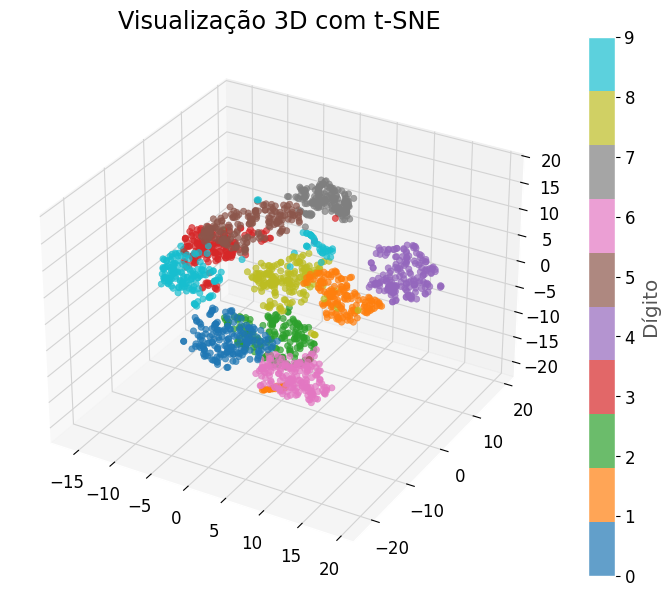

In [62]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits

# Carregar dataset exemplo
df_preparedEf = load_digits()
X, y = df_preparedEf.data, df_preparedEf.target

# Redução de dimensionalidade para 2D
tsne = TSNE(n_components=3, random_state=42, perplexity=30, learning_rate=200)
X_3d = tsne.fit_transform(X)

# Visualização
# plt.scatter(X_2d[:,0], X_2d[:,1], c=y, cmap='tab10')
# plt.colorbar()
# plt.title("Visualização com t-SNE")
# plt.show()

# Visualização em 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], 
                c=y, cmap='tab10', alpha=0.7)

plt.colorbar(sc, label="Dígito")
ax.set_title("Visualização 3D com t-SNE")
plt.show()


### 4.0.4 Dividir os dados em conjuntos de treinamento e teste
- Será dividido os dados em conjuntos de treinamento e teste.
- O conjunto de teste deve ser composto por dados que o modelo nunca viu antes.
- Essa divisão evita vazamento de dados, que ocorre quando informações do conjunto de teste ou dados futuros vazam inadvertidamente para o processo de treinamento, levando a uma estimativa de desempenho excessivamente otimista e comprometendo a capacidade do modelo de se generalizar para novos dados desconhecidos.
- Uma boa prática para proteger o modelo contra vazamento de dados é aplicar fit_transform nos dados de treinamento e apenas transform nos dados de teste ao realizar etapas de pré-processamento após a divisão.
- O *stratify=y* será especificado para que a função *train_test_split* garanta que o processo de divisão mantenha a mesma porcentagem de cada classe-alvo nos conjuntos de treinamento e teste. Isso é particularmente útil ao lidar com conjuntos de dados desbalanceados, como é o caso aqui, já que há mais clientes existentes do que clientes que cancelaram.

In [61]:
# Criação de arquivo csv com dataset numérico (dummy) - a ser usada no modelagem.
# df_preparedEf.to_csv('df_preparedEf.csv', sep=';', encoding='utf-8')

In [62]:
df_preparedEf.head()

,evadido,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela/Branca,sexo_Masculino,modalidade_de_ensino_Educação Presencial,tipo_de_oferta_Integrado,nome_de_curso_Análise e Desenvolvimento de Sistemas,nome_de_curso_Fotografia,...,instituicao_Instituto Federal do Rio Grande do Norte,instituicao_Instituto Federal do Rio Grande do Sul,instituicao_Instituto Federal do Rio de Janeiro,instituicao_Instituto Federal do Sertão Pernambucano,instituicao_Instituto Federal do Sudeste de Minas Gerais,instituicao_Instituto Federal do Sul de Minas Gerais,instituicao_Instituto Federal do Tocantins,instituicao_Instituto Federal do Triângulo Mineiro,instituicao_Teatro Universitário da UFMG,região_metropolina_ue_SIM
0,0,29,1200,2,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,29,1200,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,26,1200,0,0,1,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,1,25,1200,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,25,1200,1,0,0,1,1,0,0,...,1,0,0,0,0,0,0,0,0,1


In [63]:
df_preparedEf.shape

(145751, 257)

In [64]:
# Sanitizar nomes de colunas para LightGBM e outros modelos (inserir '_' no nome da coluna)
df_preparedEf.columns = df_preparedEf.columns.str.replace(r'[^\w]', '_', regex=True)
print("Nomes das colunas após sanitização:")
print(df_preparedEf.columns.tolist())

Nomes das colunas após sanitização:
['evadido', 'idade', 'carga_horaria_minima', 'renda_familiar', 'cor_raca_Amarela_Branca', 'sexo_Masculino', 'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado', 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas', 'nome_de_curso_Fotografia', 'nome_de_curso_Informática', 'nome_de_curso_Técnico_em_Administração', 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem', 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde', 'nome_de_curso_Técnico_em_Agricultura', 'nome_de_curso_Técnico_em_Agrimensura', 'nome_de_curso_Técnico_em_Agroecologia', 'nome_de_curso_Técnico_em_Agroindústria', 'nome_de_curso_Técnico_em_Agronegócio', 'nome_de_curso_Técnico_em_Agropecuária', 'nome_de_curso_Técnico_em_Alimentação_Escolar', 'nome_de_curso_Técnico_em_Alimentos', 'nome_de_curso_Técnico_em_Análises_Clínicas', 'nome_de_curso_Técnico_em_Análises_Químicas', 'nome_de_curso_Técnico_em_Apicultura', 'nome_de_curso_Técnico_em_Aquicultura', 'nome_de_curso_Técnico

In [65]:
df_prepared_linear_tree_basedEf = df_preparedEf.astype(float)

In [66]:
df_preparedEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 257 entries, evadido to região_metropolina_ue_SIM
dtypes: Int64(1), int64(256)
memory usage: 285.9 MB


In [67]:
df_preparedEf = df_preparedEf.astype(int)

In [68]:
df_preparedEf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Columns: 257 entries, evadido to região_metropolina_ue_SIM
dtypes: int64(257)
memory usage: 285.8 MB


In [69]:
# Divisão o dataset em conjuntos de treino e teste
X = df_preparedEf.drop(columns=['evadido'])
y = df_preparedEf['evadido'].copy()

X_trainEf, X_testEf, y_trainEf, y_testEf = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [70]:
print(f'Train predictor dataset shape: {X_trainEf.shape}.')
print(f'Train target dataset shape: {y_trainEf.shape}.')
print('------------------------------------------------')
print(f'Test predictor dataset shape: {X_testEf.shape}.')
print(f'Test target dataset shape: {y_testEf.shape}.')

Train predictor dataset shape: (116600, 256).
Train target dataset shape: (116600,).
------------------------------------------------
Test predictor dataset shape: (29151, 256).
Test target dataset shape: (29151,).


In [71]:
print(f'Train target proportion: ')
print(f'{y_trainEf.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')

Train target proportion: 
evadido
0    0.586672
1    0.413328
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64


### 4.0.5 Construir o pré-processador X-train para os modelos.

In [72]:
X_trainEf.shape

(116600, 256)

In [73]:
X_trainEf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116600 entries, 89156 to 144257
Columns: 256 entries, idade to região_metropolina_ue_SIM
dtypes: int64(256)
memory usage: 228.6 MB


In [74]:
X_trainEf.head()

,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela_Branca,sexo_Masculino,modalidade_de_ensino_Educação_Presencial,tipo_de_oferta_Integrado,nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas,nome_de_curso_Fotografia,nome_de_curso_Informática,...,instituicao_Instituto_Federal_do_Rio_Grande_do_Norte,instituicao_Instituto_Federal_do_Rio_Grande_do_Sul,instituicao_Instituto_Federal_do_Rio_de_Janeiro,instituicao_Instituto_Federal_do_Sertão_Pernambucano,instituicao_Instituto_Federal_do_Sudeste_de_Minas_Gerais,instituicao_Instituto_Federal_do_Sul_de_Minas_Gerais,instituicao_Instituto_Federal_do_Tocantins,instituicao_Instituto_Federal_do_Triângulo_Mineiro,instituicao_Teatro_Universitário_da_UFMG,região_metropolina_ue_SIM
89156,36,1200,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
128118,22,1000,3,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
41448,19,1000,3,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
113295,33,1200,2,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
133343,23,800,6,1,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1


As proporções das classes-alvo foram preservadas.

Verificar as variáveis numéricas.

In [75]:
numerical_featuresEf = X_trainEf.select_dtypes('number').columns.to_list()
print(f'Há {len(numerical_featuresEf)} variáveis numéricas')
print('Elas são:')
print(numerical_featuresEf)

Há 256 variáveis numéricas
Elas são:
['idade', 'carga_horaria_minima', 'renda_familiar', 'cor_raca_Amarela_Branca', 'sexo_Masculino', 'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado', 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas', 'nome_de_curso_Fotografia', 'nome_de_curso_Informática', 'nome_de_curso_Técnico_em_Administração', 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem', 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde', 'nome_de_curso_Técnico_em_Agricultura', 'nome_de_curso_Técnico_em_Agrimensura', 'nome_de_curso_Técnico_em_Agroecologia', 'nome_de_curso_Técnico_em_Agroindústria', 'nome_de_curso_Técnico_em_Agronegócio', 'nome_de_curso_Técnico_em_Agropecuária', 'nome_de_curso_Técnico_em_Alimentação_Escolar', 'nome_de_curso_Técnico_em_Alimentos', 'nome_de_curso_Técnico_em_Análises_Clínicas', 'nome_de_curso_Técnico_em_Análises_Químicas', 'nome_de_curso_Técnico_em_Apicultura', 'nome_de_curso_Técnico_em_Aquicultura', 'nome_de_curso_Técnico_em_Artes_

Verificar a cardinalidade e os valores únicos das variáveis categóricas.

In [76]:
categorical_featuresEf = X_trainEf.select_dtypes('object').columns.to_list()
print(f'Há {len(categorical_featuresEf)} variáveis categoricas.')
print('São elas: ')
print(categorical_featuresEf)

Há 0 variáveis categoricas.
São elas: 
[]


In [77]:
for featureEf in categorical_featuresEf:
    print(featureEf)
    print('-'*40)
    print(f'Há {X_trainEf[featureEf].nunique()} valores únicos. They are: ')
    print(X_trainEf[featureEf].value_counts(normalize=True))
    print()

In [78]:
#Identifcação de valores nulos
X_trainEf.isnull().sum()

idade                                                   0
carga_horaria_minima                                    0
renda_familiar                                          0
cor_raca_Amarela_Branca                                 0
sexo_Masculino                                          0
                                                       ..
instituicao_Instituto_Federal_do_Sul_de_Minas_Gerais    0
instituicao_Instituto_Federal_do_Tocantins              0
instituicao_Instituto_Federal_do_Triângulo_Mineiro      0
instituicao_Teatro_Universitário_da_UFMG                0
região_metropolina_ue_SIM                               0
Length: 256, dtype: int64

In [79]:
# Identificado categórias de cada variável
for coluna in X_trainEf:
    print(f"{coluna}: {X_trainEf[coluna].unique()}")
    print()

idade: [36 22 19 33 23 21 26 30 24 51 27 20 46 47 44 29 54 28 34 25 39 59 48 49
 31 32 37 42 55 43 41 35 53 61 45 38 60 40 56 65 18 50 17 15 52 80 16 62
 63 58 64 75 57 68 81 71 82 67 77 66 69 70 72 78 76 83 73 84 14]

carga_horaria_minima: [1200 1000  800 1600 2000 3000]

renda_familiar: [1 3 2 6 4 0 5]

cor_raca_Amarela_Branca: [1 0]

sexo_Masculino: [1 0]

modalidade_de_ensino_Educação_Presencial: [1 0]

tipo_de_oferta_Integrado: [0 1]

nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas: [0 1]

nome_de_curso_Fotografia: [0 1]

nome_de_curso_Informática: [0 1]

nome_de_curso_Técnico_em_Administração: [0 1]

nome_de_curso_Técnico_em_Agenciamento_de_Viagem: [0 1]

nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde: [0 1]

nome_de_curso_Técnico_em_Agricultura: [0 1]

nome_de_curso_Técnico_em_Agrimensura: [0 1]

nome_de_curso_Técnico_em_Agroecologia: [0 1]

nome_de_curso_Técnico_em_Agroindústria: [0 1]

nome_de_curso_Técnico_em_Agronegócio: [0 1]

nome_de_curso_Técnico_em_Agropecuária

In [80]:
# Criação de arquivo csv com dataset X_train
# X_train.to_csv('X_train10.01.25.csv', sep=';', encoding='utf-8')

In [81]:
X_trainEf.shape

(116600, 256)

In [82]:
# Sanitizar X_Train -  nomes de colunas para o LightGBM e outros modelos
X_trainEf.columns = X_trainEf.columns.str.replace(r'[^\w]', '_', regex=True)
print("Nomes das colunas após sanitização:")
print(X_trainEf.columns.tolist())

Nomes das colunas após sanitização:
['idade', 'carga_horaria_minima', 'renda_familiar', 'cor_raca_Amarela_Branca', 'sexo_Masculino', 'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado', 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas', 'nome_de_curso_Fotografia', 'nome_de_curso_Informática', 'nome_de_curso_Técnico_em_Administração', 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem', 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde', 'nome_de_curso_Técnico_em_Agricultura', 'nome_de_curso_Técnico_em_Agrimensura', 'nome_de_curso_Técnico_em_Agroecologia', 'nome_de_curso_Técnico_em_Agroindústria', 'nome_de_curso_Técnico_em_Agronegócio', 'nome_de_curso_Técnico_em_Agropecuária', 'nome_de_curso_Técnico_em_Alimentação_Escolar', 'nome_de_curso_Técnico_em_Alimentos', 'nome_de_curso_Técnico_em_Análises_Clínicas', 'nome_de_curso_Técnico_em_Análises_Químicas', 'nome_de_curso_Técnico_em_Apicultura', 'nome_de_curso_Técnico_em_Aquicultura', 'nome_de_curso_Técnico_em_Artes_V

In [83]:
X_trainEf.shape

(116600, 256)

In [84]:
# Sanitizar X_test -  nomes de colunas para o LightGBM e outros modelos
X_testEf.columns = X_testEf.columns.str.replace(r'[^\w]', '_', regex=True)
print("Nomes das colunas após sanitização:")
print(X_testEf.columns.tolist())

Nomes das colunas após sanitização:
['idade', 'carga_horaria_minima', 'renda_familiar', 'cor_raca_Amarela_Branca', 'sexo_Masculino', 'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado', 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas', 'nome_de_curso_Fotografia', 'nome_de_curso_Informática', 'nome_de_curso_Técnico_em_Administração', 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem', 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde', 'nome_de_curso_Técnico_em_Agricultura', 'nome_de_curso_Técnico_em_Agrimensura', 'nome_de_curso_Técnico_em_Agroecologia', 'nome_de_curso_Técnico_em_Agroindústria', 'nome_de_curso_Técnico_em_Agronegócio', 'nome_de_curso_Técnico_em_Agropecuária', 'nome_de_curso_Técnico_em_Alimentação_Escolar', 'nome_de_curso_Técnico_em_Alimentos', 'nome_de_curso_Técnico_em_Análises_Clínicas', 'nome_de_curso_Técnico_em_Análises_Químicas', 'nome_de_curso_Técnico_em_Apicultura', 'nome_de_curso_Técnico_em_Aquicultura', 'nome_de_curso_Técnico_em_Artes_V

In [85]:
X_testEf.shape


(29151, 256)

In [86]:
X_testEf

,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela_Branca,sexo_Masculino,modalidade_de_ensino_Educação_Presencial,tipo_de_oferta_Integrado,nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas,nome_de_curso_Fotografia,nome_de_curso_Informática,...,instituicao_Instituto_Federal_do_Rio_Grande_do_Norte,instituicao_Instituto_Federal_do_Rio_Grande_do_Sul,instituicao_Instituto_Federal_do_Rio_de_Janeiro,instituicao_Instituto_Federal_do_Sertão_Pernambucano,instituicao_Instituto_Federal_do_Sudeste_de_Minas_Gerais,instituicao_Instituto_Federal_do_Sul_de_Minas_Gerais,instituicao_Instituto_Federal_do_Tocantins,instituicao_Instituto_Federal_do_Triângulo_Mineiro,instituicao_Teatro_Universitário_da_UFMG,região_metropolina_ue_SIM
81948,30,1200,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
122169,25,1000,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
112050,43,1200,2,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
57297,29,1200,2,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
44518,19,800,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3368,25,1200,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27184,21,1200,4,1,1,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
28791,25,1200,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
85852,23,1000,0,0,1,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [87]:
y_testEf.shape

(29151,)

In [88]:
print(f'Train target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')
print('----------------------------------------')

Train target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64
----------------------------------------


In [89]:
y_testEf.info()

<class 'pandas.core.series.Series'>
Index: 29151 entries, 81948 to 70746
Series name: evadido
Non-Null Count  Dtype
--------------  -----
29151 non-null  int32
dtypes: int32(1)
memory usage: 341.6 KB


In [90]:
df_prepared_linear_tree_basedEf

,evadido,idade,carga_horaria_minima,renda_familiar,cor_raca_Amarela_Branca,sexo_Masculino,modalidade_de_ensino_Educação_Presencial,tipo_de_oferta_Integrado,nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas,nome_de_curso_Fotografia,...,instituicao_Instituto_Federal_do_Rio_Grande_do_Norte,instituicao_Instituto_Federal_do_Rio_Grande_do_Sul,instituicao_Instituto_Federal_do_Rio_de_Janeiro,instituicao_Instituto_Federal_do_Sertão_Pernambucano,instituicao_Instituto_Federal_do_Sudeste_de_Minas_Gerais,instituicao_Instituto_Federal_do_Sul_de_Minas_Gerais,instituicao_Instituto_Federal_do_Tocantins,instituicao_Instituto_Federal_do_Triângulo_Mineiro,instituicao_Teatro_Universitário_da_UFMG,região_metropolina_ue_SIM
0,0.0,29.0,1200.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,29.0,1200.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,26.0,1200.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,25.0,1200.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,25.0,1200.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0.0,28.0,1000.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
145747,0.0,20.0,1200.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
145748,0.0,19.0,1000.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
145749,0.0,22.0,1200.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# _______________________________________________________________________________________________________________________________________________________________________________________

# 4.1 Treinamento, Comparação, Seleção e Ajuste de Modelos
- Nesta etapa, será comparado o desempenho de diferentes modelos. Para isso, será utilizado stratified k-fold cross validation para treinar cada um deles e avaliar o ROC-AUC score. A acurácia não é uma boa métrica, pois o alvo está desbalanceado. Além disso, a stratified k-fold cross validation manterá a proporção do alvo em cada subdivisão, lidando com o desbalanceamento do alvo de maneira eficaz.

- <b>K-fold cross-validation</b> é uma técnica utilizada em aprendizado de máquina para avaliar o desempenho de um modelo. Ela envolve dividir o conjunto de dados em K subconjuntos, usando K-1 para treinamento e um para teste de forma iterativa. Isso ajuda a estimar a capacidade de generalização de um modelo, reduzindo o risco de overfitting e fornecendo métricas de desempenho mais confiáveis.

- O  objetivo aqui é selecionar o melhor modelo para avançar para as etapas de seleção de features, ajuste de hiperparâmetros e avaliação final do modelo. Para identificar o melhor modelo, avaliarei as maiores médias de validação do ROC-AUC score e analisarei o equilíbrio entre viés e variância (bias-variance trade-off).

## 4.1.1 Treinamentos de modelos
- Linear models: Logistic Regression, Linear SVC, SVM, KNN
- Tree models: Decision Tree, Random Forest
- Boosting: LightGBM, XGBoost e CatBoost.

### 4.1.1.1 Treinamento dos modelos (com CV, sem SMOTE e sem parâmetros)

In [90]:
# Dados Eficiência Acadêmica: Modelos lineares e de Árvore de decisão - com Cross Validation (Sem SMOTE e Sem parâmetros no modelo)
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import (
    roc_auc_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
)
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import time
import sys
from warnings import filterwarnings

filterwarnings('ignore')

# modelos
models = {    
    'Logistic Regression': LogisticRegression(),
    'Linear SVC': LinearSVC(),
    'SVM': LinearSVC(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),  # ajustado para seu desbalanceamento
    'LightGBM': LGBMClassifier(), #  class_weight='balanced'
    'CatBoost': CatBoostClassifier()
}

def detailed_error_msg(error, error_details: sys):
    _, _, exception_traceback = error_details.exc_info()
    file_name = exception_traceback.tb_frame.f_code.co_filename
    line_number = exception_traceback.tb_lineno
    detailed_error_message = f'An error occurred in python file [{file_name}] line number [{line_number}] error message [{str(error)}]'
    return detailed_error_message

class CustomException(Exception):
    def __init__(self, detailed_error_message: str, error_details: sys) -> None:
        super().__init__(detailed_error_message)
        self.detailed_error_message = detailed_error_msg(detailed_error_message, error_details=error_details)

    def __str__(self) -> str:
        return self.detailed_error_message

def classification_kfold_cv(models, X_trainEf, y_trainEf, n_folds=5):
    try:
        if models is None or not isinstance(models, dict):
            raise ValueError("O argumento 'models' deve ser um dicionário com os modelos instanciados.")

        if X_trainEf is None or y_trainEf is None:
            raise ValueError("Os dados de treinamento (X_train ou y_train) não podem ser None.")

        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        models_val_scores = {}
        models_train_scores = {}

        for model_name, model_instance in models.items():
            if model_instance is None:
                print(f"Modelo {model_name} é None. Ignorando...")
                continue

            print(f"Processando modelo: {model_name}")
            print(f"X_train shape: {X_trainEf.shape}")
            print(f"y_train shape: {y_trainEf.shape}")

            if not hasattr(model_instance, 'fit') or not hasattr(model_instance, 'predict'):
                raise ValueError(f"O modelo {model_name} não possui métodos 'fit' ou 'predict'.")

            start_time = time.time()
            model_instance.fit(X_trainEf, y_trainEf)
            training_time = time.time() - start_time

            y_train_pred = model_instance.predict(X_trainEf)
            train_score = roc_auc_score(y_trainEf, y_train_pred)

            val_scores = cross_val_score(
                model_instance,
                X_trainEf,
                y_trainEf,
                scoring='roc_auc',
                cv=stratified_kfold
            )
            avg_val_score = val_scores.mean()
            val_score_std = val_scores.std()

            models_val_scores[model_name] = avg_val_score
            models_train_scores[model_name] = train_score

            print(f'{model_name} results:')
            print('-' * 50)
            print(f'Training score: {train_score}')
            print(f'Average validation score: {avg_val_score}')
            print(f'Standard deviation: {val_score_std}')
            print(f'Training time: {round(training_time, 5)} seconds')
            print('=' * 50)
            print()

        val_dfEf = pd.DataFrame(list(models_val_scores.items()), columns=['model', 'avg_val_score'])
        train_dfEf = pd.DataFrame(list(models_train_scores.items()), columns=['model', 'train_score'])
        eval_dfEf = val_dfEf.merge(train_dfEf, on='model')
        eval_dfEf = eval_dfEf.sort_values(['avg_val_score'], ascending=False).reset_index(drop=True)

        return eval_dfEf

    except Exception as e:
        raise CustomException(e, sys)

# Validação cruzada k-fold para modelos
eval_dfEf = classification_kfold_cv(
    models=models,
    X_trainEf=X_trainEf,
    y_trainEf=y_trainEf,
    n_folds=5
)

eval_dfEf

# DataFrame para armazenar os resultados
results = []

for name, model in models.items():
    print(f'Treinando {name}...')
    model.fit(X_trainEf, y_trainEf)
    y_pred = model.predict(X_testEf)
    
    accuracy = accuracy_score(y_testEf, y_pred)
    precision = precision_score(y_testEf, y_pred)
    recall = recall_score(y_testEf, y_pred)
    f1 = f1_score(y_testEf, y_pred)
    roc = roc_auc_score(y_testEf, y_pred)
    
    print(f'--- {name} ---')
    print(classification_report(y_testEf, y_pred))
    print(f'Confusion Matrix:\n{confusion_matrix(y_testEf, y_pred)}')
    print('='*50)
    
    results.append([name, accuracy, precision, recall, f1, roc])

# Criar DataFrame com os resultados
results_modelsEf = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
results_modelsEf = results_modelsEf.sort_values(by='F1 Score', ascending=False)

results_modelsEf

Processando modelo: Logistic Regression
X_train shape: (116600, 256)
y_train shape: (116600,)
Logistic Regression results:
--------------------------------------------------
Training score: 0.6492236333370979
Average validation score: 0.7079941797299796
Standard deviation: 0.0030162249719408543
Training time: 6.46253 seconds

Processando modelo: Linear SVC
X_train shape: (116600, 256)
y_train shape: (116600,)
Linear SVC results:
--------------------------------------------------
Training score: 0.6581247092424504
Average validation score: 0.71832349777015
Standard deviation: 0.0025950887112232614
Training time: 1.55088 seconds

Processando modelo: SVM
X_train shape: (116600, 256)
y_train shape: (116600,)
SVM results:
--------------------------------------------------
Training score: 0.6581247092424504
Average validation score: 0.71832349777015
Standard deviation: 0.0025950887112232614
Training time: 1.4017 seconds

Processando modelo: KNN
X_train shape: (116600, 256)
y_train shape: (11

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
8,CatBoost,0.716030,0.681945,0.586522,0.630644,0.696898
6,XGBoost,0.710988,0.673796,0.583036,0.625139,0.692085
7,LightGBM,0.710439,0.674165,0.579550,0.623287,0.691102
5,Random Forest,0.676409,0.618801,0.565441,0.590919,0.660016
3,KNN,0.675449,0.619153,0.558055,0.587018,0.658106
1,Linear SVC,0.680217,0.640524,0.515810,0.571442,0.655929
2,SVM,0.680217,0.640524,0.515810,0.571442,0.655929
4,Decision Tree,0.664986,0.610471,0.523529,0.563667,0.644088
0,Logistic Regression,0.675243,0.638134,0.494979,0.557513,0.648612


,model,avg_val_score,train_score
0,CatBoost,0.768790,0.714567
1,XGBoost,0.763044,0.707220
2,LightGBM,0.760542,0.700170
3,Random Forest,0.720712,0.864240
4,Linear SVC,0.718323,0.658125
5,SVM,0.718323,0.658125
6,KNN,0.709033,0.754324
7,Logistic Regression,0.707994,0.649224
8,Decision Tree,0.645816,0.857670


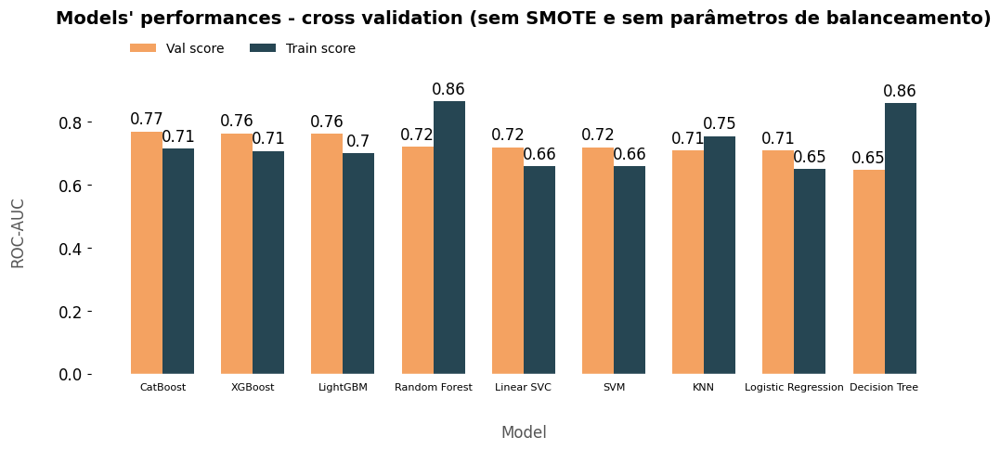

In [91]:
# Microdados Eficiência - Plotagem do gráfico
def plot_classification_kfold_cv(eval_dfEf, figsize=(20, 12), bar_width=0.35, title_size=10,
                             title_pad=30, label_size=12, labelpad=25, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_dfEf['model']))
        y = np.arange(len(eval_dfEf['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_dfEf['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_dfEf['train_score'], bar_width, label='Train score', color='#264653')

        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("Models' performances - cross validation (sem SMOTE e sem parâmetros de balanceamento)", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_dfEf['model'], rotation=0, fontsize=8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            ax.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'), #023047
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')] ##0077b6
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_dfEf, bar_width=0.35, figsize=(12, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_dfEf

### 4.1.1.2 Treinamento dos modelos (com CV, sem SMOTE e com parâmetros)

In [92]:
# Dados Eficiência Acadêmica: Modelos lineares e de Árvore de decisão - com Cross Validation (Sem SMOTE e com parâmetros no modelo)
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import (
    roc_auc_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
)
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import time
import sys
from warnings import filterwarnings

filterwarnings('ignore')

# modelos
modelsB = {    
    'Logistic Regression': LogisticRegression(class_weight='balanced'),
    'Linear SVC': LinearSVC(class_weight='balanced'),
    'SVM': LinearSVC(),
    'KNN': KNeighborsClassifier(n_neighbors=3, weights='distance'),
    'Decision Tree': DecisionTreeClassifier(class_weight='balanced'),
    'Random Forest': RandomForestClassifier(class_weight='balanced'),
    'XGBoost': XGBClassifier(scale_pos_weight=1.41),  # ajustado para seu desbalanceamento coerente bom o balanceamento da variável target: 58.5/41.5=1.41
    'LightGBM': LGBMClassifier(class_weight='balanced'), #  class_weight='balanced'
    'CatBoost': CatBoostClassifier(auto_class_weights='Balanced', verbose=0)
}

def detailed_error_msg(error, error_details: sys):
    _, _, exception_traceback = error_details.exc_info()
    file_name = exception_traceback.tb_frame.f_code.co_filename
    line_number = exception_traceback.tb_lineno
    detailed_error_message = f'An error occurred in python file [{file_name}] line number [{line_number}] error message [{str(error)}]'
    return detailed_error_message

class CustomException(Exception):
    def __init__(self, detailed_error_message: str, error_details: sys) -> None:
        super().__init__(detailed_error_message)
        self.detailed_error_message = detailed_error_msg(detailed_error_message, error_details=error_details)

    def __str__(self) -> str:
        return self.detailed_error_message

def classification_kfold_cv(modelsB, X_trainEf, y_trainEf, n_folds=5):
    try:
        if modelsB is None or not isinstance(modelsB, dict):
            raise ValueError("O argumento 'models' deve ser um dicionário com os modelos instanciados.")

        if X_trainEf is None or y_trainEf is None:
            raise ValueError("Os dados de treinamento (X_train ou y_train) não podem ser None.")

        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        models_val_scores = {}
        models_train_scores = {}

        for model_name, model_instance in modelsB.items():
            if model_instance is None:
                print(f"Modelo {model_name} é None. Ignorando...")
                continue

            print(f"Processando modelo: {model_name}")
            print(f"X_train shape: {X_trainEf.shape}")
            print(f"y_train shape: {y_trainEf.shape}")

            if not hasattr(model_instance, 'fit') or not hasattr(model_instance, 'predict'):
                raise ValueError(f"O modelo {model_name} não possui métodos 'fit' ou 'predict'.")

            start_time = time.time()
            model_instance.fit(X_trainEf, y_trainEf)
            training_time = time.time() - start_time

            y_train_pred = model_instance.predict(X_trainEf)
            train_score = roc_auc_score(y_trainEf, y_train_pred)

            val_scores = cross_val_score(
                model_instance,
                X_trainEf,
                y_trainEf,
                scoring='roc_auc',
                cv=stratified_kfold
            )
            avg_val_score = val_scores.mean()
            val_score_std = val_scores.std()

            models_val_scores[model_name] = avg_val_score
            models_train_scores[model_name] = train_score

            print(f'{model_name} results:')
            print('-' * 50)
            print(f'Training score: {train_score}')
            print(f'Average validation score: {avg_val_score}')
            print(f'Standard deviation: {val_score_std}')
            print(f'Training time: {round(training_time, 5)} seconds')
            print('=' * 50)
            print()

        val_dfEfB = pd.DataFrame(list(models_val_scores.items()), columns=['model', 'avg_val_score'])
        train_dfEfB = pd.DataFrame(list(models_train_scores.items()), columns=['model', 'train_score'])
        eval_dfEfB = val_dfEfB.merge(train_dfEfB, on='model')
        eval_dfEfB = eval_dfEfB.sort_values(['avg_val_score'], ascending=False).reset_index(drop=True)

        return eval_dfEfB

    except Exception as e:
        raise CustomException(e, sys)

# Validação cruzada k-fold para modelos
eval_dfEfB = classification_kfold_cv(
    modelsB=modelsB,
    X_trainEf=X_trainEf,
    y_trainEf=y_trainEf,
    n_folds=5
)

eval_dfEfB

# DataFrame para armazenar os resultados
results = []

for name, model in modelsB.items():
    print(f'Treinando {name}...')
    model.fit(X_trainEf, y_trainEf)
    
    y_pred = model.predict(X_testEf)
    
    accuracy = accuracy_score(y_testEf, y_pred)
    precision = precision_score(y_testEf, y_pred) #average='weighted'
    recall = recall_score(y_testEf, y_pred)
    f1 = f1_score(y_testEf, y_pred)
    roc = roc_auc_score(y_testEf, y_pred)
    
    print(f'--- {name} ---')
    print(classification_report(y_testEf, y_pred))
    print(f'Confusion Matrix:\n{confusion_matrix(y_testEf, y_pred)}')
    print('='*50)
    
    results.append([name, accuracy, precision, recall, f1, roc])

# Criar DataFrame com os resultados
results_modelsEfBalanced = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
results_modelsEfBalanced = results_modelsEfBalanced.sort_values(by='F1 Score', ascending=False)

results_modelsEfBalanced

Processando modelo: Logistic Regression
X_train shape: (116600, 256)
y_train shape: (116600,)
Logistic Regression results:
--------------------------------------------------
Training score: 0.658441738201746
Average validation score: 0.7095773415019939
Standard deviation: 0.001769523884879214
Training time: 5.21351 seconds

Processando modelo: Linear SVC
X_train shape: (116600, 256)
y_train shape: (116600,)
Linear SVC results:
--------------------------------------------------
Training score: 0.666163386894389
Average validation score: 0.7205720516393329
Standard deviation: 0.0026322515309933985
Training time: 3.69112 seconds

Processando modelo: SVM
X_train shape: (116600, 256)
y_train shape: (116600,)
SVM results:
--------------------------------------------------
Training score: 0.6581247092424504
Average validation score: 0.71832349777015
Standard deviation: 0.0025950887112232614
Training time: 1.20543 seconds

Processando modelo: KNN
X_train shape: (116600, 256)
y_train shape: (11

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
8,CatBoost,0.710713,0.639184,0.689103,0.663205,0.707521
6,XGBoost,0.705259,0.631255,0.689933,0.659291,0.702995
7,LightGBM,0.703578,0.629858,0.685949,0.656708,0.700974
1,Linear SVC,0.669926,0.596271,0.623786,0.609719,0.663109
0,Logistic Regression,0.663339,0.586715,0.627521,0.606432,0.658048
5,Random Forest,0.672395,0.605702,0.594240,0.599916,0.660849
4,Decision Tree,0.650029,0.573346,0.599137,0.585958,0.642511
3,KNN,0.663717,0.602091,0.549672,0.574689,0.646869
2,SVM,0.680217,0.640524,0.515810,0.571442,0.655929


,model,avg_val_score,train_score
0,CatBoost,0.768748,0.721458
1,XGBoost,0.762074,0.713755
2,LightGBM,0.760526,0.706412
3,Linear SVC,0.720572,0.666163
4,SVM,0.718323,0.658125
5,Random Forest,0.717400,0.869625
6,Logistic Regression,0.709577,0.658442
7,KNN,0.673609,0.853000
8,Decision Tree,0.646883,0.873312


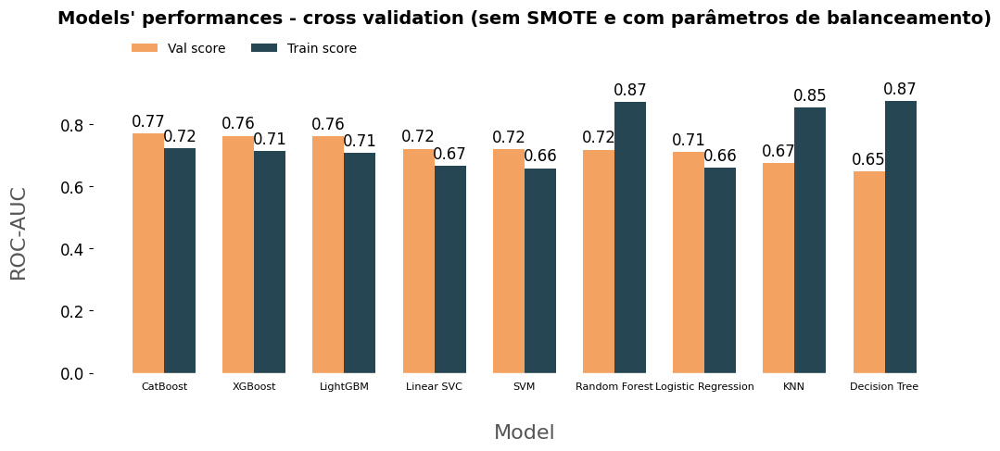

In [93]:
# Microdados Eficiência - Plotagem do gráfico
def plot_classification_kfold_cv(eval_dfEfB, figsize=(20, 12), bar_width=0.35, title_size=12,
                             title_pad=30, label_size=16, labelpad=25, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_dfEfB['model']))
        y = np.arange(len(eval_dfEfB['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_dfEfB['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_dfEfB['train_score'], bar_width, label='Train score', color='#264653')

        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("Models' performances - cross validation (sem SMOTE e com parâmetros de balanceamento)", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_dfEfB['model'], rotation=0, fontsize=8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            ax.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'), #023047
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')] ##0077b6
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_dfEfB, bar_width=0.35, figsize=(12, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_dfEfB

- Training score (AUC-ROC do treino) 
Mede o desempenho do modelo nos dados de treino usando a métrica AUC-ROC.
Se for muito alto e a validação for baixa, pode indicar overfitting.

- Average validation score (Média da validação cruzada)
Mede o desempenho do modelo nos dados de validação, também usando AUC-ROC.
É a média das pontuações obtidas em cada iteração da validação cruzada (cross-validation).

### 4.1.1.3 Treinamento dos modelos (com CV, com SMOTE e sem parâmetros)

In [94]:
#Microdados Eficiência - com Cross Validation (com SMOTE para balancear os dados)
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np

# Lista de modelos (sem LightGBM e XGBoost)
models = {
    'Logistic Regression': LogisticRegression(),
    'Linear SVC': LinearSVC(),
    'SVM': LinearSVC(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),  # ajustado para seu desbalanceamento
    'LightGBM': LGBMClassifier(), #  class_weight='balanced'
    'CatBoost': CatBoostClassifier()
}


# Aplicar SMOTE ao conjunto de treino
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_trainEf, y_trainEf)

# Validação cruzada apenas no conjunto de treino balanceado
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dicionários para armazenar os resultados
models_val_scores = {}
models_train_scores = {}

for model_name, model_instance in models.items():
    print(f'Treinando {model_name}...')
    
    start_time = time.time()
    model_instance.fit(X_train_res, y_train_res)
    training_time = time.time() - start_time

    # Previsão no conjunto de teste original
    y_pred = model_instance.predict(X_testEf)
    train_score = roc_auc_score(y_testEf, y_pred)

    # Validação cruzada (ROC-AUC)
    val_scores = cross_val_score(
        model_instance,
        X_train_res,
        y_train_res,
        scoring='roc_auc',
        cv=skf
    )
    avg_val_score = val_scores.mean()
    val_score_std = val_scores.std()

    # Armazenar resultados
    models_val_scores[model_name] = avg_val_score
    models_train_scores[model_name] = train_score

    print(f'{model_name} results:')
    print('-' * 50)
    print(f'Training score: {train_score}')
    print(f'Average validation score: {avg_val_score}')
    print(f'Standard deviation: {val_score_std}')
    print(f'Training time: {round(training_time, 5)} seconds')
    print('=' * 50)
    print()

# Criar DataFrames de avaliação
val_dfEfSmt = pd.DataFrame(list(models_val_scores.items()), columns=['model', 'avg_val_score'])
train_dfEfB = pd.DataFrame(list(models_train_scores.items()), columns=['model', 'train_score'])
val_dfEfSMOTE = val_dfEfSmt.merge(train_dfEfB, on='model')
val_dfEfSMOTE = val_dfEfSMOTE.sort_values(['avg_val_score'], ascending=False).reset_index(drop=True)

val_dfEfSMOTE




# DataFrame para armazenar os resultados
results = []

for name, model in modelsB.items():
    print(f'Treinando {name}...')
    model.fit(X_trainEf, y_trainEf)
    y_pred = model.predict(X_testEf)
    
    accuracy = accuracy_score(y_testEf, y_pred)
    precision = precision_score(y_testEf, y_pred) #average='weighted'
    recall = recall_score(y_testEf, y_pred)
    f1 = f1_score(y_testEf, y_pred)
    roc = roc_auc_score(y_testEf, y_pred)
    
    print(f'--- {name} ---')
    print(classification_report(y_testEf, y_pred))
    print(f'Confusion Matrix:\n{confusion_matrix(y_testEf, y_pred)}')
    print('='*50)
    
    results.append([name, accuracy, precision, recall, f1, roc])

# Criar DataFrame com os resultados
results_modelsEfSmote = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
results_modelsEfSmote = results_modelsEfSmote.sort_values(by='F1 Score', ascending=False)

results_modelsEfSmote




Treinando Logistic Regression...
Logistic Regression results:
--------------------------------------------------
Training score: 0.6583249377209281
Average validation score: 0.7137901013124145
Standard deviation: 0.002372646815727289
Training time: 5.74164 seconds

Treinando Linear SVC...
Linear SVC results:
--------------------------------------------------
Training score: 0.662307591038693
Average validation score: 0.7394706423505619
Standard deviation: 0.0021607260020683355
Training time: 6.50964 seconds

Treinando SVM...
SVM results:
--------------------------------------------------
Training score: 0.662307591038693
Average validation score: 0.7394706423505619
Standard deviation: 0.0021607260020683355
Training time: 6.82817 seconds

Treinando KNN...
KNN results:
--------------------------------------------------
Training score: 0.6666197398513044
Average validation score: 0.74860045584285
Standard deviation: 0.001805613342583219
Training time: 0.16859 seconds

Treinando Decision T

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
8,CatBoost,0.710713,0.639184,0.689103,0.663205,0.707521
6,XGBoost,0.705259,0.631255,0.689933,0.659291,0.702995
7,LightGBM,0.703578,0.629858,0.685949,0.656708,0.700974
1,Linear SVC,0.669926,0.596271,0.623786,0.609719,0.663109
0,Logistic Regression,0.663339,0.586715,0.627521,0.606432,0.658048
5,Random Forest,0.671504,0.604284,0.594655,0.599431,0.660151
4,Decision Tree,0.650578,0.574005,0.599635,0.586540,0.643052
3,KNN,0.663717,0.602091,0.549672,0.574689,0.646869
2,SVM,0.680217,0.640524,0.515810,0.571442,0.655929


,model,avg_val_score,train_score
0,CatBoost,0.779868,0.707136
1,XGBoost,0.772897,0.699699
2,Random Forest,0.769435,0.661138
3,LightGBM,0.766678,0.697391
4,KNN,0.748600,0.666620
5,Linear SVC,0.739471,0.662308
6,SVM,0.739471,0.662308
7,Logistic Regression,0.713790,0.658325
8,Decision Tree,0.705271,0.641410


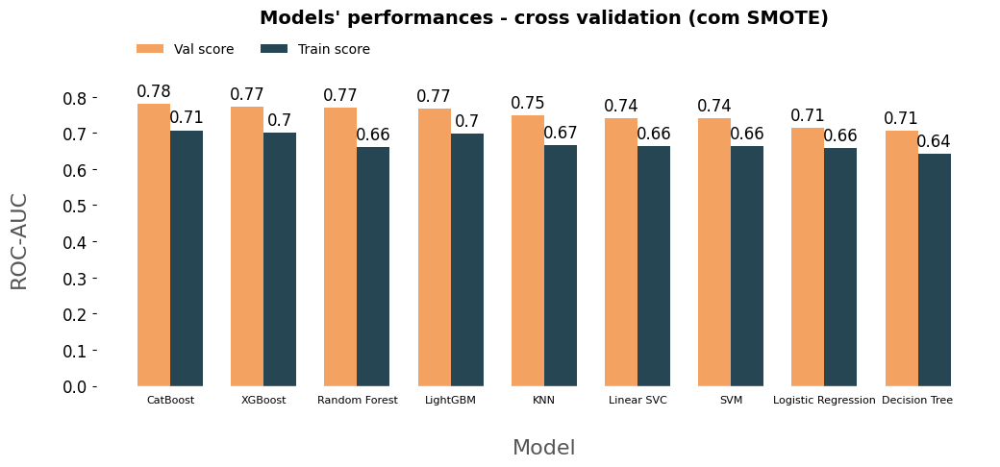

In [95]:
# Microdados Eficiência - Plotagem do gráfico
def plot_classification_kfold_cv(val_dfEfSMOTE, figsize=(20, 12), bar_width=0.35, title_size=12,
                             title_pad=30, label_size=16, labelpad=25, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(val_dfEfSMOTE['model']))
        y = np.arange(len(val_dfEfSMOTE['train_score']))

        val_bars = ax.bar(x - bar_width/2, val_dfEfSMOTE['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, val_dfEfSMOTE['train_score'], bar_width, label='Train score', color='#264653')

        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("Models' performances - cross validation (com SMOTE)", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, val_dfEfSMOTE['model'], rotation=0, fontsize=8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            ax.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'), #023047
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')] ##0077b6
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(val_dfEfSMOTE, bar_width=0.35, figsize=(12, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

val_dfEfSMOTE

## 4.1.2 Modelo: LightGBM (com CV, com SMOTE, com parâmetros) 

### 4.1.2.1 Modelo: LightGBM (com CV e com e sem parâmetros) - Modelo Salvo: .pkl e usado em gráfico
Campeão LighGBM: A:72, P:68, R:58, f1:63, ROC: 69, Matrix: 7078

In [121]:
# Com parametros com cross validation
import pickle

model_lgbmEf = LGBMClassifier(  
                    metric= "roc_auc",
                    scale_pos_weight= 2.6088870613073154,
                    random_state=42         
                                                      
                    # metric= "roc_auc",
                    # learning_rate= 0.16568797396563284,
                    # num_leaves= 159, 
                    # min_child_samples= 21, 
                    # lambda_l1= 2.055564781157039, 
                    # lambda_l2= 0.06487361091414567, 
                    # feature_fraction= 0.8862969685055829, 
                    # bagging_fraction= 0.7791062737078045, 
                    # bagging_freq= 1
                     )

                    ############################# A:71, P:68, R:58, fi:63, ROC: 69, Matrix: 7078
                    # learning_rate= 0.16568797396563284, 
                    # num_leaves= 159, 
                    # min_child_samples= 21, 
                    # lambda_l1= 2.055564781157039, 
                    # lambda_l2= 0.06487361091414567, 
                    # feature_fraction= 0.8862969685055829, 
                    # bagging_fraction= 0.7791062737078045, 
                    # bagging_freq= 1
                    ########################### A:63, P:54, R:85, fi:66, ROC: 67, Matrix: 10252
                    # objective= "binary",
                    # metric= "roc_auc",
                    # boosting_type= "gbdt",
                    # scale_pos_weight= 2.6088870613073154
        

# Validação cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_trainEf, y_trainEf), 1):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]

    model_lgbmEf.fit(X_tr, y_tr)
    
    # Salvando o modelo treinado - A ser executado
    with open('model_LightGBM_parametro.pkl', 'wb') as f:
        pickle.dump(model_lgbmEf, f)
        
    y_pred_val = model_lgbmEf.predict(X_val)

[LightGBM] [Info] Number of positive: 38556, number of negative: 54724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 93280, number of used features: 243
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.413336 -> initscore=-0.350191
[LightGBM] [Info] Start training from score -0.350191
[LightGBM] [Info] Number of positive: 38555, number of negative: 54725
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 557
[LightGBM] [Info] Number of data points in the train set: 93280, number of used features: 242
[LightGBM] [Info] 

In [122]:
model_lgbmEf.fit(X_trainEf, y_trainEf)  # Treina com todo o conjunto de treino
y_pred_test = model_lgbmEf.predict(X_testEf)


[LightGBM] [Info] Number of positive: 48194, number of negative: 68406
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 116600, number of used features: 246
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.413328 -> initscore=-0.350226
[LightGBM] [Info] Start training from score -0.350226


In [123]:
# Microdados Eficiencia - Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_pred_test))
accuracy = accuracy_score(y_testEf, y_pred_test)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_pred_test) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_pred_test)
print("recall", recall)
f1 = f1_score(y_testEf, y_pred_test)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_pred_test)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_pred_test)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.82      0.48      0.61     17102
           1       0.54      0.85      0.66     12049

    accuracy                           0.64     29151
   macro avg       0.68      0.67      0.63     29151
weighted avg       0.70      0.64      0.63     29151

accuracy 0.6352440739597269
precision 0.5370913663034367
recall 0.8508589924475061
f1 0.6585091691556669
ROC-AUC 0.6670971374353072
Matriz de Confusão [[ 8266  8836]
 [ 1797 10252]]


### 4.1.2.2 Modelo: LightGBM (com CV e com SMOTE) 

In [99]:
# Aplicando SMOTE
from imblearn.over_sampling import SMOTE
# Configuração do modelo base
model_lgbmEfSMOTE = LGBMClassifier()

# Cross-validation com SMOTE aplicado apenas no treino
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

y_preds = []
y_trues = []

for train_idx, val_idx in skf.split(X_trainEf, y_trainEf):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]
    
    # Aplica SMOTE apenas no conjunto de treino
    smoteLGBM = SMOTE(random_state=42)
    X_res, y_res = smoteLGBM.fit_resample(X_tr, y_tr)
    
    # Treina o modelo
    model_lgbmEfSMOTE.fit(X_res, y_res)
    
    # Faz predições no conjunto de validação
    y_pred = model_lgbmEfSMOTE.predict(X_val)
    
    y_preds.extend(y_pred)
    y_trues.extend(y_val)

[LightGBM] [Info] Number of positive: 54724, number of negative: 54724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 109448, number of used features: 244
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 54725, number of negative: 54725
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 109450, number of used features: 246
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0

In [100]:
print(f'Train target proportion: ')
print(f'{y_trainEf.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')
print('------------------------------------------------------ SMOTE ------------------------------------------------')

print(f'Train target proportion: ')
print(f'{y_res.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')

Train target proportion: 
evadido
0    0.586672
1    0.413328
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64
------------------------------------------------------ SMOTE ------------------------------------------------
Train target proportion: 
evadido
0    0.5
1    0.5
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64


In [101]:
y_res.value_counts()

evadido
0    54725
1    54725
Name: count, dtype: int64

In [102]:
# Aplicar CV
model_lgbm_binario_SMOTE = LGBMClassifier()
model_lgbm_binario_SMOTE.fit(X_res, y_res)
y_predc_LGBM_SMOTE = model_lgbm_binario_SMOTE.predict(X_testEf)

[LightGBM] [Info] Number of positive: 54725, number of negative: 54725
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 109450, number of used features: 243
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


In [103]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_LGBM_SMOTE))
accuracy = accuracy_score(y_testEf, y_predc_LGBM_SMOTE)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_LGBM_SMOTE) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_LGBM_SMOTE)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_LGBM_SMOTE)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_LGBM_SMOTE)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_LGBM_SMOTE)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.76      0.72      0.74     17102
           1       0.63      0.67      0.65     12049

    accuracy                           0.70     29151
   macro avg       0.69      0.70      0.69     29151
weighted avg       0.70      0.70      0.70     29151

accuracy 0.70042194092827
precision 0.6285669975186104
recall 0.6727529255539879
f1 0.6499098015634396
ROC-AUC 0.6963343624378523
Matriz de Confusão [[12312  4790]
 [ 3943  8106]]


## 4.1.3 Modelo: XGBoost (com CV, com SMOTE, com parâmetros) 

### 4.1.3.1 Modelo: XGBoost (com CV e com e sem parâmetros) 

In [104]:
# Com parametros com cross validation
model_xgb_binario = XGBClassifier(
    #     scale_pos_weight=1.41,      # Ajuste pelo leve desbalanceamento
    #     eval_metric='auc',          # Foco em AUC
    # # Early stopping (em conjunto com validação cruzada)
    #     verbosity=1,
    #     random_state=42
    #####################################################################################
 
        objective="binary:logistic",       # Tarefa de classificação binária
        eval_metric="auc",                 # Métrica principal (como no CatBoost e LightGBM)
        booster="gbtree",                  # Tipo de booster (árvore de decisão)
        scale_pos_weight=1.409,            # Peso para lidar com o leve desbalanceamento (negativos / positivos)
        random_state=42,                   # Para resultados reprodutíveis
        n_estimators=1000,                 # Número máximo de árvores (early stopping pode parar antes)
        verbosity=0                        # Deixa os logs mais limpos

)

# Validação cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_trainEf, y_trainEf), 1):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]

    model_xgb_binario.fit(X_tr, y_tr)
    y_pred_val = model_xgb_binario.predict(X_val)

In [105]:
model_xgb_binario.fit(X_trainEf, y_trainEf)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [106]:
model_xgb_binario.fit(X_trainEf, y_trainEf)  # Treina com todo o conjunto de treino   


# Salvando o modelo treinado - A ser executado
with open('model_XGBoost_cv_parametro.pkl', 'wb') as f:
    pickle.dump(model_xgb_binario, f)
y_predc_xgb_binario = model_xgb_binario.predict(X_testEf)

In [107]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_xgb_binario))
accuracy = accuracy_score(y_testEf, y_predc_xgb_binario)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_xgb_binario) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_xgb_binario)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_xgb_binario)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_xgb_binario)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_xgb_binario)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.76      0.73      0.75     17102
           1       0.64      0.68      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.70      0.71      0.70     29151
weighted avg       0.71      0.71      0.71     29151

accuracy 0.7099584919899832
precision 0.6411626080125687
recall 0.6774006141588513
f1 0.6587836474433997
ROC-AUC 0.7051486756912839
Matriz de Confusão [[12534  4568]
 [ 3887  8162]]


### 4.1.3.2 Modelo: XGBoost (com CV e com SMOTE) 

In [108]:
# Aplicando SMOTE
from imblearn.over_sampling import SMOTE

smoteEf_XGB = SMOTE(random_state=42)
X_resEf, y_resEf = smoteEf_XGB.fit_resample(X_trainEf, y_trainEf) 

In [109]:
# Aplicando SMOTE
from imblearn.over_sampling import SMOTE
# Configuração do modelo base
model_xgbmEfSMOTE = XGBClassifier()

# Cross-validation com SMOTE aplicado apenas no treino
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

y_preds = []
y_trues = []

for train_idx, val_idx in skf.split(X_trainEf, y_trainEf):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]
    
    # Aplica SMOTE apenas no conjunto de treino
    smoteEf_XGB = SMOTE(random_state=42)
    X_res_xgb, y_res_xgb = smoteEf_XGB.fit_resample(X_tr, y_tr)
    
    # Treina o modelo
    model_xgbmEfSMOTE.fit(X_res_xgb, y_res_xgb)
    
    # Faz predições no conjunto de validação
    y_pred = model_xgbmEfSMOTE.predict(X_val)
    
    y_preds.extend(y_pred)
    y_trues.extend(y_val)

In [110]:
print(f'Train target proportion: ')
print(f'{y_trainEf.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')
print('--------------------------------------------------- SMOTE --------------------------------------------------')

print(f'Train target proportion: ')
print(f'{y_res_xgb.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')

Train target proportion: 
evadido
0    0.586672
1    0.413328
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64
--------------------------------------------------- SMOTE --------------------------------------------------
Train target proportion: 
evadido
0    0.5
1    0.5
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64


In [111]:
y_res_xgb.value_counts()

evadido
0    54725
1    54725
Name: count, dtype: int64

In [112]:
model_xgb_binario_SMOTE = XGBClassifier()

model_xgb_binario_SMOTE.fit(X_res_xgb, y_res_xgb)
y_predc_xgb_SMOTE = model_xgb_binario_SMOTE.predict(X_testEf)

In [113]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_xgb_SMOTE))
accuracy = accuracy_score(y_testEf, y_predc_xgb_SMOTE)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_xgb_SMOTE) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_xgb_SMOTE)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_xgb_SMOTE)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_xgb_SMOTE)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_xgb_SMOTE)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.76      0.72      0.74     17102
           1       0.63      0.68      0.65     12049

    accuracy                           0.70     29151
   macro avg       0.70      0.70      0.70     29151
weighted avg       0.71      0.70      0.70     29151

accuracy 0.7034750094336386
precision 0.6322535539501282
recall 0.6754917420532824
f1 0.6531578524997994
ROC-AUC 0.6993410060985626
Matriz de Confusão [[12368  4734]
 [ 3910  8139]]


### 4.1.4 CatBoost - Variáveis binárias - (CV e sem parâmetros) - Modelo salvo: .pkl 
Campeão LighGBM: A:71, P:64, R:69, f1:66, ROC: 71, Matrix: 8311   

In [144]:
# Micrdodados de Eficiência Academica - Com Cross Validation Sem SMOTE e sem parâmetro Balanced
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import roc_auc_score
from catboost import CatBoostClassifier
import time
import sys
import pickle

from warnings import filterwarnings

filterwarnings('ignore')

# Adicionando o modelo CatBoost à variável 'models'
modelsCatBoost_binario = {
    'CatBoost': CatBoostClassifier(

    )

}

def detailed_error_msg(error, error_details: sys):
    _, _, exception_traceback = error_details.exc_info()
    file_name = exception_traceback.tb_frame.f_code.co_filename
    line_number = exception_traceback.tb_lineno
    detailed_error_message = f'An error occurred in python file [{file_name}] line number [{line_number}] error message [{str(error)}]'
    return detailed_error_message

class CustomException(Exception):
    def __init__(self, detailed_error_message: str, error_details: sys) -> None:
        super().__init__(detailed_error_message)
        self.detailed_error_message = detailed_error_msg(detailed_error_message, error_details=error_details)

    def __str__(self) -> str:
        return self.detailed_error_message

def classification_kfold_cv(modelsCatBoost_binario, X_trainEf, y_trainEf, n_folds=5):
    try:
        if modelsCatBoost_binario is None or not isinstance(modelsCatBoost_binario, dict):
            raise ValueError("O argumento 'models' deve ser um dicionário com os modelos instanciados.")

        if X_trainEf is None or y_trainEf is None:
            raise ValueError("Os dados de treinamento (X_train ou y_train) não podem ser None.")

        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        models_val_scores = {}
        models_train_scores = {}

        for model_name, model_instance in modelsCatBoost_binario.items():
            if model_instance is None:
                print(f"Modelo {model_name} é None. Ignorando...")
                continue

            print(f"Processando modelo: {model_name}")
            print(f"X_train shape: {X_trainEf.shape}")
            print(f"y_train shape: {y_trainEf.shape}")

            if not hasattr(model_instance, 'fit') or not hasattr(model_instance, 'predict'):
                raise ValueError(f"O modelo {model_name} não possui métodos 'fit' ou 'predict'.")

            start_time = time.time()
            model_instance.fit(X_trainEf, y_trainEf, verbose=0)  # Treinando o CatBoost
            training_time = time.time() - start_time

            y_train_predEf = model_instance.predict_proba(X_trainEf)[:, 1]
            train_score = roc_auc_score(y_trainEf, y_train_predEf)

            # val_scores = cross_val_score(
            #     model_instance,
            #     X_train,
            #     y_train,
            #     scoring='roc_auc',
            #     cv=stratified_kfold
            # )
            val_scores = []
            for train_idx, val_idx in stratified_kfold.split(X_trainEf, y_trainEf):
                X_t, X_v = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
                y_t, y_v = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]
                
                model_instance.fit(X_t, y_t)
                y_pred = model_instance.predict_proba(X_v)[:, 1]
                val_scores.append(roc_auc_score(y_v, y_pred))

            val_scores = np.array(val_scores)
            
            
            avg_val_score = val_scores.mean()
            val_score_std = val_scores.std()

            models_val_scores[model_name] = avg_val_score
            models_train_scores[model_name] = train_score

            print(f'{model_name} results:')
            print('-' * 50)
            print(f'Training score: {train_score}')
            print(f'Average validation score: {avg_val_score}')
            print(f'Standard deviation: {val_score_std}')
            print(f'Training time: {round(training_time, 5)} seconds')
            print('=' * 50)
            print()
            
        val_df = pd.DataFrame(list(models_val_scores.items()), columns=['model', 'avg_val_score'])
        train_df = pd.DataFrame(list(models_train_scores.items()), columns=['model', 'train_score'])
        eval_dfCatBoostEf = val_df.merge(train_df, on='model')
        eval_dfCatBoostEf = eval_dfCatBoostEf.sort_values(['avg_val_score'], ascending=False).reset_index(drop=True)

        return eval_dfCatBoostEf

    except Exception as e:
        raise CustomException(e, sys)

# Validação cruzada k-fold para modelos, incluindo CatBoost
eval_dfCatEf = classification_kfold_cv(
    modelsCatBoost_binario=modelsCatBoost_binario,
    X_trainEf=X_trainEf,
    y_trainEf=y_trainEf,
    n_folds=5
)

eval_dfCatEf

# DataFrame para armazenar os resultados
results = []

for name, model in modelsCatBoost_binario.items():
    print(f'Treinando {name}...')
    model.fit(X_trainEf, y_trainEf)
    
    
    # Salvando o modelo treinado
    with open(f'catboost_cv_parametro_modelo.pkl', 'wb') as f: 
        pickle.dump(model, f)
        
        
    y_pred = model.predict(X_testEf)
    
    accuracy = accuracy_score(y_testEf, y_pred)
    precision = precision_score(y_testEf, y_pred)
    recall = recall_score(y_testEf, y_pred)
    f1 = f1_score(y_testEf, y_pred)
    roc = roc_auc_score(y_testEf, y_pred)
    
    print(f'--- {name} ---')
    print(classification_report(y_testEf, y_pred))
    print(f'Confusion Matrix:\n{confusion_matrix(y_testEf, y_pred)}')
    print('='*50)
    
    results.append([name, accuracy, precision, recall, f1, roc])

# Salvando o modelo para utilização no Simulador de evasão
modelo_catboost_binario_sem_paramentro = modelsCatBoost_binario['CatBoost']

# Criar DataFrame com os resultados
results_CatBoostEf = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
results_CatBoostEf = results_CatBoostEf.sort_values(by='F1 Score', ascending=False)

results_CatBoostEf

Processando modelo: CatBoost
X_train shape: (116600, 256)
y_train shape: (116600,)
Learning rate set to 0.071455
0:	learn: 0.6820827	total: 29.7ms	remaining: 29.7s
1:	learn: 0.6722378	total: 63.9ms	remaining: 31.9s
2:	learn: 0.6639004	total: 92.5ms	remaining: 30.7s
3:	learn: 0.6570622	total: 123ms	remaining: 30.7s
4:	learn: 0.6507682	total: 165ms	remaining: 32.7s
5:	learn: 0.6457288	total: 206ms	remaining: 34.1s
6:	learn: 0.6409383	total: 239ms	remaining: 33.9s
7:	learn: 0.6366195	total: 270ms	remaining: 33.5s
8:	learn: 0.6329351	total: 303ms	remaining: 33.4s
9:	learn: 0.6298272	total: 333ms	remaining: 33s
10:	learn: 0.6270521	total: 365ms	remaining: 32.8s
11:	learn: 0.6247537	total: 409ms	remaining: 33.7s
12:	learn: 0.6225592	total: 459ms	remaining: 34.8s
13:	learn: 0.6206234	total: 489ms	remaining: 34.5s
14:	learn: 0.6188216	total: 519ms	remaining: 34.1s
15:	learn: 0.6172550	total: 549ms	remaining: 33.7s
16:	learn: 0.6157668	total: 575ms	remaining: 33.3s
17:	learn: 0.6144517	total: 6

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CatBoost,0.716236,0.682976,0.585028,0.630219,0.696853


,model,avg_val_score,train_score
0,CatBoost,0.76855,0.791939


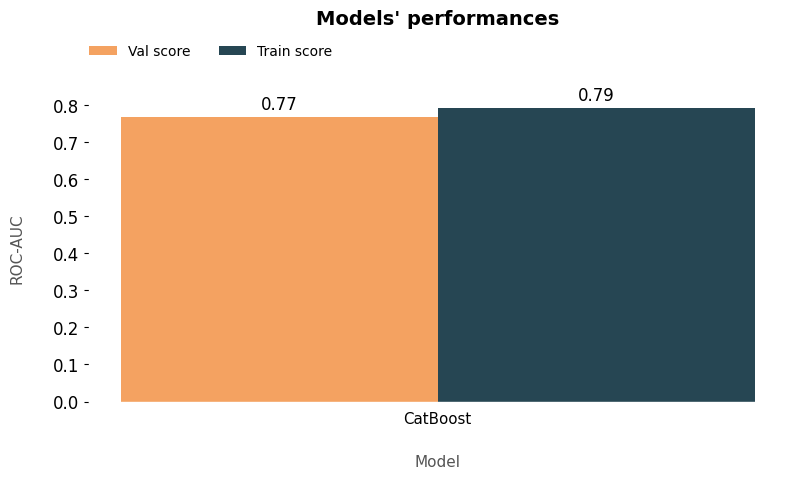

In [145]:
def plot_classification_kfold_cv(eval_dfCatEf, figsize=(20, 7), bar_width=0.35, title_size=15,
                             title_pad=30, label_size=11, labelpad=20, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_dfCatEf['model']))
        y = np.arange(len(eval_dfCatEf['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_dfCatEf['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_dfCatEf['train_score'], bar_width, label='Train score', color='#264653')   
        
        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("Models' performances", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_dfCatEf['model'], rotation=0, fontsize=10.8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            plt.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')]
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_dfCatEf, bar_width=0.35, figsize=(9, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_dfCatEf

## 4.1.4.1 Modelo: CatBoost (com CV, com SMOTE, com parâmetros) 

### 4.1.4.1 Modelo: CatBoost (com CV e com parâmetros) 

In [128]:
# CatBoost - Binario - Com parametros com cross validation
import pickle

model_catboost_cv_binario_param = CatBoostClassifier(                          

                    
                    # loss_function= 'Logloss',  # Função de perda para classificação binária
                    # eval_metric= 'AUC',  # Métrica de avaliação
                    # auto_class_weights='Balanced',
                    # # iterations= 1000,  # Número máximo de iterações
                    # # learning_rate= 0.03653989849466528, 
                    # # depth= 9, 
                    # # l2_leaf_reg= 0.9489621626723985, 
                    # # bagging_temperature= 0.013654754764024335, 
                    # # border_count= 145, 
                    # # random_strength= 0.0064574552934798775, 
                    # # grow_policy= 'SymmetricTree',
                    # verbose= 0  # Evita saída excessiva de logs 
                    #####################################################################################
                    # # auto_class_weights='Balanced'    # Lidar com desbalanceamento
                    # # loss_function=  'Logloss',  # Função de perda para classificação binária
                    # eval_metric=  'AUC',  # Métrica de avaliação
                    # iterations= 1000,  # Número máximo de iterações
                    # learning_rate= 0.03653989849466528, 
                    # # depth= 9, 
                    # # l2_leaf_reg= 0.9489621626723985, 
                    # # bagging_temperature= 0.013654754764024335, 
                    # # border_count=145, 
                    # # random_strength= 0.0064574552934798775, 
                    # # auto_class_weights= 'Balanced', 
                    # # grow_policy= 'SymmetricTree',
                    # verbose= 0  # Evita saída excessiva de logs 
                    # loss_function='Logloss',           # Logloss ainda é bom para Recall
                    eval_metric='AUC',              # MÉTRICA DE TREINAMENTO -> Recall
                    auto_class_weights='Balanced',     # Peso automático para classe minoritária

                    # iterations=2000,                   # Mais árvores, mas vamos usar Early Stopping
                    # learning_rate=0.02,                # Menor taxa de aprendizado para melhorar generalização
                    # depth=7,                            # Árvores um pouco menos profundas (menos overfitting)
                    # l2_leaf_reg=5,                      # Regularização moderada (reduz overfitting)
                    # bagging_temperature=1,              # Introduz mais diversidade nas árvores (melhora Recall)
                    # random_strength=1,                  # Introduz aleatoriedade nas divisões (melhora generalização)
                    # border_count=254,                   # Mais splits possíveis → melhora Recall
                    # grow_policy='SymmetricTree',         # Árvores simétricas (mais rápido e estável)

                    # od_type='Iter',                     # Tipo de Early Stopping
                    # od_wait=50,                         # Espera 50 iterações sem melhoria
                    # random_state=42,
                    verbose=0                     # Para acompanhar o treinamento  
                    
                    
                    
                    )
                    

# Validação cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_trainEf, y_trainEf), 1):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]

    model_catboost_cv_binario_param.fit(X_tr, y_tr)
    
    # Salvando o modelo treinado - A ser executado
    # with open('model_catboost_cv_parametro.pkl', 'wb') as f:
    #     pickle.dump(model_catboost_cv_binario, f)
        
    y_pred_val = model_catboost_cv_binario_param.predict(X_val)

In [129]:
model_catboost_cv_binario_param.fit(X_trainEf, y_trainEf)  # Treina com todo o conjunto de treino
y_pred_catboost_cv_binario = model_catboost_cv_binario_param.predict(X_testEf)

In [130]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_pred_catboost_cv_binario))
accuracy = accuracy_score(y_testEf, y_pred_catboost_cv_binario)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_pred_catboost_cv_binario) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_pred_catboost_cv_binario)
print("recall", recall)
f1 = f1_score(y_testEf, y_pred_catboost_cv_binario)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_pred_catboost_cv_binario)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_pred_catboost_cv_binario)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.77      0.73      0.75     17102
           1       0.64      0.69      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.70      0.71      0.71     29151
weighted avg       0.72      0.71      0.71     29151

accuracy 0.7116050907344517
precision 0.6402927580893683
recall 0.6897667856253631
f1 0.664109632825922
ROC-AUC 0.7083788904153011
Matriz de Confusão [[12433  4669]
 [ 3738  8311]]


In [128]:

from catboost import CatBoostClassifier

# Modelo CatBoost com pesos automáticos
model_catboost_cv_binario_sem_param = CatBoostClassifier(
        # eval_metric='AUC',      # Métrica de avaliação
        # auto_class_weights='Balanced'    # Lidar com desbalanceamento
        # loss_function= 'Logloss',  # Função de perda para classificação binária
        # eval_metric= 'AUC',  # Métrica de avaliação
        # iterations= 1000,  # Número máximo de iterações
        # learning_rate= 0.03653989849466528, 
        # depth= 9, 
        # l2_leaf_reg= 0.9489621626723985, 
        # bagging_temperature= 0.013654754764024335, 
        # border_count= 145, 
        # random_strength= 0.0064574552934798775, 
        # auto_class_weights= None, 
        # grow_policy= 'SymmetricTree',
        # verbose= 0  # Evita saída excessiva de logs      
)

In [129]:
model_catboost_cv_binario_sem_param.fit(X_trainEf, y_trainEf)

Learning rate set to 0.078599
0:	learn: 0.6812119	total: 39.4ms	remaining: 39.4s
1:	learn: 0.6711417	total: 81.7ms	remaining: 40.8s
2:	learn: 0.6621321	total: 154ms	remaining: 51.3s
3:	learn: 0.6543850	total: 206ms	remaining: 51.3s
4:	learn: 0.6480403	total: 270ms	remaining: 53.8s
5:	learn: 0.6422992	total: 340ms	remaining: 56.3s
6:	learn: 0.6377461	total: 430ms	remaining: 1m 1s
7:	learn: 0.6336972	total: 499ms	remaining: 1m 1s
8:	learn: 0.6301108	total: 539ms	remaining: 59.3s
9:	learn: 0.6269402	total: 585ms	remaining: 57.9s
10:	learn: 0.6242173	total: 678ms	remaining: 1m
11:	learn: 0.6217657	total: 755ms	remaining: 1m 2s
12:	learn: 0.6195127	total: 793ms	remaining: 1m
13:	learn: 0.6177578	total: 836ms	remaining: 58.9s
14:	learn: 0.6159234	total: 902ms	remaining: 59.2s
15:	learn: 0.6144399	total: 947ms	remaining: 58.2s
16:	learn: 0.6130596	total: 1.09s	remaining: 1m 3s
17:	learn: 0.6117273	total: 1.13s	remaining: 1m 1s
18:	learn: 0.6105970	total: 1.27s	remaining: 1m 5s
19:	learn: 0.60

In [130]:
y_predc_catboost_binario = model_catboost_cv_binario_sem_param.predict(X_testEf)

In [131]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_catboost_binario))
accuracy = accuracy_score(y_testEf, y_predc_catboost_binario)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_catboost_binario, average='weighted') # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_catboost_binario)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_catboost_binario)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_catboost_binario)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_catboost_binario)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.73      0.81      0.77     17102
           1       0.68      0.59      0.63     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.70      0.70     29151
weighted avg       0.71      0.72      0.71     29151

accuracy 0.7162361497032692
precision 0.7131839589907332
recall 0.5850278031371898
f1 0.630219043361645
ROC-AUC 0.6968525754079119
Matriz de Confusão [[13830  3272]
 [ 5000  7049]]


### 4.1.4.2 Modelo: CatBoost (com CV e com SMOTE) - Modelo salvo: .pkl

In [123]:
# Aplicando SMOTE
from imblearn.over_sampling import SMOTE
# Configuração do modelo base
model_catboostEfSMOTE = CatBoostClassifier()

# Cross-validation com SMOTE aplicado apenas no treino
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

y_preds = []
y_trues = []

for train_idx, val_idx in skf.split(X_trainEf, y_trainEf):
    X_tr, X_val = X_trainEf.iloc[train_idx], X_trainEf.iloc[val_idx]
    y_tr, y_val = y_trainEf.iloc[train_idx], y_trainEf.iloc[val_idx]
    
    # Aplica SMOTE apenas no conjunto de treino
    smoteEf_CatBoost = SMOTE(random_state=42)
    X_res_catboost_smote, y_res_catboost_smote = smoteEf_CatBoost.fit_resample(X_tr, y_tr)
    
    # Treina o modelo
    model_catboostEfSMOTE.fit(X_res_catboost_smote, y_res_catboost_smote)
    
    # Faz predições no conjunto de validação
    y_pred = model_catboostEfSMOTE.predict(X_val)
    
    y_preds.extend(y_pred)
    y_trues.extend(y_val)
    
    

Learning rate set to 0.076503
0:	learn: 0.6835576	total: 20.2ms	remaining: 20.2s
1:	learn: 0.6750528	total: 42.2ms	remaining: 21.1s
2:	learn: 0.6680031	total: 60.3ms	remaining: 20s
3:	learn: 0.6615489	total: 79.1ms	remaining: 19.7s
4:	learn: 0.6559905	total: 98.2ms	remaining: 19.5s
5:	learn: 0.6512917	total: 115ms	remaining: 19s
6:	learn: 0.6475273	total: 133ms	remaining: 18.9s
7:	learn: 0.6438800	total: 150ms	remaining: 18.6s
8:	learn: 0.6409531	total: 169ms	remaining: 18.6s
9:	learn: 0.6383596	total: 188ms	remaining: 18.7s
10:	learn: 0.6360891	total: 206ms	remaining: 18.5s
11:	learn: 0.6339495	total: 224ms	remaining: 18.4s
12:	learn: 0.6320928	total: 242ms	remaining: 18.3s
13:	learn: 0.6305211	total: 260ms	remaining: 18.3s
14:	learn: 0.6289265	total: 279ms	remaining: 18.3s
15:	learn: 0.6276053	total: 297ms	remaining: 18.2s
16:	learn: 0.6261361	total: 314ms	remaining: 18.2s
17:	learn: 0.6248586	total: 332ms	remaining: 18.1s
18:	learn: 0.6237899	total: 349ms	remaining: 18s
19:	learn: 0

In [124]:
print(f'Train target proportion: ')
print(f'{y_trainEf.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')
print('--------------------------------------------------- SMOTE --------------------------------------------------')

print(f'Train target proportion: ')
print(f'{y_res_catboost_smote.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_testEf.value_counts(normalize=True)}')

Train target proportion: 
evadido
0    0.586672
1    0.413328
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64
--------------------------------------------------- SMOTE --------------------------------------------------
Train target proportion: 
evadido
0    0.5
1    0.5
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64


In [125]:
y_res_catboost_smote.value_counts()

evadido
0    54725
1    54725
Name: count, dtype: int64

Modelo Campeão com CatBoost + SMOTE

In [126]:
# Aplicar CV
smote_final_catboost_binario_SMOTE = CatBoostClassifier()
smote_final_catboost_binario_SMOTE.fit(X_res_catboost_smote, y_res_catboost_smote)
y_predc_catboost_binario_SMOTE = smote_final_catboost_binario_SMOTE.predict(X_testEf)

Learning rate set to 0.076503
0:	learn: 0.6834757	total: 16.8ms	remaining: 16.7s
1:	learn: 0.6747654	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6672377	total: 54ms	remaining: 17.9s
3:	learn: 0.6609740	total: 71.7ms	remaining: 17.9s
4:	learn: 0.6557545	total: 91.2ms	remaining: 18.1s
5:	learn: 0.6508691	total: 109ms	remaining: 18s
6:	learn: 0.6468593	total: 127ms	remaining: 18.1s
7:	learn: 0.6431384	total: 144ms	remaining: 17.9s
8:	learn: 0.6401664	total: 163ms	remaining: 17.9s
9:	learn: 0.6373946	total: 182ms	remaining: 18s
10:	learn: 0.6351239	total: 202ms	remaining: 18.1s
11:	learn: 0.6328252	total: 221ms	remaining: 18.2s
12:	learn: 0.6309164	total: 240ms	remaining: 18.2s
13:	learn: 0.6291952	total: 258ms	remaining: 18.1s
14:	learn: 0.6276468	total: 277ms	remaining: 18.2s
15:	learn: 0.6261120	total: 297ms	remaining: 18.3s
16:	learn: 0.6248086	total: 320ms	remaining: 18.5s
17:	learn: 0.6234681	total: 342ms	remaining: 18.6s
18:	learn: 0.6223613	total: 364ms	remaining: 18.8s
19:	learn: 0

In [127]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_catboost_binario_SMOTE))
accuracy = accuracy_score(y_testEf, y_predc_catboost_binario_SMOTE)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_catboost_binario_SMOTE) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_catboost_binario_SMOTE)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_catboost_binario_SMOTE)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_catboost_binario_SMOTE)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_catboost_binario_SMOTE)
print("Matriz de Confusão", matrix)

              precision    recall  f1-score   support

           0       0.76      0.73      0.75     17102
           1       0.64      0.68      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.70      0.71      0.71     29151
weighted avg       0.71      0.71      0.71     29151

accuracy 0.7117766114370004
precision 0.6433005893909627
recall 0.6793924807037929
f1 0.6608541212561556
ROC-AUC 0.7069924630159123
Matriz de Confusão [[12563  4539]
 [ 3863  8186]]


## 4.1.5 CatBoost - Variáveis categóricas

### 4.1.5.1 Pré-processamento 

In [2]:
# Dataset categórico aqui:
# Manipulação e visualização de dados
# import pandas as pd

# file_path = '../input/BaseEvasao_ajustada.csv'
# dataCat = pd.read_csv(file_path, sep=';')
# dataCat.head() 


In [3]:
# Dataset categórico aqui:
# Manipulação e visualização de dados
import pandas as pd

file_path = '../input/microdados_eficiencia_2023_todas_colunas_categoricas_CatBoostV1.csv'
dataCat = pd.read_csv(file_path, sep=';', encoding='utf-8')
dataCat.head() 


,Unnamed: 0,CATEGORIA_SITUACAO,COR_RACA,IDADE,SEXO,RENDA_FAMILIAR,MODALIDADE_DE_ENSINO,TIPO_DE_OFERTA,TURNO,NOME_DE_CURSO,EIXO_TECNOLOGICO,CARGA_HORARIA_MINIMA,UF,MUNICIPIO,REGIAO,INSTITUICAO,UNIDADE_DE_ENSINO,REGIÃO_METROPOLINA_UE
0,0,Concluídos,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
1,1,Evadidos,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
2,2,Concluídos,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM
3,3,Evadidos,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO
4,4,Evadidos,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM


In [4]:
# Excluindo colunas unnamed
dataCat.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
dataCat.head()

,CATEGORIA_SITUACAO,COR_RACA,IDADE,SEXO,RENDA_FAMILIAR,MODALIDADE_DE_ENSINO,TIPO_DE_OFERTA,TURNO,NOME_DE_CURSO,EIXO_TECNOLOGICO,CARGA_HORARIA_MINIMA,UF,MUNICIPIO,REGIAO,INSTITUICAO,UNIDADE_DE_ENSINO,REGIÃO_METROPOLINA_UE
0,Concluídos,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
1,Evadidos,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Campos dos Goytacazes,Sudeste,Instituto Federal Fluminense,Campus Campos Centro,NÃO
2,Concluídos,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Rio de Janeiro,Sudeste,Instituto Federal do Rio de Janeiro,Campus Rio de Janeiro,SIM
3,Evadidos,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Pelotas,Sul,Instituto Federal Sul-rio-grandense,Campus Pelotas,NÃO
4,Evadidos,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Natal,Nordeste,Instituto Federal do Rio Grande do Norte,Campus Natal Central,SIM


In [5]:
# # Excluindo colunas
# colunas_excluidas = ['COR_RACA', 'RENDA_FAMILIAR', 'NOME_DE_CURSO', 'EIXO_TECNOLOGICO', 'UF', 'MUNICIPIO', 'INSTITUICAO', 'UNIDADE_DE_ENSINO'] 
# dataCat.drop(columns=colunas_excluidas, axis=1, inplace=True)

In [6]:
# Excluindo colunas 
colunas_excluidas = ['MUNICIPIO', 'UNIDADE_DE_ENSINO'] 
dataCat.drop(columns=colunas_excluidas, axis=1, inplace=True)

In [7]:
dataCat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   CATEGORIA_SITUACAO     145751 non-null  object
 1   COR_RACA               145751 non-null  object
 2   IDADE                  145751 non-null  int64 
 3   SEXO                   145751 non-null  object
 4   RENDA_FAMILIAR         145751 non-null  object
 5   MODALIDADE_DE_ENSINO   145751 non-null  object
 6   TIPO_DE_OFERTA         145751 non-null  object
 7   TURNO                  145751 non-null  object
 8   NOME_DE_CURSO          145751 non-null  object
 9   EIXO_TECNOLOGICO       145751 non-null  object
 10  CARGA_HORARIA_MINIMA   145751 non-null  int64 
 11  UF                     145751 non-null  object
 12  REGIAO                 145751 non-null  object
 13  INSTITUICAO            145751 non-null  object
 14  REGIÃO_METROPOLINA_UE  145751 non-null  object
dtype

In [8]:
# Converter todos os nomes das colunas de um DataFrame df para letras minúsculas
dataCat.columns = [x.lower() for x in dataCat.columns] 

In [9]:
# Renomear variável Target
dataCat.rename(columns={'categoria_situacao': 'evadido'}, inplace=True)
dataCat['evadido'] = dataCat['evadido'].map({'Evadidos': 1, 'Em Curso': 0, 'Concluídos': 0})
# dataCat['evadido'] = dataCat['evadido'].map({'Evadidos': 'evadido', 'Em curso': 'nao-evadido', 'Concluintes': 'nao-evadido'})
# dataCat['evadido'] = dataCat['evadido'].replace({'Evadidos': 'evadido', 'Em curso': 'nao-evadido', 'Concluintes': 'nao-evadido'}).fillna(dataCat['evadido']).astype(str)

In [10]:
dataCat

,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,regiao,instituicao,região_metropolina_ue
0,0,Amarela/Branca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
1,1,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
2,0,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal do Rio de Janeiro,SIM
3,1,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Sul,Instituto Federal Sul-rio-grandense,NÃO
4,1,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Nordeste,Instituto Federal do Rio Grande do Norte,SIM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0,Parda,28,Masculino,"1,5<RFP<=2,5",Educação a Distância,Subsequente,Não se aplica,Técnico em Manutenção e Suporte em Informática,Informação e Comunicação,1000,MG,Sudeste,Instituto Federal do Sul de Minas Gerais,NÃO
145747,0,Não declarada,20,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,GO,Centro-Oeste,Instituto Federal de Goiás,SIM
145748,0,Amarela/Branca,19,Feminino,"0,5<RFP<=1",Educação Presencial,Integrado,Vespertino,Técnico em Informática,Informação e Comunicação,1000,MS,Centro-Oeste,Instituto Federal do Mato Grosso do Sul,NÃO
145749,0,Não declarada,22,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Nordeste,Instituto Federal do Maranhão,NÃO


In [11]:
dataCat['cor_raca'] = dataCat['cor_raca'].replace('Amarela/Branca', 'AmarelaBranca')

In [12]:
dataCat['cor_raca'] = dataCat['cor_raca'].astype(str)

In [13]:
dataCat.head()

,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,regiao,instituicao,região_metropolina_ue
0,0,AmarelaBranca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
1,1,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
2,0,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal do Rio de Janeiro,SIM
3,1,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Sul,Instituto Federal Sul-rio-grandense,NÃO
4,1,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Nordeste,Instituto Federal do Rio Grande do Norte,SIM


In [14]:
# cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
#                 'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 'uf', 'regiao', 'instituicao', 'região_metropolina_ue']




In [15]:
# for col in cat_features:
#     dataCat[col] = dataCat[col].astype('category')

In [16]:
dataCat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   evadido                145751 non-null  int64 
 1   cor_raca               145751 non-null  object
 2   idade                  145751 non-null  int64 
 3   sexo                   145751 non-null  object
 4   renda_familiar         145751 non-null  object
 5   modalidade_de_ensino   145751 non-null  object
 6   tipo_de_oferta         145751 non-null  object
 7   turno                  145751 non-null  object
 8   nome_de_curso          145751 non-null  object
 9   eixo_tecnologico       145751 non-null  object
 10  carga_horaria_minima   145751 non-null  int64 
 11  uf                     145751 non-null  object
 12  regiao                 145751 non-null  object
 13  instituicao            145751 non-null  object
 14  região_metropolina_ue  145751 non-null  object
dtype

In [17]:
dataCat

,evadido,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,regiao,instituicao,região_metropolina_ue
0,0,AmarelaBranca,29,Feminino,"0,5<RFP<=1",Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
1,1,Preta,29,Feminino,Não declarada,Educação Presencial,Concomitante,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal Fluminense,NÃO
2,0,Não declarada,26,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Química,Produção Industrial,1200,RJ,Sudeste,Instituto Federal do Rio de Janeiro,SIM
3,1,Não declarada,25,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Química,Produção Industrial,1200,RS,Sul,Instituto Federal Sul-rio-grandense,NÃO
4,1,Parda,25,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Vespertino,Técnico em Mineração,Recursos Naturais,1200,RN,Nordeste,Instituto Federal do Rio Grande do Norte,SIM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145746,0,Parda,28,Masculino,"1,5<RFP<=2,5",Educação a Distância,Subsequente,Não se aplica,Técnico em Manutenção e Suporte em Informática,Informação e Comunicação,1000,MG,Sudeste,Instituto Federal do Sul de Minas Gerais,NÃO
145747,0,Não declarada,20,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,GO,Centro-Oeste,Instituto Federal de Goiás,SIM
145748,0,AmarelaBranca,19,Feminino,"0,5<RFP<=1",Educação Presencial,Integrado,Vespertino,Técnico em Informática,Informação e Comunicação,1000,MS,Centro-Oeste,Instituto Federal do Mato Grosso do Sul,NÃO
145749,0,Não declarada,22,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,MA,Nordeste,Instituto Federal do Maranhão,NÃO


In [18]:
# Criação de arquivo csv com dataset categporico - a ser usado no streamlit
# dataCat.to_csv('BaseEvasao_eficiencia_streamlit.csv', sep=';', encoding='utf-8')

### 4.1.5.2 Divisão do conjunto de treino e teste

In [19]:
# Definir X (features) e y (target)
X = dataCat.drop('evadido', axis=1)
y = dataCat['evadido']
y.value_counts()

evadido
0    85508
1    60243
Name: count, dtype: int64

In [20]:
# Dividir os dados em treino e teste
from sklearn.model_selection import train_test_split
X_cat_train, X_cat_test, y_cat_train, y_cat_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [21]:
X_cat_train

,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,regiao,instituicao,região_metropolina_ue
89156,AmarelaBranca,36,Masculino,"0<RFP<=0,5",Educação Presencial,Subsequente,Noturno,Técnico em Geoprocessamento,Infraestrutura,1200,CE,Nordeste,Instituto Federal do Ceará,SIM
128118,AmarelaBranca,22,Feminino,"1<RFP<=1,5",Educação Presencial,Concomitante,Matutino,Técnico em Informática,Informação e Comunicação,1000,SP,Sudeste,Instituto Federal de São Paulo,SIM
41448,AmarelaBranca,19,Masculino,"1<RFP<=1,5",Educação Presencial,Integrado,Matutino,Técnico em Informática,Informação e Comunicação,1000,PR,Sul,Instituto Federal do Paraná,NÃO
113295,Parda,33,Masculino,"0,5<RFP<=1",Educação Presencial,Subsequente,Noturno,Técnico em Mecânica,Controle e Processos Industriais,1200,SC,Sul,Instituto Federal Catarinense,SIM
133343,AmarelaBranca,23,Feminino,"RFP>3,5",Educação Presencial,Subsequente,Noturno,Técnico em Produção de Moda,Produção Cultural e Design,800,RJ,Sudeste,Instituto Federal do Rio de Janeiro,SIM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29938,AmarelaBranca,44,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Soldagem,Controle e Processos Industriais,1200,RS,Sul,Colégio Técnico Industrial da UFSM,NÃO
20532,Não declarada,21,Masculino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Informática,Informação e Comunicação,1000,RS,Sul,Instituto Federal Sul-rio-grandense,SIM
52631,Parda,20,Feminino,"1,5<RFP<=2,5",Educação Presencial,Integrado,Integral,Técnico em Mineração,Recursos Naturais,1200,MG,Sudeste,Instituto Federal do Triângulo Mineiro,NÃO
88963,AmarelaBranca,24,Masculino,"0<RFP<=0,5",Educação Presencial,Subsequente,Noturno,Técnico em Construção Naval,Produção Industrial,1200,CE,Nordeste,Instituto Federal do Ceará,NÃO


In [22]:
X_cat_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116600 entries, 89156 to 144257
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   cor_raca               116600 non-null  object
 1   idade                  116600 non-null  int64 
 2   sexo                   116600 non-null  object
 3   renda_familiar         116600 non-null  object
 4   modalidade_de_ensino   116600 non-null  object
 5   tipo_de_oferta         116600 non-null  object
 6   turno                  116600 non-null  object
 7   nome_de_curso          116600 non-null  object
 8   eixo_tecnologico       116600 non-null  object
 9   carga_horaria_minima   116600 non-null  int64 
 10  uf                     116600 non-null  object
 11  regiao                 116600 non-null  object
 12  instituicao            116600 non-null  object
 13  região_metropolina_ue  116600 non-null  object
dtypes: int64(2), object(12)
memory usage: 13.3+ MB


In [23]:
# cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 'tipo_de_oferta', 'turno', 'eixo_tecnologico', 'regiao', 'região_metropolina_ue']

In [24]:
X_cat_train.shape

(116600, 14)

In [25]:
X_cat_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116600 entries, 89156 to 144257
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   cor_raca               116600 non-null  object
 1   idade                  116600 non-null  int64 
 2   sexo                   116600 non-null  object
 3   renda_familiar         116600 non-null  object
 4   modalidade_de_ensino   116600 non-null  object
 5   tipo_de_oferta         116600 non-null  object
 6   turno                  116600 non-null  object
 7   nome_de_curso          116600 non-null  object
 8   eixo_tecnologico       116600 non-null  object
 9   carga_horaria_minima   116600 non-null  int64 
 10  uf                     116600 non-null  object
 11  regiao                 116600 non-null  object
 12  instituicao            116600 non-null  object
 13  região_metropolina_ue  116600 non-null  object
dtypes: int64(2), object(12)
memory usage: 13.3+ MB


In [26]:
y_cat_train

89156     0
128118    0
41448     1
113295    1
133343    1
         ..
29938     0
20532     0
52631     0
88963     1
144257    0
Name: evadido, Length: 116600, dtype: int64

In [27]:
X_cat_test

,cor_raca,idade,sexo,renda_familiar,modalidade_de_ensino,tipo_de_oferta,turno,nome_de_curso,eixo_tecnologico,carga_horaria_minima,uf,regiao,instituicao,região_metropolina_ue
81948,Parda,30,Feminino,Não declarada,Educação Presencial,Subsequente,Vespertino,Técnico em Agropecuária,Recursos Naturais,1200,RR,Norte,Escola Agrotécnica da UFRR,SIM
122169,Parda,25,Feminino,"0<RFP<=0,5",Educação a Distância,Subsequente,Não se aplica,Técnico em Informática,Informação e Comunicação,1000,MG,Sudeste,Instituto Federal do Sul de Minas Gerais,NÃO
112050,Parda,43,Feminino,"0,5<RFP<=1",Educação Presencial,Subsequente,Noturno,Técnico em Eletromecânica,Controle e Processos Industriais,1200,PR,Sul,Instituto Federal do Paraná,SIM
57297,Parda,29,Masculino,"0,5<RFP<=1",Educação Presencial,Subsequente,Noturno,Técnico em Segurança do Trabalho,Segurança,1200,CE,Nordeste,Instituto Federal do Ceará,SIM
44518,Parda,19,Feminino,"0<RFP<=0,5",Educação Presencial,Integrado,Integral,Técnico em Administração,Gestão e Negócios,800,TO,Norte,Instituto Federal do Tocantins,SIM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3368,Não declarada,25,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Mecânica,Controle e Processos Industriais,1200,RS,Sul,Colégio Técnico Industrial da UFSM,NÃO
27184,AmarelaBranca,21,Masculino,"1,5<RFP<=2,5",Educação Presencial,Integrado,Integral,Técnico em Eletrotécnica,Controle e Processos Industriais,1200,TO,Norte,Instituto Federal do Tocantins,SIM
28791,Preta,25,Feminino,Não declarada,Educação Presencial,Integrado,Matutino,Técnico em Agropecuária,Recursos Naturais,1200,PA,Norte,Instituto Federal do Pará,NÃO
85852,Parda,23,Masculino,Não declarada,Educação Presencial,Subsequente,Noturno,Técnico em Informática,Informação e Comunicação,1000,PE,Nordeste,Instituto Federal do Sertão Pernambucano,NÃO


In [28]:
y_cat_test.shape

(29151,)

In [29]:
y_cat_train.info()

<class 'pandas.core.series.Series'>
Index: 116600 entries, 89156 to 144257
Series name: evadido
Non-Null Count   Dtype
--------------   -----
116600 non-null  int64
dtypes: int64(1)
memory usage: 1.8 MB


In [30]:
dataCat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145751 entries, 0 to 145750
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   evadido                145751 non-null  int64 
 1   cor_raca               145751 non-null  object
 2   idade                  145751 non-null  int64 
 3   sexo                   145751 non-null  object
 4   renda_familiar         145751 non-null  object
 5   modalidade_de_ensino   145751 non-null  object
 6   tipo_de_oferta         145751 non-null  object
 7   turno                  145751 non-null  object
 8   nome_de_curso          145751 non-null  object
 9   eixo_tecnologico       145751 non-null  object
 10  carga_horaria_minima   145751 non-null  int64 
 11  uf                     145751 non-null  object
 12  regiao                 145751 non-null  object
 13  instituicao            145751 non-null  object
 14  região_metropolina_ue  145751 non-null  object
dtype

### 4.1.5.4 Treinamento do modelo: CatBoost - var categóricas (com CV, sem SMOTE e sem parâmetros)

In [121]:
# Dados Eficiência Acadêmica: Modelo: CatBoost- com Cross Validation (Sem SMOTE e Sem parâmetros no modelo)
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from catboost import CatBoostClassifier
import pandas as pd
import numpy as np
import time
import pickle

import sys
from warnings import filterwarnings

filterwarnings('ignore')

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 
                'região_metropolina_ue']


# Ajustar tipos das variáveis categóricas
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)

# Cria o modelo primeiro
modelo_catboost_categorico_sem_parametro = CatBoostClassifier(
    verbose=0
)

# Depois cria o dicionário
model_catboost_categorico_sem_parametro = {
    'CatBoost_categorico_sem_parametro': modelo_catboost_categorico_sem_parametro
}


def classification_kfold_cv_catboost(X_cat_train, y_cat_train, X_cat_test, y_cat_test, cat_features, n_folds=5):
    try:
        start_time = time.time()
        

        # Treinar com dados completos
        modelo_catboost_categorico_sem_parametro.fit(X_cat_train, y_cat_train, cat_features=cat_features)
        
            # Salvando o modelo treinado
        with open('catboost_cv_categorico.pkl', 'wb') as f:
            pickle.dump(modelo_catboost_categorico_sem_parametro, f)

        # Previsões no teste
        y_pred = modelo_catboost_categorico_sem_parametro.predict(X_cat_test)
        y_proba_test = modelo_catboost_categorico_sem_parametro.predict_proba(X_cat_test)[:, 1]

        accuracy = accuracy_score(y_cat_test, y_pred)
        precision = precision_score(y_cat_test, y_pred)
        recall = recall_score(y_cat_test, y_pred)
        f1 = f1_score(y_cat_test, y_pred)
        roc_auc = roc_auc_score(y_cat_test, y_proba_test)

        # Previsões no treino
        y_train_proba = modelo_catboost_categorico_sem_parametro.predict_proba(X_cat_train)[:, 1]
        train_score = roc_auc_score(y_cat_train, y_train_proba)

        # Validação cruzada
        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        val_scores = []

        for train_idx, val_idx in stratified_kfold.split(X_cat_train, y_cat_train):
            X_t, X_v = X_cat_train.iloc[train_idx], X_cat_train.iloc[val_idx]
            y_t, y_v = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]

            model_fold = CatBoostClassifier(
                verbose=0
            )
                        
            model_fold.fit(X_t, y_t, cat_features=cat_features, verbose=0)
            y_val_proba = model_fold.predict_proba(X_v)[:, 1]
            val_scores.append(roc_auc_score(y_v, y_val_proba))

        val_scores = np.array(val_scores)
        avg_val_score = val_scores.mean()
        val_score_std = val_scores.std()
        training_time = time.time() - start_time

        # Impressão
        print('--- CatBoostClassifier ---')
        print(classification_report(y_cat_test, y_pred))
        print(f'Confusion Matrix:\n{confusion_matrix(y_cat_test, y_pred)}')
        print(f'Accuracy: {accuracy:.4f}')
        print(f'Precision: {precision:.4f}')
        print(f'Recall: {recall:.4f}')
        print(f'F1 Score (Test): {f1:.4f}')
        print(f'ROC AUC: {roc_auc:.4f}')
        print('=' * 50)
        print('Validação cruzada (ROC AUC)')
        print(f'Training score: {train_score:.4f}')
        print(f'Average validation score: {avg_val_score:.4f}')
        print(f'Standard deviation: {val_score_std:.4f}')
        print(f'Training time: {round(training_time, 2)} seconds')
        print('=' * 50)

        eval_dfCatBoostCat_categorico_sem_parametro = pd.DataFrame({
            'model': ['CatBoost'],
            'avg_val_score': [avg_val_score],
            'train_score': [train_score]
        })

        results_df_catboost_categorico_sem_parametro = pd.DataFrame([[
            'CatBoost', accuracy, precision, recall, f1, roc_auc
        ]], columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

        return modelo_catboost_categorico_sem_parametro, eval_dfCatBoostCat_categorico_sem_parametro, results_df_catboost_categorico_sem_parametro

    except Exception as e:
        print(f"Ocorreu um erro: {e}")
        raise

# Chamada da função
modelo_catboost_categorico_sem_parametro, eval_dfCatBoostCat_categorico_sem_parametro, results_df_catboost_categorico_sem_parametro  = classification_kfold_cv_catboost(
    X_cat_train=X_cat_train,
    y_cat_train=y_cat_train,
    X_cat_test=X_cat_test,
    y_cat_test=y_cat_test,
    cat_features=cat_features,
    n_folds=5
)


# Salvando o modelo para utilização no Simulador de evasão
modelo_catboost_categorico_sem_param = model_catboost_categorico_sem_parametro['CatBoost_categorico_sem_parametro']


results_df_catboost_categorico_sem_parametro


--- CatBoostClassifier ---
              precision    recall  f1-score   support

           0       0.74      0.82      0.77     17102
           1       0.69      0.59      0.64     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.70      0.71     29151
weighted avg       0.72      0.72      0.72     29151

Confusion Matrix:
[[13953  3149]
 [ 4963  7086]]
Accuracy: 0.7217
Precision: 0.6923
Recall: 0.5881
F1 Score (Test): 0.6360
ROC AUC: 0.7790
Validação cruzada (ROC AUC)
Training score: 0.8030
Average validation score: 0.7762
Standard deviation: 0.0018
Training time: 1417.08 seconds


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CatBoost,0.721725,0.69233,0.588099,0.635972,0.779047


,model,avg_val_score,train_score
0,CatBoost,0.776155,0.803037


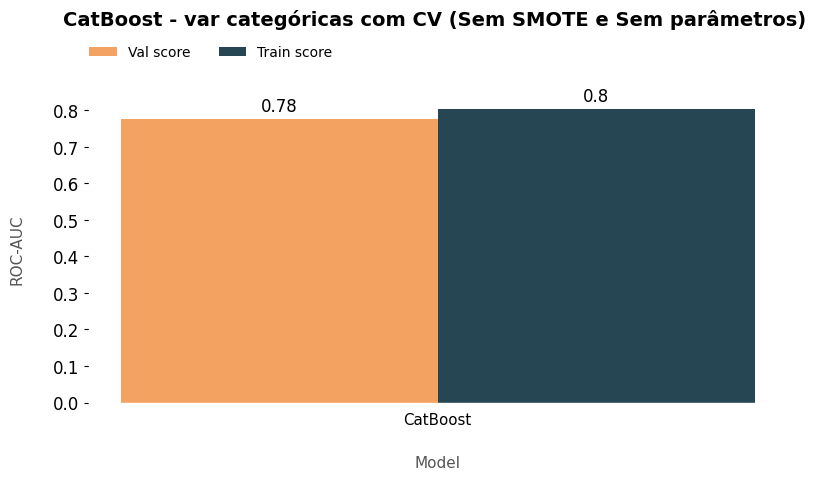

In [122]:
def plot_classification_kfold_cv(eval_dfCatBoostCat_categorico_sem_parametro, figsize=(20, 7), bar_width=0.35, title_size=12,
                             title_pad=30, label_size=11, labelpad=20, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_dfCatBoostCat_categorico_sem_parametro['model']))
        y = np.arange(len(eval_dfCatBoostCat_categorico_sem_parametro['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_dfCatBoostCat_categorico_sem_parametro['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_dfCatBoostCat_categorico_sem_parametro['train_score'], bar_width, label='Train score', color='#264653')
        
       
        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("CatBoost - var categóricas com CV (Sem SMOTE e Sem parâmetros) ", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_dfCatBoostCat_categorico_sem_parametro['model'], rotation=0, fontsize=10.8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            plt.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')]
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_dfCatBoostCat_categorico_sem_parametro, bar_width=0.35, figsize=(9, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_dfCatBoostCat_categorico_sem_parametro

### 4.1.5.5 Treinamento do modelo: CatBoost - var categóricas (com CV, sem SMOTE e com parâmetros) [campeao]

In [31]:
# Dados Eficiência Acadêmica: Modelo: CatBoost- com Cross Validation (Sem SMOTE e com parâmetros no modelo)
from sklearn.model_selection import cross_val_score, StratifiedKFold
from catboost import CatBoostClassifier
import pickle
import pandas as pd
import numpy as np
import time
import sys
import pickle
from warnings import filterwarnings
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score
)

filterwarnings('ignore')

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 
                'região_metropolina_ue']

# Ajustar tipos das variáveis categóricas
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)


# Cria o modelo primeiro
modelo_catboost_categorico_com_parametro = CatBoostClassifier(
    auto_class_weights='Balanced',
    eval_metric='AUC',
    verbose=0
    
    
)

# Depois cria o dicionário
model_catboost_categorico_sem_parametro = {
    'CatBoost_categorico_com_parametro': modelo_catboost_categorico_com_parametro
}


def classification_kfold_cv_catboost(X_cat_train, y_cat_train, X_cat_test, y_cat_test, cat_features, n_folds=5):
    try:
        start_time = time.time()

       

        # Treinar com dados completos
        modelo_catboost_categorico_com_parametro.fit(X_cat_train, y_cat_train, cat_features=cat_features)

        # Salvando o modelo treinado
        with open('catboost_cv_parametro_modelo_campeao.pkl', 'wb') as f:
            pickle.dump(modelo_catboost_categorico_com_parametro, f)
        
        # Previsões no teste
        y_pred = modelo_catboost_categorico_com_parametro.predict(X_cat_test)
        y_proba_test = modelo_catboost_categorico_com_parametro.predict_proba(X_cat_test)[:, 1]

        accuracy = accuracy_score(y_cat_test, y_pred)
        precision = precision_score(y_cat_test, y_pred) #average='weighted'
        recall = recall_score(y_cat_test, y_pred)
        f1 = f1_score(y_cat_test, y_pred)
        roc_auc = roc_auc_score(y_cat_test, y_proba_test)

        # Previsões no treino
        y_train_proba = modelo_catboost_categorico_com_parametro.predict_proba(X_cat_train)[:, 1]
        train_score = roc_auc_score(y_cat_train, y_train_proba)

        # Validação cruzada
        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        val_scores = []

        for train_idx, val_idx in stratified_kfold.split(X_cat_train, y_cat_train):
            X_t, X_v = X_cat_train.iloc[train_idx], X_cat_train.iloc[val_idx]
            y_t, y_v = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]
            
            model_fold = CatBoostClassifier(
                auto_class_weights='Balanced',
                eval_metric='AUC',
                verbose=0
            )
            

            model_fold.fit(X_t, y_t, cat_features=cat_features, verbose=0)
            y_val_proba = model_fold.predict_proba(X_v)[:, 1]
            val_scores.append(roc_auc_score(y_v, y_val_proba))

        val_scores = np.array(val_scores)
        avg_val_score = val_scores.mean()
        val_score_std = val_scores.std()
        training_time = time.time() - start_time

        # Impressão
        print('--- CatBoostClassifier ---')
        print(classification_report(y_cat_test, y_pred))
        print(f'Confusion Matrix:\n{confusion_matrix(y_cat_test, y_pred)}')
        print(f'Accuracy: {accuracy:.4f}')
        print(f'Precision: {precision:.4f}')
        print(f'Recall: {recall:.4f}')
        print(f'F1 Score (Test): {f1:.4f}')
        print(f'ROC AUC: {roc_auc:.4f}')
        print('=' * 50)
        print('Validação cruzada (ROC AUC)')
        print(f'Training score: {train_score:.4f}')
        print(f'Average validation score: {avg_val_score:.4f}')
        print(f'Standard deviation: {val_score_std:.4f}')
        print(f'Training time: {round(training_time, 2)} seconds')
        print('=' * 50)

        eval_df_catboost_categorico_com_parametro = pd.DataFrame({
            'model': ['CatBoost'],
            'avg_val_score': [avg_val_score],
            'train_score': [train_score]
        })

        results_df_catboost_categorico_com_parametro = pd.DataFrame([[
            'CatBoost', accuracy, precision, recall, f1, roc_auc
        ]], columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

        return modelo_catboost_categorico_com_parametro, eval_df_catboost_categorico_com_parametro, results_df_catboost_categorico_com_parametro

    except Exception as e:
        print(f"Ocorreu um erro: {e}")
        raise

# Chamada da função
modelo_catboost_categorico_com_parametro, eval_df_catboost_categorico_com_parametro, results_df_catboost_categorico_com_parametro = classification_kfold_cv_catboost(
    X_cat_train=X_cat_train,
    y_cat_train=y_cat_train,
    X_cat_test=X_cat_test,
    y_cat_test=y_cat_test,
    cat_features=cat_features,
    n_folds=5
)

# Salvando o modelo para utilização no Simulador de evasão
modelo_catboost_categorico_com_param = model_catboost_categorico_sem_parametro['CatBoost_categorico_com_parametro']


results_df_catboost_categorico_com_parametro


--- CatBoostClassifier ---
              precision    recall  f1-score   support

           0       0.77      0.74      0.75     17102
           1       0.65      0.69      0.67     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.71      0.71     29151
weighted avg       0.72      0.72      0.72     29151

Confusion Matrix:
[[12607  4495]
 [ 3736  8313]]
Accuracy: 0.7176
Precision: 0.6490
Recall: 0.6899
F1 Score (Test): 0.6689
ROC AUC: 0.7794
Validação cruzada (ROC AUC)
Training score: 0.8034
Average validation score: 0.7761
Standard deviation: 0.0022
Training time: 785.5 seconds


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CatBoost,0.717643,0.649047,0.689933,0.668866,0.779436


,model,avg_val_score,train_score
0,CatBoost,0.776058,0.803384


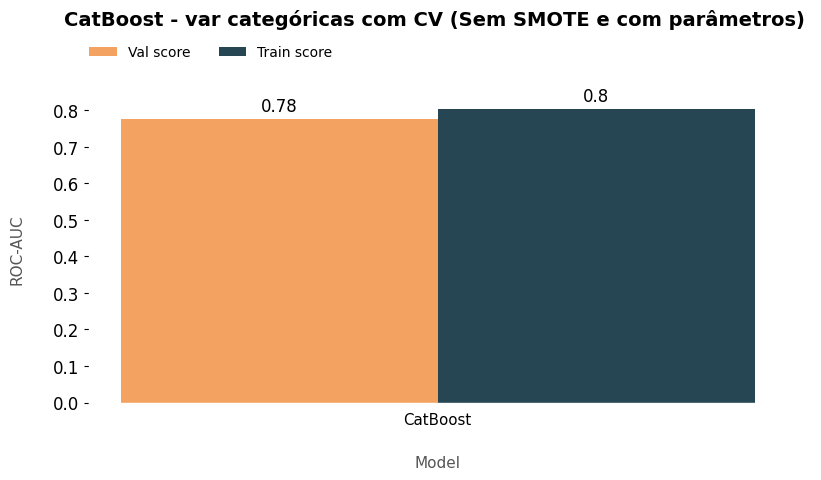

In [32]:
def plot_classification_kfold_cv(eval_df_catboost_categorico_com_parametro, figsize=(20, 7), bar_width=0.35, title_size=12,
                             title_pad=30, label_size=11, labelpad=20, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_df_catboost_categorico_com_parametro['model']))
        y = np.arange(len(eval_df_catboost_categorico_com_parametro['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_df_catboost_categorico_com_parametro['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_df_catboost_categorico_com_parametro['train_score'], bar_width, label='Train score', color='#264653')
        
       
        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("CatBoost - var categóricas com CV (Sem SMOTE e com parâmetros) ", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_df_catboost_categorico_com_parametro['model'], rotation=0, fontsize=10.8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            plt.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')]
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_df_catboost_categorico_com_parametro, bar_width=0.35, figsize=(9, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_df_catboost_categorico_com_parametro

### 4.1.5.6 Treinamento do modelo: CatBoost - var categóricas (com CV, com SMOTE e sem parâmetros)

In [ ]:
# CatBoost - com CV, sem parametros
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score
)
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTENC
import pandas as pd
import numpy as np
import time
import pickle

from warnings import filterwarnings

filterwarnings('ignore')

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

# Garantir que são strings para o CatBoost
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)

# Obter índices das colunas categóricas
cat_indices = [X_cat_train.columns.get_loc(col) for col in cat_features]

def classification_kfold_cv_catboost(X_cat_train, y_cat_train, X_cat_test, y_cat_test, cat_features, n_folds=5):
    try:
        start_time = time.time()

        model_name = "CatBoost_categorico_SMOTE"  # Nome do modelo
        model = CatBoostClassifier(
            verbose=0
        )

        # Treinamento completo (sem SMOTE)
        model.fit(X_cat_train, y_cat_train, cat_features=cat_features)

        y_pred = model.predict(X_cat_test)
        y_proba_test = model.predict_proba(X_cat_test)[:, 1]

        accuracy = accuracy_score(y_cat_test, y_pred)
        precision = precision_score(y_cat_test, y_pred) #average='weighted'
        recall = recall_score(y_cat_test, y_pred)
        f1 = f1_score(y_cat_test, y_pred)
        roc_auc = roc_auc_score(y_cat_test, y_proba_test)

        # Previsões no treino
        y_train_proba = model.predict_proba(X_cat_train)[:, 1]
        train_score = roc_auc_score(y_cat_train, y_train_proba)

        # Validação cruzada com SMOTE
        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        val_scores = []

        for train_idx, val_idx in stratified_kfold.split(X_cat_train, y_cat_train):
            X_t, X_v = X_cat_train.iloc[train_idx].copy(), X_cat_train.iloc[val_idx].copy()
            y_t, y_v = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]

            # SMOTE com variáveis categóricas
            smote = SMOTENC(categorical_features=cat_indices, random_state=42)
            X_t_res, y_t_res = smote.fit_resample(X_t, y_t)

            model.fit(X_t_res, y_t_res, cat_features=cat_features, verbose=0)
            
            # Salvar o modelo treinado em um arquivo pickle
            with open('catboost_cv_SMOTE_modelo_campeao.pkl', 'wb') as f:
                pickle.dump(model, f)
            
            
            y_val_proba = model.predict_proba(X_v)[:, 1]
            val_scores.append(roc_auc_score(y_v, y_val_proba))

        val_scores = np.array(val_scores)
        avg_val_score = val_scores.mean()
        val_score_std = val_scores.std()
        training_time = time.time() - start_time

        # Impressão
        print('--- CatBoostClassifier com SMOTE ---')
        print(classification_report(y_cat_test, y_pred))
        print(f'Confusion Matrix:\n{confusion_matrix(y_cat_test, y_pred)}')
        print(f'Accuracy: {accuracy:.4f}')
        print(f'Precision: {precision:.4f}')
        print(f'Recall: {recall:.4f}')
        print(f'F1 Score (Test): {f1:.4f}')
        print(f'ROC AUC (Test): {roc_auc:.4f}')
        print('=' * 50)
        print('Validação cruzada com SMOTE (ROC AUC)')
        print(f'Training score: {train_score:.4f}')
        print(f'Average validation score: {avg_val_score:.4f}')
        print(f'Standard deviation: {val_score_std:.4f}')
        print(f'Training time: {round(training_time, 2)} seconds')
        print('=' * 50)

        eval_dfCatBoostCatSmt = pd.DataFrame({
            'model': [model_name],
            'avg_val_score': [avg_val_score],
            'train_score': [train_score]
        })

        results_df = pd.DataFrame([[
            model_name, accuracy, precision, recall, f1, roc_auc
        ]], columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

        return eval_dfCatBoostCatSmt, results_df

    except Exception as e:
        print(f"Ocorreu um erro: {e}")
        raise

# Chamada da função
eval_df_CatBoostEfCategoricoSmt, results_CatCategoriasEfCategoricoSmt = classification_kfold_cv_catboost(
    X_cat_train=X_cat_train,
    y_cat_train=y_cat_train,
    X_cat_test=X_cat_test,
    y_cat_test=y_cat_test,
    cat_features=cat_features,
    n_folds=5
)

results_CatCategoriasEfCategoricoSmt


--- CatBoostClassifier com SMOTE ---
              precision    recall  f1-score   support

           0       0.74      0.81      0.77     17102
           1       0.69      0.59      0.64     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.70      0.70     29151
weighted avg       0.72      0.72      0.72     29151

Confusion Matrix:
[[13927  3175]
 [ 4959  7090]]
Accuracy: 0.7210
Precision: 0.7181
Recall: 0.5884
F1 Score (Test): 0.6355
ROC AUC (Test): 0.7788
Validação cruzada com SMOTE (ROC AUC)
Training score: 0.8025
Average validation score: 0.7732
Standard deviation: 0.0023
Training time: 1205.88 seconds


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CatBoost_categorico_SMOTE,0.72097,0.71811,0.588431,0.635475,0.778824


,model,avg_val_score,train_score
0,CatBoost_categorico_SMOTE,0.773233,0.802467


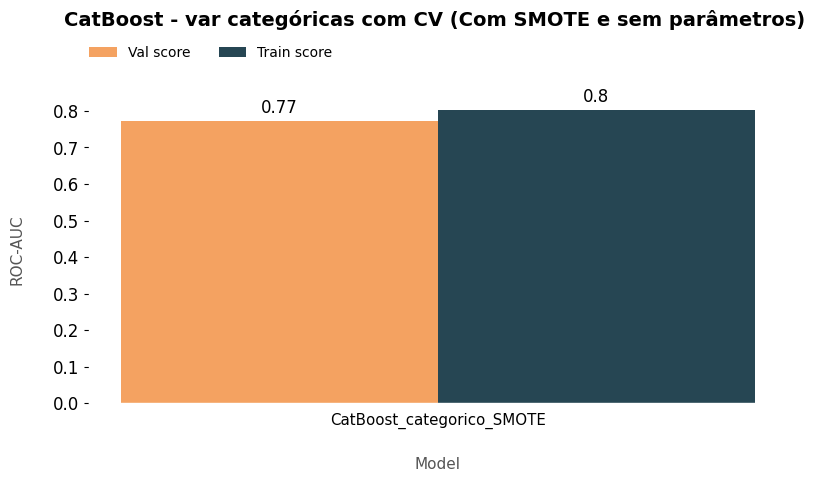

In [161]:
def plot_classification_kfold_cv(eval_df_CatBoostEfCategoricoSmt, figsize=(20, 7), bar_width=0.35, title_size=12,
                             title_pad=30, label_size=11, labelpad=20, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_df_CatBoostEfCategoricoSmt['model']))
        y = np.arange(len(eval_df_CatBoostEfCategoricoSmt['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_df_CatBoostEfCategoricoSmt['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_df_CatBoostEfCategoricoSmt['train_score'], bar_width, label='Train score', color='#264653')
        
       
        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("CatBoost - var categóricas com CV (Com SMOTE e sem parâmetros) ", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_df_CatBoostEfCategoricoSmt['model'], rotation=0, fontsize=10.8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            plt.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')]
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_df_CatBoostEfCategoricoSmt, bar_width=0.35, figsize=(9, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_df_CatBoostEfCategoricoSmt

## 4.1.5.1 CatBoost variáveis categóricas - com e sem SMOTE (na mão)

### - CatBoost - variáveis categóricas - sem parametros e sem smote

In [162]:
#Modelo Campeão -  CatBoost categórico - Melhor Precision e ROC-aUC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from catboost import CatBoostClassifier
import pandas as pd
import numpy as np
import pickle
import time

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 
                'região_metropolina_ue']

# Ajuste do tipo das variáveis categóricas
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)


# Instanciação do modelo
model_instance = CatBoostClassifier()

# Medir tempo de treino
start_time = time.time()

# Treinar no conjunto completo de treino
model_instance.fit(X_cat_train, y_cat_train, cat_features=cat_features)

# Previsão e métricas no teste
y_pred = model_instance.predict(X_cat_test)
y_proba_test = model_instance.predict_proba(X_cat_test)[:, 1]

accuracy = accuracy_score(y_cat_test, y_pred)
precision = precision_score(y_cat_test, y_pred) #average='weighted'
recall = recall_score(y_cat_test, y_pred)
f1 = f1_score(y_cat_test, y_pred)
roc_auc = roc_auc_score(y_cat_test, y_proba_test)

# Previsão no treino para AUC
y_cat_train_pred = model_instance.predict_proba(X_cat_train)[:, 1]
train_score = roc_auc_score(y_cat_train, y_cat_train_pred)

# Validação cruzada
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
val_scores = []

# DataFrame para armazenar os resultados
results = []

for train_idx, val_idx in stratified_kfold.split(X_cat_train, y_cat_train):
    X_t, X_v = X_cat_train.iloc[train_idx], X_cat_train.iloc[val_idx]
    y_t, y_v = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]
    
    model_instance.fit(X_t, y_t, cat_features=cat_features, verbose=0)

    # Salvando o modelo treinado
    with open('catboost_cv_parametro_categorico_roc_auc.pkl', 'wb') as f:
        pickle.dump(model_instance, f)

    y_cat_pred = model_instance.predict_proba(X_v)[:, 1]
    val_scores.append(roc_auc_score(y_v, y_cat_pred))

val_scores = np.array(val_scores)
avg_val_score = val_scores.mean()
val_score_std = val_scores.std()
training_time = time.time() - start_time

# Exibir os resultados
print('--- CatBoostClassifier ---')
print(classification_report(y_cat_test, y_pred))
print(f'Confusion Matrix:\n{confusion_matrix(y_cat_test, y_pred)}')
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score (Test): {f1:.4f}')
print(f'ROC AUC (Test): {roc_auc:.4f}')
print('=' * 50)
print('Validação cruzada (ROC AUC)')
print(f'Training score: {train_score:.4f}')
print(f'Average validation score: {avg_val_score:.4f}')
print(f'Standard deviation: {val_score_std:.4f}')
print(f'Training time: {round(training_time, 2)} seconds')
print('=' * 50)

results.append(['CatBoost', accuracy, precision, recall, f1, roc_auc])
# Organizar os resultados
eval_df5 = pd.DataFrame({
    'model': ['CatBoost'],
    'avg_val_score': [avg_val_score],
    'train_score': [train_score]
})


# Criar DataFrame com os resultados
results_CatCategoriasEf = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
results_CatCategoriasEf = results_CatCategoriasEf.sort_values(by='F1 Score', ascending=False)

results_CatCategoriasEf

Learning rate set to 0.078599
0:	learn: 0.6803623	total: 162ms	remaining: 2m 42s
1:	learn: 0.6693255	total: 304ms	remaining: 2m 31s
2:	learn: 0.6604969	total: 424ms	remaining: 2m 20s
3:	learn: 0.6524803	total: 563ms	remaining: 2m 20s
4:	learn: 0.6456331	total: 684ms	remaining: 2m 16s
5:	learn: 0.6396947	total: 791ms	remaining: 2m 11s
6:	learn: 0.6343751	total: 912ms	remaining: 2m 9s
7:	learn: 0.6304566	total: 1.01s	remaining: 2m 5s
8:	learn: 0.6266478	total: 1.13s	remaining: 2m 4s
9:	learn: 0.6232255	total: 1.26s	remaining: 2m 5s
10:	learn: 0.6204572	total: 1.39s	remaining: 2m 5s
11:	learn: 0.6171255	total: 1.51s	remaining: 2m 4s
12:	learn: 0.6144406	total: 1.64s	remaining: 2m 4s
13:	learn: 0.6119835	total: 1.78s	remaining: 2m 5s
14:	learn: 0.6100575	total: 1.9s	remaining: 2m 4s
15:	learn: 0.6076750	total: 2.04s	remaining: 2m 5s
16:	learn: 0.6057959	total: 2.17s	remaining: 2m 5s
17:	learn: 0.6044243	total: 2.34s	remaining: 2m 7s
18:	learn: 0.6020058	total: 2.47s	remaining: 2m 7s
19:	le

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CatBoost,0.72097,0.690697,0.588431,0.635475,0.778824


,model,avg_val_score,train_score
0,CatBoost,0.776224,0.802467


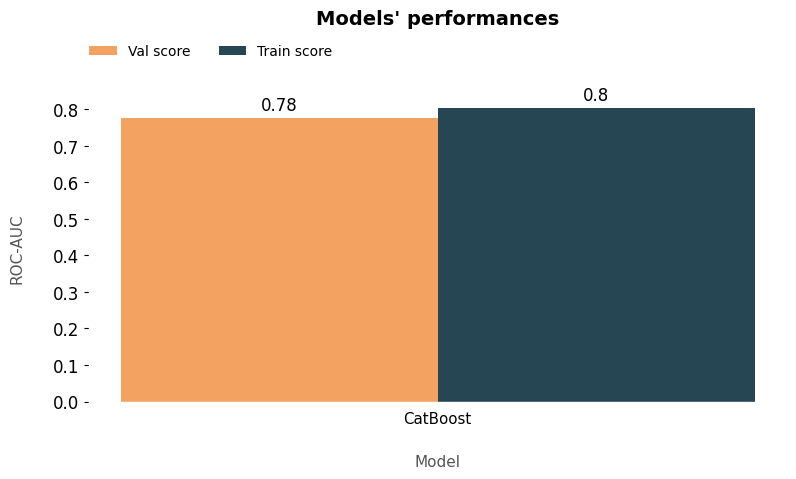

In [163]:
def plot_classification_kfold_cv(eval_df5, figsize=(20, 7), bar_width=0.35, title_size=15,
                             title_pad=30, label_size=11, labelpad=20, legend_x=0.08, legend_y=1.08):
    '''
    Plot classification performance using k-fold cross-validation.

    Parameters:
        eval_df (DataFrame): DataFrame containing evaluation metrics for different models.
        figsize (tuple, optional): Figure size (width, height). Defaults to (20, 7).
        bar_width (float, optional): Width of bars in the plot. Defaults to 0.35.
        title_size (int, optional): Font size of the plot title. Defaults to 15.
        title_pad (int, optional): Padding of the plot title. Defaults to 30.
        label_size (int, optional): Font size of axis labels. Defaults to 11.
        labelpad (int, optional): Padding of axis labels. Defaults to 20.
        legend_x (float, optional): x-coordinate of legend position. Defaults to 0.08.
        legend_y (float, optional): y-coordinate of legend position. Defaults to 1.08.

    Raises:
        CustomException: Raised if an unexpected error occurs.

    Returns:
        None
    '''
    try:
        # Plot each model and their train and validation (average) scores.
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(eval_df5['model']))
        y = np.arange(len(eval_df5['train_score']))

        val_bars = ax.bar(x - bar_width/2, eval_df5['avg_val_score'], bar_width, label='Val score', color='#f4a261')
        train_bars = ax.bar(x + bar_width/2, eval_df5['train_score'], bar_width, label='Train score', color='#264653')
        
       
        ax.set_xlabel('Model', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_ylabel('ROC-AUC', labelpad=labelpad, fontsize=label_size, loc='center')
        ax.set_title("Models' performances", fontweight='bold', fontsize=title_size, pad=title_pad, loc='center')
        ax.set_xticks(x, eval_df5['model'], rotation=0, fontsize=10.8)
        ax.tick_params(axis='x', which='both', bottom=False)
        ax.tick_params(axis='y')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)
        
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)

        # Add scores on top of each bar
        for bar in val_bars + train_bars:
            height = bar.get_height()
            plt.annotate('{}'.format(round(height, 2)),
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha='center', va='bottom')

        # Define handles and labels for the legend with adjusted sizes
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#f4a261', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#264653', edgecolor = 'none')]
        labels = ['Val score', 'Train score']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(legend_x, legend_y), frameon=False, ncol=2, fontsize=10)
    
    except Exception as e:
        raise CustomException(e, sys)

plot_classification_kfold_cv(eval_df5, bar_width=0.35, figsize=(9, 4), title_size=14, legend_x=0.175, legend_y=1.2, title_pad=50)

eval_df5

### - CatBoost - variáveis categóricas - com parâmetros

In [132]:
# Com parametros com cross validation
import pickle
# Modelo CatBoost com pesos automáticos

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 
                'região_metropolina_ue']

# Ajuste do tipo das variáveis categóricas
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)



catboost_cv_categorico_parametro_final = CatBoostClassifier(
                eval_metric= 'Recall',
                loss_function= 'Logloss',
                random_state= 42,
                verbose= 0,
                iterations= 711, 
                learning_rate= 0.024368796322029162, 
                depth= 10, 
                l2_leaf_reg= 4.29893444899238, 
                bagging_temperature= 0.6447420895697897, 
                random_strength= 0.14441656066543232, 
                one_hot_max_size= 235, 
                max_ctr_complexity= 2, 
                rsm= 0.8049049786219732, 
                subsample= 0.8539436371139939, 
                grow_policy= 'SymmetricTree', 
                auto_class_weights= 'Balanced'
                # 'auto_class_weights': None
        # auto_class_weights='Balanced',
        # eval_metric='AUC',
        # random_state=42,
        # verbose=0
        # eval_metric="Recall",                # Mudamos a métrica interna para otimizar Recall
        # loss_function="Logloss",              # Continua com Logloss para classificação binária
        # random_state=42,
        # verbose=0,
        # iterations=900,                       # Aumentei um pouco para ter mais espaço para aprender
        # learning_rate=0.02,                   # Um pouquinho mais baixo, para aprendizado mais cuidadoso
        # depth=10,
        # l2_leaf_reg=3.5,                      # Menos regularização para deixar o modelo mais flexível (pode captar mais positivos)
        # bagging_temperature=0.5,              # Reduzido: mais diversidade sem perder tanto recall
        # random_strength=0.1,                  # Menor, para menos aleatoriedade
        # one_hot_max_size=235,
        # max_ctr_complexity=2,
        # rsm=0.8,
        # subsample=0.85,
        # grow_policy='SymmetricTree',
        # auto_class_weights='Balanced'         # Ativar balanceamento automático para puxar recall da minoria
        
    
)

# Validação cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_cat_train, y_cat_train), 1):
    X_tr, X_val = X_cat_train.iloc[train_idx], X_cat_train.iloc[val_idx]
    y_tr, y_val = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]

    catboost_cv_categorico_parametro_final.fit(X_tr, y_tr, cat_features=cat_features, verbose=0)
    
    # Salvando o modelo treinado
    # with open('catboost_cv_parametro_categorico_final.pkl', 'wb') as f:
    #     pickle.dump(catboost_cv_categorico_parametro_final, f)
        
    y_pred_val = catboost_cv_categorico_parametro_final.predict(X_val)

In [133]:
catboost_cv_categorico_parametro_final.fit(X_cat_train, y_cat_train, cat_features=['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 'uf', 'regiao', 'instituicao', 'região_metropolina_ue'])  # Treina com todo o conjunto de treino


In [134]:
importances = catboost_cv_categorico_parametro_final.get_feature_importance(type='PredictionValuesChange')
feature_importances = pd.Series(importances, index=X.columns).sort_values(ascending=False)
feature_importances

instituicao              12.346790
uf                       11.382735
tipo_de_oferta           10.788115
idade                    10.700016
nome_de_curso             9.883777
renda_familiar            9.648966
turno                     7.170408
eixo_tecnologico          6.129701
região_metropolina_ue     5.813196
regiao                    5.567541
cor_raca                  4.860880
sexo                      2.482560
carga_horaria_minima      2.136734
modalidade_de_ensino      1.088581
dtype: float64

In [135]:
y_predc_catboost_cv_categprico_parametro_final = catboost_cv_categorico_parametro_final.predict(X_cat_test) 

In [136]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_cat_test, y_predc_catboost_cv_categprico_parametro_final))
accuracy = accuracy_score(y_cat_test, y_predc_catboost_cv_categprico_parametro_final)
print("accuracy", accuracy)
precision = precision_score(y_cat_test, y_predc_catboost_cv_categprico_parametro_final) # average='weighted'
print("precision", precision)
recall = recall_score(y_cat_test, y_predc_catboost_cv_categprico_parametro_final)
print("recall", recall)
f1 = f1_score(y_cat_test, y_predc_catboost_cv_categprico_parametro_final)
print("f1", f1)
roc = roc_auc_score(y_cat_test, y_predc_catboost_cv_categprico_parametro_final)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_cat_test, y_predc_catboost_cv_categprico_parametro_final)
print("Matriz de Confusão", matrix)


              precision    recall  f1-score   support

           0       0.77      0.73      0.75     17102
           1       0.64      0.69      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.71      0.71      0.71     29151
weighted avg       0.72      0.71      0.71     29151

accuracy 0.7127714315117835
precision 0.6421060770063399
recall 0.6892688189891277
f1 0.6648520994276108
ROC-AUC 0.7092993609622285
Matriz de Confusão [[12473  4629]
 [ 3744  8305]]


### - CatBoost - Variáveis Categóricas - com SMOTE

In [169]:
# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

# Garantir que sejam string (obrigatório para CatBoost)
X_cat_train[cat_features] = X_cat_train[cat_features].astype(str)
X_cat_test[cat_features] = X_cat_test[cat_features].astype(str)

# Índices das variáveis categóricas (necessário para SMOTENC)
cat_indices = [X_cat_train.columns.get_loc(col) for col in cat_features]

# Modelo
catboost_cv_categorico_SMOTE = CatBoostClassifier(verbose=0)

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_preds = []
y_trues = []

for train_idx, val_idx in skf.split(X_cat_train, y_cat_train):
    X_tr, X_val = X_cat_train.iloc[train_idx].copy(), X_cat_train.iloc[val_idx].copy()
    y_tr, y_val = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]

    # SMOTENC com variáveis categóricas
    smote = SMOTENC(categorical_features=cat_indices, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X_tr, y_tr)

    # Treinar modelo com dados balanceados
    catboost_cv_categorico_SMOTE.fit(X_resampled, y_resampled, cat_features=cat_features)

    # Salvando o modelo treinado
    # with open('catboost_cv_parametro_categorico_SMOTE_final.pkl', 'wb') as f:
    #     pickle.dump(catboost_cv_categorico_parametro_final, f)


    # Predição no conjunto de validação
    y_pred = catboost_cv_categorico_SMOTE.predict(X_val)

    # Armazenar previsões
    y_preds.extend(y_pred)
    y_trues.extend(y_val)

In [170]:
print(f'Train target proportion: ')
print(f'{y_cat_train.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_cat_test.value_counts(normalize=True)}')
print('--------------------------------------------------- SMOTE --------------------------------------------------')

print(f'Train target proportion: ')
print(f'{y_resampled.value_counts(normalize=True)}')
print('----------------------------------------')
print(f'\nTest target proportion: ')
print(f'{y_cat_test.value_counts(normalize=True)}')

Train target proportion: 
evadido
0    0.586672
1    0.413328
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64
--------------------------------------------------- SMOTE --------------------------------------------------
Train target proportion: 
evadido
0    0.5
1    0.5
Name: proportion, dtype: float64
----------------------------------------

Test target proportion: 
evadido
0    0.586669
1    0.413331
Name: proportion, dtype: float64


In [171]:
y_resampled.value_counts()

evadido
0    54725
1    54725
Name: count, dtype: int64

In [172]:
model_catboost_categorico_SMOTEEf = CatBoostClassifier()

model_catboost_categorico_SMOTEEf.fit(X_resampled, y_resampled, cat_features=['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 'uf', 'regiao', 'instituicao', 'região_metropolina_ue'])
y_predc_catboost_categoricio_SMOTEEf = model_catboost_categorico_SMOTEEf.predict(X_cat_test)

Learning rate set to 0.076503
0:	learn: 0.6823695	total: 257ms	remaining: 4m 16s
1:	learn: 0.6733273	total: 534ms	remaining: 4m 26s
2:	learn: 0.6656479	total: 815ms	remaining: 4m 31s
3:	learn: 0.6590594	total: 1.03s	remaining: 4m 16s
4:	learn: 0.6533147	total: 1.24s	remaining: 4m 6s
5:	learn: 0.6483789	total: 1.48s	remaining: 4m 5s
6:	learn: 0.6442568	total: 1.8s	remaining: 4m 16s
7:	learn: 0.6407676	total: 2.02s	remaining: 4m 10s
8:	learn: 0.6366929	total: 2.27s	remaining: 4m 9s
9:	learn: 0.6329728	total: 2.5s	remaining: 4m 7s
10:	learn: 0.6299688	total: 2.75s	remaining: 4m 7s
11:	learn: 0.6270679	total: 3.04s	remaining: 4m 9s
12:	learn: 0.6249305	total: 3.35s	remaining: 4m 14s
13:	learn: 0.6202229	total: 3.63s	remaining: 4m 15s
14:	learn: 0.6164683	total: 3.83s	remaining: 4m 11s
15:	learn: 0.6131712	total: 4.05s	remaining: 4m 8s
16:	learn: 0.6102452	total: 4.25s	remaining: 4m 5s
17:	learn: 0.6077900	total: 4.52s	remaining: 4m 6s
18:	learn: 0.6056071	total: 4.73s	remaining: 4m 4s
19:	

In [173]:
# Print classification report and calculate its metrics to include in the final metrics df.
print(classification_report(y_testEf, y_predc_catboost_categoricio_SMOTEEf))
accuracy = accuracy_score(y_testEf, y_predc_catboost_categoricio_SMOTEEf)
print("accuracy", accuracy)
precision = precision_score(y_testEf, y_predc_catboost_categoricio_SMOTEEf) # average='weighted'
print("precision", precision)
recall = recall_score(y_testEf, y_predc_catboost_categoricio_SMOTEEf)
print("recall", recall)
f1 = f1_score(y_testEf, y_predc_catboost_categoricio_SMOTEEf)
print("f1", f1)
roc = roc_auc_score(y_testEf, y_predc_catboost_categoricio_SMOTEEf)
print("ROC-AUC", roc)
matrix = confusion_matrix(y_testEf, y_predc_catboost_categoricio_SMOTEEf)
print("Matriz de Confusão", matrix)



              precision    recall  f1-score   support

           0       0.77      0.73      0.75     17102
           1       0.64      0.69      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.71      0.71      0.71     29151
weighted avg       0.72      0.71      0.71     29151

accuracy 0.7128057356522932
precision 0.6422657277721892
recall 0.6888538467922649
f1 0.6647445138555181
ROC-AUC 0.7092672929435538
Matriz de Confusão [[12479  4623]
 [ 3749  8300]]


# -------------------------------------------------------------------------------------------

O que diz sobre a predição do modelo (ROC AUC Score)?

Um <b>ROC AUC</b> alto mostra que o modelo está tomando boas decisões na separação das classes, mesmo que o limiar de decisão varie.

Se o ROC AUC for muito diferente entre treino e validação, pode indicar overfitting ou underfitting:

<b>Overfitting:</b> Se o train_score for muito maior que o avg_val_score, o modelo pode estar se ajustando demais aos dados de treinamento e não generalizando bem para novos dados.

<b>Underfitting:</b> Se ambos os scores forem baixos, o modelo pode ser fraco para capturar os padrões dos dados.

O que diz sobre a predição do modelo (Val Score Std)?

Se a média do AUC for boa, mas o desvio padrão for alto, significa que o modelo pode ter dificuldades para generalizar bem para diferentes partes do dataset.

Se a média do AUC for boa e o desvio padrão for baixo, o modelo provavelmente tem boa generalização.

- Média dos scores de validação (avg_val_score) → Mede a performance geral do modelo.

- Desvio padrão dos scores de validação (val_score_std) → Mede a estabilidade do modelo entre os folds.

- Score no treinamento (train_score) → Se for muito alto comparado ao de validação, pode indicar overfitting.

Conclusão

<b>ROC AUC Score alto</b> (> 0.80 em treino e validação)
→ O modelo está separando bem as classes.

Se o <b>train_score</b> for muito maior que avg_val_score
→ Pode indicar overfitting.

Se o <b>val_score_std</b> for muito alto (> 0.05)
→ O modelo tem variação alta entre os folds, o que pode indicar sensibilidade ao conjunto de dados.

Se <b>avg_val_score</b> for baixo (< 0.65)
→ O modelo pode estar underfitting e precisar de melhorias.

Os resultados são excelentes. Será utilizado o CatBoost para seleção de características, ajuste de hiperparâmetros e avaliação final do modelo, pois apresenta a maior média de ROC-AUC de validação. Embora o modelo esteja sobreajustado, com uma pontuação de ROC-AUC de 1 nos dados de treinamento, sua pontuação de validação é muito próxima (0,79). Esse desempenho não é devido a vazamento de dados, uma vez que todas as características incluídas estão presentes no momento da previsão e a divisão foi feita antes de qualquer coisa. Isso se deve à qualidade dos dados, com as variáveis independentes separando claramente os evadidos dos não evadidos. Além disso, devido ao resultado, o ajuste de hiperparâmetros nem sequer adicionaria desempenho. No entanto, para demonstrar conhecimento, será aplicado.

# _______________________________________________________________________________________________________________________________________________________________________________________

# 4.2 Feature selection (Importance)
- Visualizar a importância dos recursos pode nos ajudar a entender melhor quais recursos são mais influentes em nosso modelo.
- <i>LossFunctionChange</i> é o método para calcular a importância dos recursos no CatBoost e é o método padrão para classificar métricas.
- Embora esse método possa ser usado para qualquer modelo, ele se destaca quando usado com modelos de classificação.
- Isso ocorre porque outros tipos de importância de recursos podem gerar resultados enganosos quando usados ​​com modelos de classificação.
- Para cada recurso, LossFunctionChangecalcula a diferença entre o valor da perda do modelo com esse recurso e sem ele.

- A etapa de seleção de variáveis é fundamental para melhorar a capacidade de generalização do modelo e torná-lo menos complexo, reduzindo, assim, os custos computacionais. Considerando que há 41 variáveis, simplificar o modelo sem comprometer seu desempenho é altamente vantajoso.
- O método <b>Recursive Feature Elimination (RFE)</b> será utilizado para a seleção de variáveis.
- O Recursive Feature Elimination (RFE) é um método de seleção de variáveis que remove de forma sistemática as características irrelevantes ou menos importantes de um modelo preditivo. Ele funciona treinando o modelo recursivamente em subconjuntos de variáveis, classificando-as com base em sua importância e eliminando as menos relevantes até atingir o número desejado de variáveis.
- Um hiperparâmetro importante do RFE é o número final de variáveis selecionadas. Para definir esse valor de forma automática, será utilizada a classe RFECV do Scikit-Learn, que aplicará <b>k-fold cross validation</b> para determinar o melhor valor para esse hiperparâmetro.

In [ ]:
# LGBMClassifier LGBMClassifier -  De 256 para 166
from sklearn.base import BaseEstimator, TransformerMixin

# Recursively select the features with highest feature importances until the final desired number of features is obtained.
class RecursiveFeatureEliminator(BaseEstimator, TransformerMixin):

    def __init__(self, estimator=LGBMClassifier(), scoring='roc_auc', n_folds=5):
        '''
        Initialize the Recursive Feature Elimination (RFE) transformer.
        
        Args:
            estimator (object, default=LGBMCLassifier): The model to obtain feature importances.
            n_folds (int, default=5): The number of folds for stratified k-fold cross validation.
            scoring (object, default='roc_auc'): The scoring for cross-validation.
            
        '''
        stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
        self.rfe = RFECV(estimator=estimator, cv=stratified_kfold, scoring=scoring)

    def fit(self, X, y):

        self.rfe.fit(X, y)
        
        return self

    def transform(self, X):

        X_selected = self.rfe.transform(X)

        # Create a dataframe for the final selected features.
        selected_df = pd.DataFrame(X_selected, columns=self.rfe.get_feature_names_out())

        return selected_df

rfe = RecursiveFeatureEliminator(n_folds=5, scoring='roc_auc', estimator=LGBMClassifier())
rfe.fit(X_trainEf, y_trainEf)
X_trainLGBM_selected = rfe.transform(X_trainEf)
X_trainLGBM_selected.shape

[LightGBM] [Info] Number of positive: 38556, number of negative: 54724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 93280, number of used features: 243
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.413336 -> initscore=-0.350191
[LightGBM] [Info] Start training from score -0.350191
[LightGBM] [Info] Number of positive: 38556, number of negative: 54724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 93280, number of used features: 242
[LightGBM] [Info] 

(116600, 166)

### - Seleçao de variáveis no LightGBM

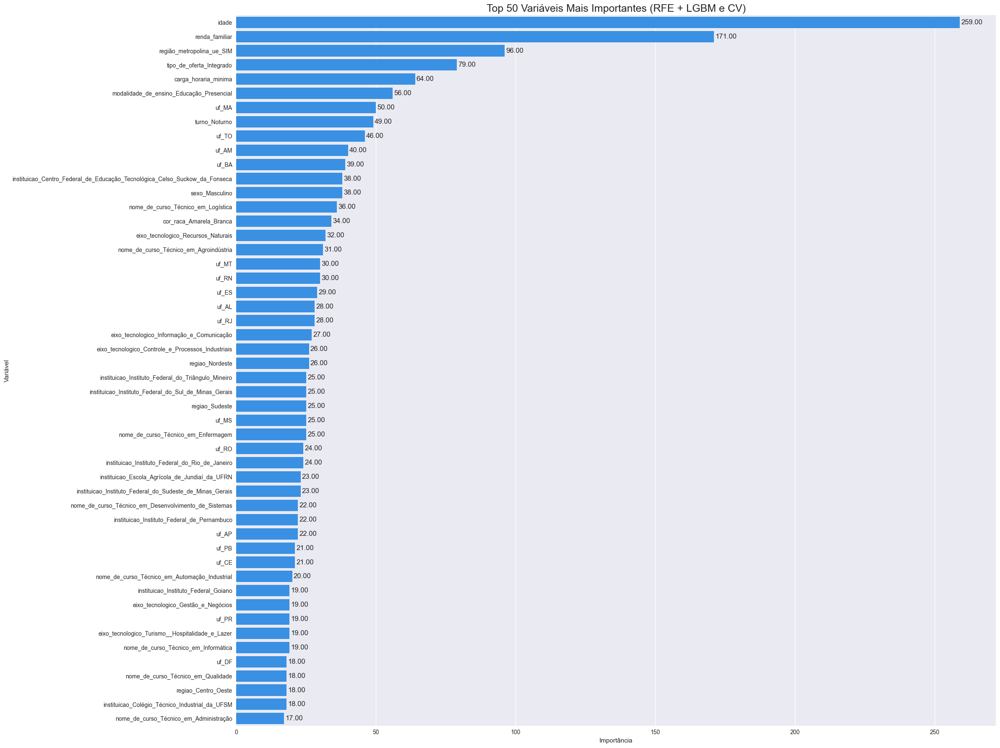

In [ ]:
# Obter as 30 variáveis mais importantes do RFE já treinado
importances = rfe.rfe.estimator_.feature_importances_
feature_names = rfe.rfe.get_feature_names_out() 

# Criar DataFrame com os nomes e importâncias
importances_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False).head(166)

# Plotar o gráfico de barras
plt.figure(figsize=(24, 18))

                                        # # Plotar gráfico de barras horizontais
                                        # plt.figure(figsize=(10, 12))
                                        # bars = plt.barh(importance_df['Feature'], importance_df['Importance'], color='mediumvioletred')
                                        # plt.gca().invert_yaxis()
                                        # plt.title('Top 30 Variáveis Mais Importantes (RFE)', fontsize=14)
                                        # plt.xlabel('Importância')

                                        # # Adicionar os valores no final de cada barra
                                        # for bar in bars:
                                        #     width = bar.get_width()
                                        #     plt.text(width + 0.005, bar.get_y() + bar.get_height()/2,
                                        #              f'{width:.3f}', va='center', fontsize=9)


sns.barplot(
    data=importances_df,
    x="Importance",
    y="Feature",
    color="dodgerblue"  # Cor única vibrante
)

# Adicionar os valores das importâncias no final de cada barra
for i, (importance, feature) in enumerate(zip(importances_df["Importance"], importances_df["Feature"])):
    plt.text(importance + 0.5, i, f'{importance:.2f}', va='center')

plt.title("Top 50 Variáveis Mais Importantes (RFE + LGBM e CV)", fontsize=18)
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.tight_layout()
plt.show()


In [ ]:
X_trainLGBM_selected.shape

(116600, 166)

In [ ]:
# Aplicar ao conjunto de teste
X_testLGBM_selected = rfe.transform(X_testEf)
X_testLGBM_selected.shape

(29151, 166)

### - Seleçao de variáveis no CatBoost binário

In [ ]:
# Usando RFE - Catboost Binário com CV - De 256 para 199
from catboost import CatBoostClassifier
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
import pandas as pd

# Configuração do CatBoostClassifier (ajuste os parâmetros conforme necessário)
catboost_model = CatBoostClassifier(
    iterations=100,
    eval_metric='AUC',
    auto_class_weights='Balanced',
    random_state=42,
    verbose=0
)

# Configuração da Validação Cruzada (5 folds estratificados)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# RFE com Validação Cruzada
rfe = RFECV(
    estimator=catboost_model,
    cv=cv,
    scoring='roc_auc',
    min_features_to_select=5  # Número mínimo de features a serem selecionadas
)

# Aplicar RFE no conjunto de treino
rfe.fit(X_trainEf, y_trainEf)

# Obter features selecionadas
selected_features = X_trainEf.columns[rfe.support_]
X_trainCatBoost_Binario_selected = X_trainEf[selected_features]

print("Número de features selecionadas:", rfe.n_features_)
print("Features selecionadas:", selected_features.tolist())
print("\nShape original:", X_trainEf.shape)
print("Shape após RFE:", X_trainCatBoost_Binario_selected.shape)

Número de features selecionadas: 231
Features selecionadas: ['idade', 'carga_horaria_minima', 'renda_familiar', 'cor_raca_Amarela_Branca', 'sexo_Masculino', 'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado', 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas', 'nome_de_curso_Fotografia', 'nome_de_curso_Informática', 'nome_de_curso_Técnico_em_Administração', 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem', 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde', 'nome_de_curso_Técnico_em_Agricultura', 'nome_de_curso_Técnico_em_Agrimensura', 'nome_de_curso_Técnico_em_Agroecologia', 'nome_de_curso_Técnico_em_Agroindústria', 'nome_de_curso_Técnico_em_Agronegócio', 'nome_de_curso_Técnico_em_Agropecuária', 'nome_de_curso_Técnico_em_Alimentação_Escolar', 'nome_de_curso_Técnico_em_Alimentos', 'nome_de_curso_Técnico_em_Análises_Clínicas', 'nome_de_curso_Técnico_em_Análises_Químicas', 'nome_de_curso_Técnico_em_Apicultura', 'nome_de_curso_Técnico_em_Aquicultura', 'nome_de_

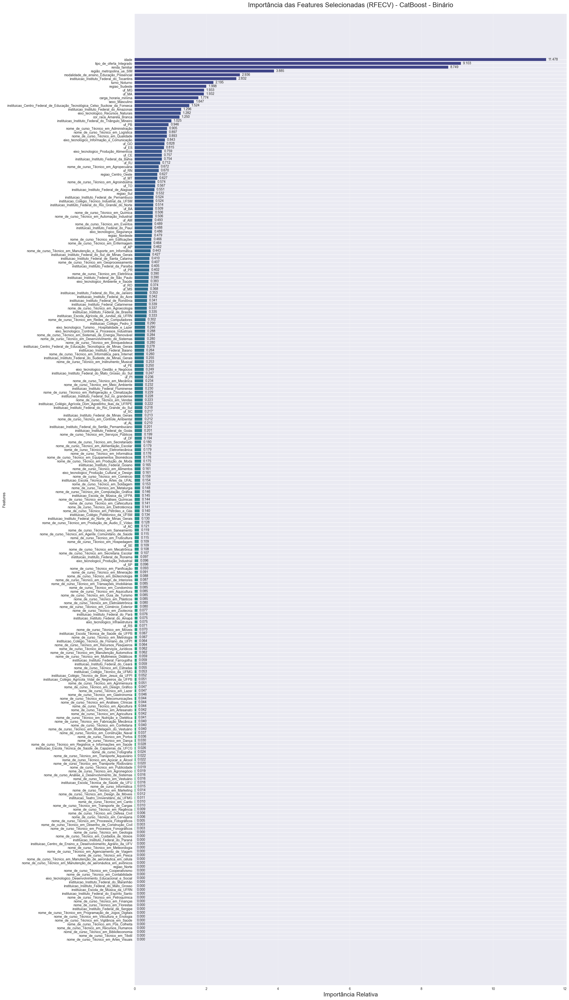

In [145]:
import matplotlib.pyplot as plt
import numpy as np

# Obter as importâncias das features selecionadas
feature_importances = rfe.estimator_.feature_importances_
importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': feature_importances
}).sort_values('Importance', ascending=False)

# Configurar o estilo do gráfico
plt.figure(figsize=(24, 42))
plt.style.use('seaborn-v0_8')

# Criar o gráfico de barras
bars = plt.barh(
    importance_df['Feature'],
    importance_df['Importance'],
    color=plt.cm.viridis(np.linspace(0.2, 0.8, len(importance_df)))
)

# Adicionar os valores no final de cada barra
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.005 * max(importance_df['Importance']),
        bar.get_y() + bar.get_height()/2,
        f'{width:.3f}',
        va='center',
        ha='left',
        fontsize=10
    )

# Configurações adicionais
plt.title('Importância das Features Selecionadas (RFECV) - CatBoost - Binário', fontsize=20, pad=20)
plt.xlabel('Importância Relativa', fontsize=18)
plt.ylabel('Features', fontsize=12)
plt.gca().invert_yaxis()  # Ordenar do maior para o menor
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()

# Mostrar o gráfico
plt.show()

In [ ]:
X_trainCatBoost_Binario_selected.shape


(116600, 231)

In [ ]:
# Aplicar ao conjunto de teste
X_testCatBoost_Binario_selected = rfe.transform(X_testEf)
X_testCatBoost_Binario_selected.shape

(29151, 166)

In [162]:
# Feature Importance Nativa do CatBoost
from catboost import CatBoostClassifier, Pool
import pandas as pd

# Treinar o modelo
model = CatBoostClassifier(iterations=100, verbose=0)
model.fit(X_trainEf, y_trainEf)

# Obter importância das features
feature_importance = model.get_feature_importance()
feature_names = X_trainEf.columns

# Criar DataFrame com importâncias
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print("Todas as features e suas importâncias:")
print(importance_df)

# Filtrar features com importância > 0.00
selected_features = importance_df[importance_df['Importance'] > 0.01]['Feature'].tolist()

print("\nFeatures selecionadas (importância > 0.00):")
print(selected_features)

# Criar novo DataFrame apenas com features selecionadas
X_trainEfCatBinario_selected = X_trainEf[selected_features]

print("\nShape do DataFrame original:", X_trainEf.shape)
print("Shape do DataFrame após seleção:", X_trainEfCatBinario_selected.shape)

Todas as features e suas importâncias:
                                               Feature  Importance
0                                                idade   11.620088
6                             tipo_de_oferta_Integrado    9.691760
2                                       renda_familiar    8.605638
255                          região_metropolina_ue_SIM    3.666786
147                                      turno_Noturno    3.222516
..                                                 ...         ...
154                           eixo_tecnologico_Militar    0.000000
62                   nome_de_curso_Técnico_em_Estética    0.000000
103                     nome_de_curso_Técnico_em_Pesca    0.000000
215                instituicao_Escola_de_Saúde_da_UFRN    0.000000
130  nome_de_curso_Técnico_em_Serviços_de_Restauran...    0.000000

[256 rows x 2 columns]

Features selecionadas (importância > 0.00):
['idade', 'tipo_de_oferta_Integrado', 'renda_familiar', 'região_metropolina_ue_SIM', 'tu

In [161]:
# Eliminação Recursiva de Features (RFE) com CatBoost
from sklearn.feature_selection import RFE

# Definir o modelo CatBoost como estimador
model = CatBoostClassifier(iterations=100, verbose=0, thread_count=-1)

# Aplicar RFE para selecionar as 10 melhores features
rfe = RFE(estimator=model, n_features_to_select=50)
rfe.fit(X_trainEf, y_trainEf)

# Obter features selecionadas
selected_features = X_trainEf.columns[rfe.support_]
print("Features selecionadas:", selected_features)

Features selecionadas: Index(['idade', 'carga_horaria_minima', 'renda_familiar',
       'cor_raca_Amarela_Branca', 'sexo_Masculino',
       'modalidade_de_ensino_Educação_Presencial', 'tipo_de_oferta_Integrado',
       'nome_de_curso_Técnico_em_Administração',
       'nome_de_curso_Técnico_em_Agroindústria',
       'nome_de_curso_Técnico_em_Alimentos',
       'nome_de_curso_Técnico_em_Enfermagem',
       'nome_de_curso_Técnico_em_Eventos',
       'nome_de_curso_Técnico_em_Logística',
       'nome_de_curso_Técnico_em_Manutenção_e_Suporte_em_Informática',
       'nome_de_curso_Técnico_em_Meio_Ambiente',
       'nome_de_curso_Técnico_em_Qualidade', 'turno_Noturno',
       'eixo_tecnologico_Controle_e_Processos_Industriais',
       'eixo_tecnologico_Informação_e_Comunicação',
       'eixo_tecnologico_Infraestrutura', 'eixo_tecnologico_Recursos_Naturais',
       'eixo_tecnologico_Segurança', 'uf_CE', 'uf_ES', 'uf_GO', 'uf_MA',
       'uf_MS', 'uf_PI', 'uf_RJ', 'uf_RN', 'uf_SP', 'uf_TO', 're

idade                                                                         12.889539
renda_familiar                                                                 9.509014
tipo_de_oferta_Integrado                                                       8.530613
região_metropolina_ue_SIM                                                      3.647157
modalidade_de_ensino_Educação_Presencial                                       2.640830
turno_Noturno                                                                  2.542251
regiao_Sudeste                                                                 2.174471
sexo_Masculino                                                                 2.070212
cor_raca_Amarela_Branca                                                        1.706608
carga_horaria_minima                                                           1.518114
uf_TO                                                                          1.405338
uf_MA                           

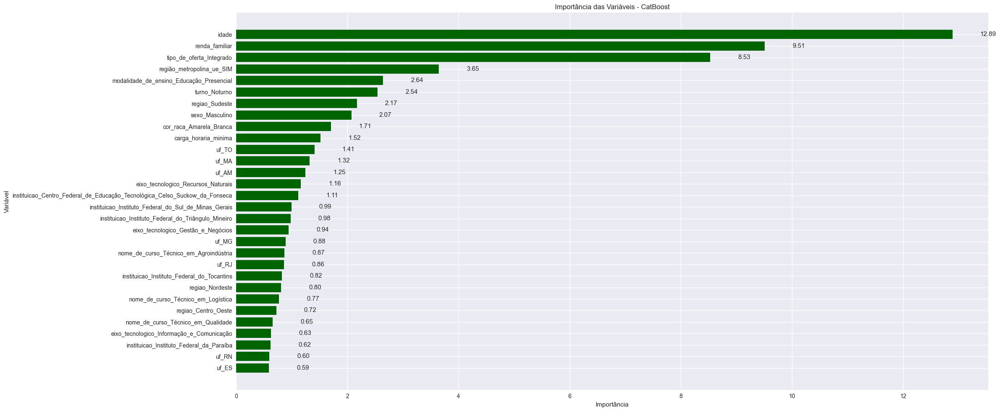

In [ ]:
#CatBoost Binário - sem CV
from catboost import CatBoostClassifier, Pool
import pandas as pd
import matplotlib.pyplot as plt

# Treina o modelo
model = CatBoostClassifier(auto_class_weights='Balanced',
                eval_metric='AUC',
                verbose=0)
model.fit(X_trainEf, y_trainEf)

# Pega a importância
importances = model.get_feature_importance() #type='PredictionValuesChange'
feature_names = X_trainEf.columns

# Pegar importâncias e ordenar em ordem decrescente
feat_imp = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Pegar as 30 features mais importantes
feat_imp_df = feat_imp.head(30).sort_values(ascending=True)  # Reordena para o gráfico horizontal


# Exibir top 10
print(feat_imp.head(30))

# Selecionar features com importância acima de um limite (ex: > 0)
# selected_features = feat_imp[feat_imp.importance > 0][feature_names].tolist()

# Selecionar features com importância acima de um limite (ex: > 0)
selected_features = feat_imp[feat_imp > 0].index.tolist()

# Filtrar os dados de treino
X_trainEf_selected = X_trainEf[selected_features]

X_cat_binario_testEf_selected = X_testEf[selected_features]
X_cat_binario_testEf_selected.shape


# Plotar gráfico de barras horizontais
plt.figure(figsize=(24, 10))

bars = plt.barh(feat_imp_df.index, feat_imp_df.values, color='darkgreen')
plt.title('Importância das Variáveis - CatBoost')
plt.xlabel('Importância')
plt.ylabel('Variável')

# Adicionar os valores ao final de cada barra
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height() / 2,
             f'{width:.2f}', va='center', fontsize=11)
    
plt.tight_layout()
plt.show()



### - Seleção de variáveis no CatBoost categórico

tipo_de_oferta           13.767074
instituicao              13.393978
idade                    12.890627
uf                       11.916370
nome_de_curso            11.608646
renda_familiar            9.260293
turno                     7.115222
cor_raca                  4.961187
eixo_tecnologico          4.724760
regiao                    4.177594
região_metropolina_ue     2.648429
sexo                      1.990647
carga_horaria_minima      1.167422
modalidade_de_ensino      0.377752
dtype: float64
Treino filtrado: (116600, 14)
Teste filtrado: (29151, 14)


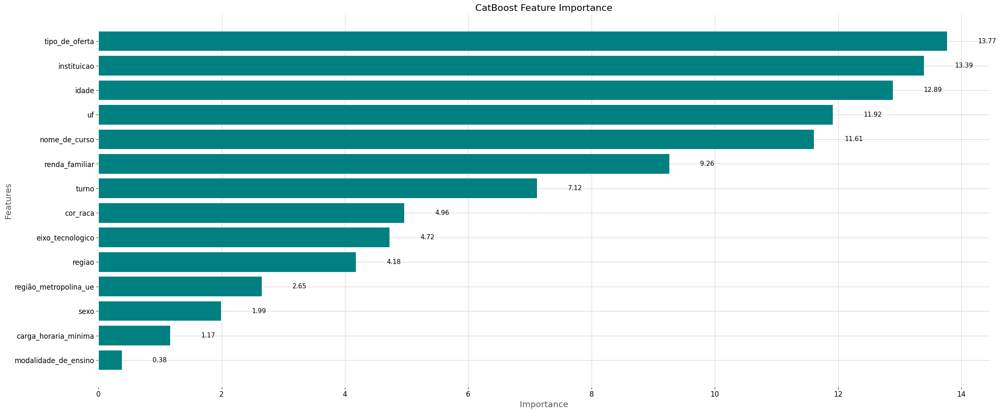

In [174]:
#CatBoost Categórico - sem CV
from catboost import CatBoostClassifier, Pool
import pandas as pd
import matplotlib.pyplot as plt


# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']


# Treina o modelo
model = CatBoostClassifier(auto_class_weights='Balanced',
                eval_metric='AUC',
                verbose=0)
model.fit(X_cat_train, y_cat_train, cat_features=cat_features)

# Pega a importância
importances = model.get_feature_importance(type='PredictionValuesChange') #type='PredictionValuesChange'
feature_names = X_cat_train.columns

# Pegar importâncias e ordenar em ordem decrescente
feat_imp = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Pegar as 30 features mais importantes
feat_imp_df = feat_imp.head(30).sort_values(ascending=True)  # Reordena para o gráfico horizontal


# Exibir top 10
print(feat_imp.head(30))

# Selecionar features com importância acima de um limite (ex: > 0)
# selected_features = feat_imp[feat_imp.importance > 0][feature_names].tolist()

# Selecionar features com importância acima de um limite (ex: > 0)
selected_features = feat_imp[feat_imp > 0].index.tolist()

# Filtrar os dados de treino
X_CatBoost_categorico_train_selected = X_cat_train[selected_features]

X_cat_test_selected = X_cat_test[selected_features]
X_CatBoost_categorico_train_selected.shape

X_test_CatBoost_categorico_selected = X_cat_test[selected_features]

# Shape final
print("Treino filtrado:", X_CatBoost_categorico_train_selected.shape)
print("Teste filtrado:", X_test_CatBoost_categorico_selected.shape)

# Plotar gráfico de barras horizontais
plt.figure(figsize=(24, 10))

bars = plt.barh(feat_imp_df.index, feat_imp_df.values, color='teal')
plt.title('CatBoost Feature Importance', fontsize=16)
plt.xlabel('Importance')
plt.ylabel('Features')

# Adicionar os valores ao final de cada barra
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height() / 2,
             f'{width:.2f}', va='center', fontsize=11)
    
plt.tight_layout()
plt.show()

In [ ]:
X_CatBoost_categorico_train_selected.shape

(116600, 14)

In [ ]:
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import StratifiedKFold
import numpy as np

# Definir variáveis categóricas
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

# Criar Pool de dados
train_pool = Pool(data=X_cat_train, 
                 label=y_cat_train, 
                 cat_features=cat_features)

# Configurar modelo
model = CatBoostClassifier(
    eval_metric='AUC',
    auto_class_weights='Balanced',
    verbose=0
)

# Treinar modelo
model.fit(train_pool)

# Obter importância das features
feature_importances = model.get_feature_importance(type='PredictionValuesChange')
feature_names = X_cat_train.columns

# Criar DataFrame com importâncias
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values('importance', ascending=False)

# Selecionar top N features (por exemplo, top 50)
top_features = importance_df.head(50)['feature'].values
X_CatBoost_categorico_train_selected = X_cat_train[top_features]
X_test_CatBoost_categorico_selected = X_cat_test[selected_features]

print("Features selecionadas:", top_features.tolist())
print("\nShape original:", X_cat_train.shape)
print("Shape após seleção:", X_CatBoost_categorico_train_selected.shape)


# Shape final
print("Treino filtrado:", X_CatBoost_categorico_train_selected.shape)
print("Teste filtrado:", X_test_CatBoost_categorico_selected.shape)

# Plotar gráfico de barras horizontais
plt.figure(figsize=(24, 10))

bars = plt.barh(feature_importances.index, feature_importances.values, color='steelblue')
plt.title('Importância das Variáveis - CatBoost - Categórico', fontsize=16)
plt.xlabel('Importância')
plt.ylabel('Variável')

# Adicionar os valores ao final de cada barra
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height() / 2,
             f'{width:.2f}', va='center', fontsize=11)
    
plt.tight_layout()
plt.show()

Features selecionadas: ['tipo_de_oferta', 'uf', 'instituicao', 'idade', 'regiao', 'nome_de_curso', 'turno', 'renda_familiar', 'região_metropolina_ue', 'eixo_tecnologico', 'carga_horaria_minima', 'cor_raca', 'modalidade_de_ensino', 'sexo']

Shape original: (116600, 14)
Shape após seleção: (116600, 14)


In [ ]:
# Aplicar ao conjunto de teste
X_test_CatBoost_categorico_selected.shape

(29151, 14)

In [181]:
# Modelo LightGBM
X_trainLGBM_selected.columns.tolist()

['idade',
 'carga_horaria_minima',
 'renda_familiar',
 'cor_raca_Amarela_Branca',
 'sexo_Masculino',
 'modalidade_de_ensino_Educação_Presencial',
 'tipo_de_oferta_Integrado',
 'nome_de_curso_Técnico_em_Administração',
 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde',
 'nome_de_curso_Técnico_em_Agricultura',
 'nome_de_curso_Técnico_em_Agrimensura',
 'nome_de_curso_Técnico_em_Agroecologia',
 'nome_de_curso_Técnico_em_Agroindústria',
 'nome_de_curso_Técnico_em_Agropecuária',
 'nome_de_curso_Técnico_em_Alimentação_Escolar',
 'nome_de_curso_Técnico_em_Alimentos',
 'nome_de_curso_Técnico_em_Análises_Clínicas',
 'nome_de_curso_Técnico_em_Análises_Químicas',
 'nome_de_curso_Técnico_em_Apicultura',
 'nome_de_curso_Técnico_em_Aquicultura',
 'nome_de_curso_Técnico_em_Artesanato',
 'nome_de_curso_Técnico_em_Automação_Industrial',
 'nome_de_curso_Técnico_em_Brinquedoteca',
 'nome_de_curso_Técnico_em_Cafeicultura',
 'nome_de_curso_Técnico_em_Computação_Gráfica',
 'nome_de_curso_Técnico_em_Com

In [317]:
# Modelo CatBoost Binário
X_trainCatBoost_Binario_selected.columns.tolist()

['idade',
 'carga_horaria_minima',
 'renda_familiar',
 'cor_raca_Amarela_Branca',
 'sexo_Masculino',
 'modalidade_de_ensino_Educação_Presencial',
 'tipo_de_oferta_Integrado',
 'nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas',
 'nome_de_curso_Fotografia',
 'nome_de_curso_Informática',
 'nome_de_curso_Técnico_em_Administração',
 'nome_de_curso_Técnico_em_Agenciamento_de_Viagem',
 'nome_de_curso_Técnico_em_Agente_Comunitário_de_Saúde',
 'nome_de_curso_Técnico_em_Agricultura',
 'nome_de_curso_Técnico_em_Agrimensura',
 'nome_de_curso_Técnico_em_Agroecologia',
 'nome_de_curso_Técnico_em_Agroindústria',
 'nome_de_curso_Técnico_em_Agronegócio',
 'nome_de_curso_Técnico_em_Agropecuária',
 'nome_de_curso_Técnico_em_Alimentação_Escolar',
 'nome_de_curso_Técnico_em_Alimentos',
 'nome_de_curso_Técnico_em_Análises_Clínicas',
 'nome_de_curso_Técnico_em_Análises_Químicas',
 'nome_de_curso_Técnico_em_Apicultura',
 'nome_de_curso_Técnico_em_Aquicultura',
 'nome_de_curso_Técnico_em_Artes_Visuais',
 '

In [318]:
# Modelo CatBoost Categórico
X_CatBoost_categorico_train_selected.columns.tolist()

['tipo_de_oferta',
 'instituicao',
 'idade',
 'uf',
 'nome_de_curso',
 'renda_familiar',
 'turno',
 'cor_raca',
 'eixo_tecnologico',
 'regiao',
 'região_metropolina_ue',
 'sexo',
 'carga_horaria_minima',
 'modalidade_de_ensino']

- Pode-se observar que as variáveis que apresentaram uma distinção clara entre evadidos e não-evadidos foram mantidas, como sexo e renda_familiar. Além disso, muitas variáveis criadas durante a etapa de engenharia de variáveis também foram preservadas, evidenciando a importância dessa etapa para o desempenho do modelo.
- Como resultado, o número de variáveis foi reduzido de 41 para 33, mantendo as mais relevantes e diminuindo significativamente a complexidade computacional.

# _______________________________________________________________________________________________________________________________________________________________________________________

# 4.3 Hyperparameter tuning (Ajuste de Hiperparâmetros) - Optuna
- Os hiperparâmetros dos modelos serão ajustados por meio da otimização Bayesiana utilizando a biblioteca <b>Optuna</b>.
- A otimização Bayesiana realiza buscas inteligentes no espaço de hiperparâmetros do modelo, equilibrando o trade-off entre exploração e exploração.
- O <b>Grid search</b> é ineficiente, pois realiza uma busca exaustiva, testando todas as combinações possíveis de parâmetros sem considerar os efeitos das interações entre eles. Isso seria prejudicial no caso em questão, já que o conjunto de dados de treinamento é extenso e parâmetros como o número de árvores e a taxa de aprendizado estão inter-relacionados.
- A cada iteração, o modelo será treinado com os hiperparâmetros selecionados e avaliado por meio de <b>stratified k-fold cross validation</b>, evitando o sobreajuste causado pelo ajuste excessivo dos hiperparâmetros no conjunto de treinamento.
- É essencial definir o hiperparâmetro <b>scale_pos_weight/class_weight</b> para lidar com o desbalanceamento. Esse hiperparâmetro permitirá que o modelo aprenda melhor os padrões da classe minoritária (ausente (1)), atribuindo um peso maior a essas instâncias. Esse ajuste aumentará o custo da log-loss ao classificá-las erroneamente, resultando em um melhor aprendizado dessa classe.
- O ajuste de hiperparâmetros representa um refinamento do modelo. O que realmente impacta significativamente no seu desempenho é a etapa de engenharia de variáveis.

- Conforme mencionado anteriormente, dado o excelente desempenho do modelo com este conjunto de dados de alta qualidade, o ajuste de hiperparâmetros não seria estritamente necessário. No entanto, para demonstrar conhecimento, essa etapa será realizada.
- Normalmente, seriam definidos um número maior de árvores e iterações. No entanto, devido às limitações do computador utilizado, esses parâmetros serão reduzidos.

In [ ]:
# LGBMClassifier - Microdados de Eficiencia
def objective(trial):
    # Define the hyperparameter search space.
    params = {
        "objective": "binary",
        "metric": "roc_auc",
        "boosting_type": "gbdt",
        'class_weight': 'balanced', 
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 10, 200),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10.0),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 10.0),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.5, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.5, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 10),
        "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1, 10),  # Ajuste para dados desbalanceados
        "n_estimators": 1000,
    }

    # Train the LightGBM model with the sampled hyperparameters.
    model = LGBMClassifier(**params)
    
    # Obtain average stratified k-fold cross validation roc-auc score.
    stratified_kfold = StratifiedKFold(n_splits=5, 
                                       shuffle=True, 
                                       random_state=42)
    val_scores = cross_val_score(model, 
                                 X_trainLGBM_selected, 
                                 y_trainEf, 
                                 scoring='roc_auc', 
                                 cv=stratified_kfold)
    avg_roc_auc = val_scores.mean()
    
    return avg_roc_auc

# Create an Optuna study
study = optuna.create_study(direction='maximize')

# Optimize the objective function
study.optimize(objective, n_trials=10)

# Get the best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

[I 2025-04-23 00:20:40,426] A new study created in memory with name: no-name-144faed1-8163-4dd4-af3d-8856c4891077


[LightGBM] [Warning] feature_fraction is set=0.5150333359507435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150333359507435
[LightGBM] [Warning] lambda_l1 is set=3.815865427000772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815865427000772
[LightGBM] [Warning] lambda_l2 is set=8.248648970867778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248648970867778
[LightGBM] [Warning] bagging_fraction is set=0.9443274813812181, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9443274813812181
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5150333359507435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150333359507435
[LightGBM] [Warning] lambda_l1 is set=3.815865427000772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815865427000772
[LightGBM] [Warning] lambda_l2 is set=8.248

[I 2025-04-23 00:22:10,783] Trial 0 finished with value: 0.7587588924921638 and parameters: {'learning_rate': 0.017457508255126694, 'num_leaves': 199, 'max_depth': 9, 'min_child_samples': 65, 'lambda_l1': 3.815865427000772, 'lambda_l2': 8.248648970867778, 'feature_fraction': 0.5150333359507435, 'bagging_fraction': 0.9443274813812181, 'bagging_freq': 8, 'scale_pos_weight': 7.282023079332219}. Best is trial 0 with value: 0.7587588924921638.


[LightGBM] [Warning] feature_fraction is set=0.6156966188075559, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6156966188075559
[LightGBM] [Warning] lambda_l1 is set=0.5341327882893365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5341327882893365
[LightGBM] [Warning] lambda_l2 is set=6.979281540908864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.979281540908864
[LightGBM] [Warning] bagging_fraction is set=0.965245104115214, subsample=1.0 will be ignored. Current value: bagging_fraction=0.965245104115214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6156966188075559, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6156966188075559
[LightGBM] [Warning] lambda_l1 is set=0.5341327882893365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5341327882893365
[LightGBM] [Warning] lambda_l2 is set=6.9

[I 2025-04-23 00:23:07,592] Trial 1 finished with value: 0.7609826570660516 and parameters: {'learning_rate': 0.2605188950223497, 'num_leaves': 49, 'max_depth': 11, 'min_child_samples': 60, 'lambda_l1': 0.5341327882893365, 'lambda_l2': 6.979281540908864, 'feature_fraction': 0.6156966188075559, 'bagging_fraction': 0.965245104115214, 'bagging_freq': 1, 'scale_pos_weight': 1.9998027179746374}. Best is trial 1 with value: 0.7609826570660516.


[LightGBM] [Warning] feature_fraction is set=0.6709470538173468, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6709470538173468
[LightGBM] [Warning] lambda_l1 is set=8.901143563516301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.901143563516301
[LightGBM] [Warning] lambda_l2 is set=7.797405690035544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797405690035544
[LightGBM] [Warning] bagging_fraction is set=0.9251043793192382, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9251043793192382
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6709470538173468, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6709470538173468
[LightGBM] [Warning] lambda_l1 is set=8.901143563516301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.901143563516301
[LightGBM] [Warning] lambda_l2 is set=7.797

[I 2025-04-23 00:23:56,209] Trial 2 finished with value: 0.7593857289685676 and parameters: {'learning_rate': 0.07801645440510578, 'num_leaves': 197, 'max_depth': 4, 'min_child_samples': 29, 'lambda_l1': 8.901143563516301, 'lambda_l2': 7.797405690035544, 'feature_fraction': 0.6709470538173468, 'bagging_fraction': 0.9251043793192382, 'bagging_freq': 9, 'scale_pos_weight': 3.3248568943048067}. Best is trial 1 with value: 0.7609826570660516.


[LightGBM] [Warning] feature_fraction is set=0.5796942716825573, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5796942716825573
[LightGBM] [Warning] lambda_l1 is set=0.5544118819531951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544118819531951
[LightGBM] [Warning] lambda_l2 is set=7.822631389715743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.822631389715743
[LightGBM] [Warning] bagging_fraction is set=0.9412350359408328, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9412350359408328
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5796942716825573, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5796942716825573
[LightGBM] [Warning] lambda_l1 is set=0.5544118819531951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544118819531951
[LightGBM] [Warning] lambda_l2 is set=7

[I 2025-04-23 00:26:10,339] Trial 3 finished with value: 0.7483023018448742 and parameters: {'learning_rate': 0.23119031830000006, 'num_leaves': 194, 'max_depth': 15, 'min_child_samples': 35, 'lambda_l1': 0.5544118819531951, 'lambda_l2': 7.822631389715743, 'feature_fraction': 0.5796942716825573, 'bagging_fraction': 0.9412350359408328, 'bagging_freq': 9, 'scale_pos_weight': 3.2764413592276527}. Best is trial 1 with value: 0.7609826570660516.


[LightGBM] [Warning] feature_fraction is set=0.9533112317247658, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9533112317247658
[LightGBM] [Warning] lambda_l1 is set=3.8160438513606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8160438513606
[LightGBM] [Warning] lambda_l2 is set=6.879223768187856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879223768187856
[LightGBM] [Warning] bagging_fraction is set=0.8691292163018731, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8691292163018731
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.9533112317247658, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9533112317247658
[LightGBM] [Warning] lambda_l1 is set=3.8160438513606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8160438513606
[LightGBM] [Warning] lambda_l2 is set=6.87922376818

[I 2025-04-23 00:26:46,698] Trial 4 finished with value: 0.7618344928504313 and parameters: {'learning_rate': 0.18211136704072722, 'num_leaves': 84, 'max_depth': 3, 'min_child_samples': 34, 'lambda_l1': 3.8160438513606, 'lambda_l2': 6.879223768187856, 'feature_fraction': 0.9533112317247658, 'bagging_fraction': 0.8691292163018731, 'bagging_freq': 6, 'scale_pos_weight': 1.3156927095180777}. Best is trial 4 with value: 0.7618344928504313.


[LightGBM] [Warning] feature_fraction is set=0.929279844281117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.929279844281117
[LightGBM] [Warning] lambda_l1 is set=8.770493833195038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.770493833195038
[LightGBM] [Warning] lambda_l2 is set=0.05625283361368694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05625283361368694
[LightGBM] [Warning] bagging_fraction is set=0.6032429783892528, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6032429783892528
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.929279844281117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.929279844281117
[LightGBM] [Warning] lambda_l1 is set=8.770493833195038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.770493833195038
[LightGBM] [Warning] lambda_l2 is set=0.056

[I 2025-04-23 00:28:32,066] Trial 5 finished with value: 0.7610299701446753 and parameters: {'learning_rate': 0.04501849407228251, 'num_leaves': 49, 'max_depth': 14, 'min_child_samples': 62, 'lambda_l1': 8.770493833195038, 'lambda_l2': 0.05625283361368694, 'feature_fraction': 0.929279844281117, 'bagging_fraction': 0.6032429783892528, 'bagging_freq': 5, 'scale_pos_weight': 1.576841000301005}. Best is trial 4 with value: 0.7618344928504313.


[LightGBM] [Warning] feature_fraction is set=0.9284948978776495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284948978776495
[LightGBM] [Warning] lambda_l1 is set=1.0580493958432324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0580493958432324
[LightGBM] [Warning] lambda_l2 is set=3.6058377544017906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058377544017906
[LightGBM] [Warning] bagging_fraction is set=0.7384155728256396, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7384155728256396
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9284948978776495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9284948978776495
[LightGBM] [Warning] lambda_l1 is set=1.0580493958432324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0580493958432324
[LightGBM] [Warning] lambda_l2 is s

[I 2025-04-23 00:30:01,313] Trial 6 finished with value: 0.7614118447496969 and parameters: {'learning_rate': 0.016142473015977946, 'num_leaves': 56, 'max_depth': 11, 'min_child_samples': 89, 'lambda_l1': 1.0580493958432324, 'lambda_l2': 3.6058377544017906, 'feature_fraction': 0.9284948978776495, 'bagging_fraction': 0.7384155728256396, 'bagging_freq': 10, 'scale_pos_weight': 1.984090101874373}. Best is trial 4 with value: 0.7618344928504313.


[LightGBM] [Warning] feature_fraction is set=0.8862969685055829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8862969685055829
[LightGBM] [Warning] lambda_l1 is set=2.055564781157039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055564781157039
[LightGBM] [Warning] lambda_l2 is set=0.06487361091414567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06487361091414567
[LightGBM] [Warning] bagging_fraction is set=0.7791062737078045, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7791062737078045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8862969685055829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8862969685055829
[LightGBM] [Warning] lambda_l1 is set=2.055564781157039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055564781157039
[LightGBM] [Warning] lambda_l2 is set=0

[I 2025-04-23 00:30:35,540] Trial 7 finished with value: 0.7672377248137527 and parameters: {'learning_rate': 0.16568797396563284, 'num_leaves': 159, 'max_depth': 4, 'min_child_samples': 21, 'lambda_l1': 2.055564781157039, 'lambda_l2': 0.06487361091414567, 'feature_fraction': 0.8862969685055829, 'bagging_fraction': 0.7791062737078045, 'bagging_freq': 1, 'scale_pos_weight': 2.6088870613073154}. Best is trial 7 with value: 0.7672377248137527.


[LightGBM] [Warning] feature_fraction is set=0.817730084777216, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.817730084777216
[LightGBM] [Warning] lambda_l1 is set=3.3054438682920195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3054438682920195
[LightGBM] [Warning] lambda_l2 is set=5.19493203643983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.19493203643983
[LightGBM] [Warning] bagging_fraction is set=0.7624827095310195, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7624827095310195
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.817730084777216, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.817730084777216
[LightGBM] [Warning] lambda_l1 is set=3.3054438682920195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3054438682920195
[LightGBM] [Warning] lambda_l2 is set=5.19493

[I 2025-04-23 00:31:36,563] Trial 8 finished with value: 0.7597037329221372 and parameters: {'learning_rate': 0.02201404407787073, 'num_leaves': 56, 'max_depth': 7, 'min_child_samples': 57, 'lambda_l1': 3.3054438682920195, 'lambda_l2': 5.19493203643983, 'feature_fraction': 0.817730084777216, 'bagging_fraction': 0.7624827095310195, 'bagging_freq': 8, 'scale_pos_weight': 6.060351305578107}. Best is trial 7 with value: 0.7672377248137527.


[LightGBM] [Warning] feature_fraction is set=0.6087898065528852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6087898065528852
[LightGBM] [Warning] lambda_l1 is set=1.325056651586941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.325056651586941
[LightGBM] [Warning] lambda_l2 is set=1.8777328364574086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8777328364574086
[LightGBM] [Warning] bagging_fraction is set=0.743911901991813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.743911901991813
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6087898065528852, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6087898065528852
[LightGBM] [Warning] lambda_l1 is set=1.325056651586941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.325056651586941
[LightGBM] [Warning] lambda_l2 is set=1.877

[I 2025-04-23 00:32:23,926] Trial 9 finished with value: 0.7538436539324814 and parameters: {'learning_rate': 0.021692304979670333, 'num_leaves': 52, 'max_depth': 5, 'min_child_samples': 77, 'lambda_l1': 1.325056651586941, 'lambda_l2': 1.8777328364574086, 'feature_fraction': 0.6087898065528852, 'bagging_fraction': 0.743911901991813, 'bagging_freq': 7, 'scale_pos_weight': 4.350040884402096}. Best is trial 7 with value: 0.7672377248137527.


Best Hyperparameters: {'learning_rate': 0.16568797396563284, 'num_leaves': 159, 'max_depth': 4, 'min_child_samples': 21, 'lambda_l1': 2.055564781157039, 'lambda_l2': 0.06487361091414567, 'feature_fraction': 0.8862969685055829, 'bagging_fraction': 0.7791062737078045, 'bagging_freq': 1, 'scale_pos_weight': 2.6088870613073154}


In [ ]:
#23/04/2025 - Microdados de Eficiencia: LightGBM
Best Hyperparameters =  {
                        "objective": "binary",
                        "metric": "roc_auc",
                        "boosting_type": "gbdt",
                        'class_weight': 'balanced', 
                       'learning_rate': 0.16568797396563284, 
                       'num_leaves': 159, 
                       'max_depth': 4, 
                       'min_child_samples': 21, 
                       'lambda_l1': 2.055564781157039, 
                       'lambda_l2': 0.06487361091414567, 
                       'feature_fraction': 0.8862969685055829, 
                       'bagging_fraction': 0.7791062737078045, 
                       'bagging_freq': 1, 
                       'scale_pos_weight': 2.6088870613073154
                       }


In [ ]:
# CatBoost - Binário
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
import optuna

def objective(trial):
    # Define the hyperparameter search space.
    
    #CatBoost
    params = {
        'loss_function': 'Logloss',  # Função de perda para classificação binária
        'eval_metric': 'AUC',  # Métrica de avaliação
        'iterations': 1000,  # Número máximo de iterações
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 10),  # Profundidade da árvore
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),  # Regularização L2
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),  # Para evitar overfitting
        'border_count': trial.suggest_int('border_count', 32, 255),  # Número de divisões em variáveis numéricas
        'random_strength': trial.suggest_float('random_strength', 1e-3, 10.0, log=True),  # Controle de aleatoriedade
        'auto_class_weights': trial.suggest_categorical('auto_class_weights', ['Balanced', None]),  # Ajusta pesos automaticamente
        'grow_policy': trial.suggest_categorical('grow_policy', ['SymmetricTree', 'Depthwise', 'Lossguide']),  # Estratégia de crescimento da árvore
        'verbose': 0,  # Evita saída excessiva de logs
        'random_seed': 42
    }
    

    # Train the LightGBM model with the sampled hyperparameters.
    model = CatBoostClassifier(**params)
    
    # Obtain average stratified k-fold cross validation roc-auc score.
    stratified_kfold = StratifiedKFold(n_splits=5, 
                                       shuffle=True, 
                                       random_state=42)
    val_scores = cross_val_score(model, 
                                 X_trainCatBoost_Binario_selected, #X_trainEf
                                 y_trainEf,
                                 scoring='roc_auc', 
                                 cv=stratified_kfold)
    avg_roc_auc = val_scores.mean()
    
    return avg_roc_auc

# Create an Optuna study
study = optuna.create_study(direction='maximize')

# Optimize the objective function
study.optimize(objective, n_trials=10)

# Get the best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

[I 2025-04-23 09:02:19,013] A new study created in memory with name: no-name-308965a0-8c25-4992-9172-4e7fac9813c8


[I 2025-04-23 09:04:06,345] Trial 0 finished with value: 0.74784505723031 and parameters: {'learning_rate': 0.03864577464145092, 'depth': 3, 'l2_leaf_reg': 0.9679453822637185, 'bagging_temperature': 0.0998049879290771, 'border_count': 252, 'random_strength': 0.7119370847721164, 'auto_class_weights': None, 'grow_policy': 'SymmetricTree'}. Best is trial 0 with value: 0.74784505723031.
[I 2025-04-23 09:08:45,088] Trial 1 finished with value: 0.7618800279901576 and parameters: {'learning_rate': 0.02491360546406443, 'depth': 5, 'l2_leaf_reg': 0.3103068396020507, 'bagging_temperature': 0.17165211436597982, 'border_count': 150, 'random_strength': 0.2358773659999066, 'auto_class_weights': None, 'grow_policy': 'Lossguide'}. Best is trial 1 with value: 0.7618800279901576.
[I 2025-04-23 09:14:31,332] Trial 2 finished with value: 0.7511199228038186 and parameters: {'learning_rate': 0.004927390164942311, 'depth': 10, 'l2_leaf_reg': 0.040046893400069256, 'bagging_temperature': 0.32685874828795336, '

Best Hyperparameters: {'learning_rate': 0.03653989849466528, 'depth': 9, 'l2_leaf_reg': 0.9489621626723985, 'bagging_temperature': 0.013654754764024335, 'border_count': 145, 'random_strength': 0.0064574552934798775, 'auto_class_weights': None, 'grow_policy': 'SymmetricTree'}


In [ ]:
#23/04/2025 - Microdados de Eficiencia: CatBoost Binario

Best Hyperparameters = {
    'loss_function': 'Logloss',  # Função de perda para classificação binária
    'eval_metric': 'AUC',  # Métrica de avaliação
    'iterations': 1000,  # Número máximo de iterações
    'learning_rate': 0.03653989849466528, 
    'depth': 9, 
    'l2_leaf_reg': 0.9489621626723985, 
    'bagging_temperature': 0.013654754764024335, 
    'border_count': 145, 
    'random_strength': 0.0064574552934798775, 
    'auto_class_weights': None, 
    'grow_policy': 'SymmetricTree',
    'verbose': 0  # Evita saída excessiva de logs
                       
}


In [ ]:
# Catboost Categórico
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import optuna

# Definir variáveis categóricas (nomes das colunas categóricas)
cat_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 100, 1000),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "depth": trial.suggest_int("depth", 4, 10),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-2, 10.0, log=True),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
        "random_strength": trial.suggest_float("random_strength", 1e-2, 10.0, log=True),
        "one_hot_max_size": trial.suggest_int("one_hot_max_size", 2, 300),
        "max_ctr_complexity": trial.suggest_int("max_ctr_complexity", 1, 10),
        "rsm": trial.suggest_float("rsm", 0.8, 1.0),
        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "grow_policy": trial.suggest_categorical("grow_policy", ['SymmetricTree', 'Depthwise', 'Lossguide']),
        "auto_class_weights": trial.suggest_categorical("auto_class_weights", ['Balanced', None]),
        "eval_metric": "AUC",
        "loss_function": "Logloss",
        "random_state": 42,
        "verbose": 0
    }

    model = CatBoostClassifier(**params)

    stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    val_scores = []

    for train_idx, val_idx in stratified_kfold.split(X_CatBoost_categorico_train_selected , y_cat_train): #X_cat_train
        X_train, X_val = X_CatBoost_categorico_train_selected.iloc[train_idx], X_CatBoost_categorico_train_selected.iloc[val_idx]
        y_train, y_val = y_cat_train.iloc[train_idx], y_cat_train.iloc[val_idx]

        model.fit(X_train, y_train, cat_features=cat_features)
        y_pred = model.predict_proba(X_val)[:, 1]
        val_scores.append(roc_auc_score(y_val, y_pred))

    return sum(val_scores) / len(val_scores)

# Otimização
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Resultado
best_params = study.best_params
print("Best Hyperparameters:", best_params)


[I 2025-04-23 11:13:25,072] A new study created in memory with name: no-name-deb5861f-79fe-49aa-ad4f-272ef9896463
[I 2025-04-23 11:15:21,209] Trial 0 finished with value: 0.7576369980948178 and parameters: {'iterations': 644, 'learning_rate': 0.0257262440384397, 'depth': 6, 'l2_leaf_reg': 0.12051190086188454, 'bagging_temperature': 0.3075020540292047, 'random_strength': 0.2400152303874901, 'one_hot_max_size': 214, 'max_ctr_complexity': 10, 'rsm': 0.8328436151110867, 'subsample': 0.9646998768460391, 'grow_policy': 'SymmetricTree', 'auto_class_weights': 'Balanced'}. Best is trial 0 with value: 0.7576369980948178.
[I 2025-04-23 11:19:39,226] Trial 1 finished with value: 0.7703734979265782 and parameters: {'iterations': 748, 'learning_rate': 0.025297226347897866, 'depth': 10, 'l2_leaf_reg': 0.0415484910229246, 'bagging_temperature': 0.5813838031298214, 'random_strength': 0.014640345150862146, 'one_hot_max_size': 212, 'max_ctr_complexity': 3, 'rsm': 0.8129302384712112, 'subsample': 0.822263

Best Hyperparameters: {'iterations': 711, 'learning_rate': 0.024368796322029162, 'depth': 10, 'l2_leaf_reg': 4.29893444899238, 'bagging_temperature': 0.6447420895697897, 'random_strength': 0.14441656066543232, 'one_hot_max_size': 235, 'max_ctr_complexity': 2, 'rsm': 0.8049049786219732, 'subsample': 0.8539436371139939, 'grow_policy': 'SymmetricTree', 'auto_class_weights': None}


In [ ]:
#23/04/2025 - Microdados de Eficiencia: CatBoost Categórico

Best Hyperparameters = {
        "eval_metric": "AUC",
        "loss_function": "Logloss",
        "random_state": 42,
        "verbose": 0,
        'iterations': 711, 
        'learning_rate': 0.024368796322029162, 
        'depth': 10, 
        'l2_leaf_reg': 4.29893444899238, 
        'bagging_temperature': 0.6447420895697897, 
        'random_strength': 0.14441656066543232, 
        'one_hot_max_size': 235, 
        'max_ctr_complexity': 2, 
        'rsm': 0.8049049786219732, 
        'subsample': 0.8539436371139939, 
        'grow_policy': 'SymmetricTree', 
        # "scale_pos_weight": trial.suggest_float("scale_pos_weight", 0.5, 3.0),
        'auto_class_weights': None
}

# _______________________________________________________________________________________________________________________________________________________________________________________

# 5. Teste e Avaliação do Modelo Final em Produção
- O modelo final ajustado será avaliado utilizando os dados de teste (X_test), simulando um cenário de produção com dados não vistos anteriormente.
- Como se trata de um problema de classificação binária com um <b>alvo desbalanceado</b>, é fundamental analisar métricas como <b>ROC-AUC</b>, garantindo que o modelo consiga discriminar bem entre alunos evadidos e não-evadidos.
- Como o objetivo do projeto é ordenar os alunos com base na probabilidade de evasão, não há necessidade de calibrar as probabilidades. As saídas do modelo já atendem a esse propósito.
- Após a avaliação do modelo, seus resultados serão interpretados.

## 5.1 Obter o modelo final ajustado do LightGBM.

In [ ]:
# Teste com LGBMClassifier
best_paramsLGBM = {
                    'objective': "binary",
                    'metric': "roc_auc",
                    'boosting_type': "gbdt",
                    'class_weight': 'balanced', 
                    'learning_rate': 0.16568797396563284, 
                    'num_leaves': 159, 
                    'max_depth': 4, 
                    'min_child_samples': 21, 
                    'lambda_l1': 2.055564781157039, 
                    'lambda_l2': 0.06487361091414567, 
                    'feature_fraction': 0.8862969685055829, 
                    'bagging_fraction': 0.7791062737078045, 
                    'bagging_freq': 1, 
                    'scale_pos_weight': 2.6088870613073154
}

lgbm_binario_clf = LGBMClassifier(**best_paramsLGBM) # **best_paramsLGBM
lgbm_binario_clf.fit(X_trainLGBM_selected, y_trainEf) #X_trainLGBM_selected


In [149]:
# Teste com LGBMClassifier - X_train Original
best_paramsLGBM = {
                    'objective': "binary",
                    'metric': "roc_auc",
                    'boosting_type': "gbdt",
                    'class_weight': 'balanced', 
                    'learning_rate': 0.16568797396563284, 
                    'num_leaves': 159, 
                    'max_depth': 4, 
                    'min_child_samples': 21, 
                    'lambda_l1': 2.055564781157039, 
                    'lambda_l2': 0.06487361091414567, 
                    'feature_fraction': 0.8862969685055829, 
                    'bagging_fraction': 0.7791062737078045, 
                    'bagging_freq': 1, 
                    'scale_pos_weight': 2.6088870613073154
}

lgbm_binario_clf_original = LGBMClassifier(**best_paramsLGBM) # **best_paramsLGBM
lgbm_binario_clf_original.fit(X_trainEf, y_trainEf) #X_trainLGBM_selected

[LightGBM] [Warning] feature_fraction is set=0.8862969685055829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8862969685055829
[LightGBM] [Warning] lambda_l1 is set=2.055564781157039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055564781157039
[LightGBM] [Warning] lambda_l2 is set=0.06487361091414567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06487361091414567
[LightGBM] [Warning] bagging_fraction is set=0.7791062737078045, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7791062737078045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8862969685055829, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8862969685055829
[LightGBM] [Warning] lambda_l1 is set=2.055564781157039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055564781157039
[LightGBM] [Warning] lambda_l2 is set=0

LGBMClassifier(bagging_fraction=0.7791062737078045, bagging_freq=1,
               class_weight='balanced', feature_fraction=0.8862969685055829,
               lambda_l1=2.055564781157039, lambda_l2=0.06487361091414567,
               learning_rate=0.16568797396563284, max_depth=4, metric='roc_auc',
               min_child_samples=21, num_leaves=159, objective='binary',
               scale_pos_weight=2.6088870613073154)

## 5.2 Obter o modelo final ajustado do CatBoost - Binário

In [ ]:
# CatBoost - Binário
best_params = {
    'loss_function': 'Logloss',  # Função de perda para classificação binária
    'eval_metric': 'AUC',  # Métrica de avaliação
    'iterations': 1000,  # Número máximo de iterações
    'learning_rate': 0.03653989849466528, 
    'depth': 9, 
    'l2_leaf_reg': 0.9489621626723985, 
    'bagging_temperature': 0.013654754764024335, 
    'border_count': 145, 
    'random_strength': 0.0064574552934798775, 
    'auto_class_weights': None, 
    'grow_policy': 'SymmetricTree',
    "verbose": 0  # Evita saída excessiva de logs                     
}
catboost_binario_clf = CatBoostClassifier(**best_params)
catboost_binario_clf.fit(X_trainCatBoost_Binario_selected, y_trainEf) 

In [ ]:
# CatBoost - Binário - X_train Original
best_params = {
    'loss_function': 'Logloss',  # Função de perda para classificação binária
    'eval_metric': 'AUC',  # Métrica de avaliação
    'iterations': 1000,  # Número máximo de iterações
    'learning_rate': 0.03653989849466528, 
    'depth': 9, 
    'l2_leaf_reg': 0.9489621626723985, 
    'bagging_temperature': 0.013654754764024335, 
    'border_count': 145, 
    'random_strength': 0.0064574552934798775, 
    'auto_class_weights': 'Balanced', 
    'grow_policy': 'SymmetricTree',
    "verbose": 0  # Evita saída excessiva de logs                     
}
catboost_binario_clf_original = CatBoostClassifier(**best_params)
catboost_binario_clf_original.fit(X_trainEf, y_trainEf) 

## 5.3 Obter o modelo final ajustado do CatBoost - Categórico

In [235]:
# CatBoost - Categorico

# Definição das variáveis categóricas
categorical_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

# # Ajustar os tipos das colunas categóricas
X_CatBoost_categorico_train_selected[categorical_features] = X_CatBoost_categorico_train_selected[categorical_features].astype(str)
X_cat_test[categorical_features] = X_cat_test[categorical_features].astype(str)

Best_Hyperparameters = {
        "eval_metric": "F1",
        "loss_function": "Logloss",
        "random_state": 42,
        "verbose": 0,
        'iterations': 711, 
        'learning_rate': 0.024368796322029162, 
        'depth': 10, 
        'l2_leaf_reg': 4.29893444899238, 
        'bagging_temperature': 0.6447420895697897, 
        'random_strength': 0.14441656066543232, 
        'one_hot_max_size': 235, 
        'max_ctr_complexity': 2, 
        'rsm': 0.8049049786219732, 
        'subsample': 0.8539436371139939, 
        'grow_policy': 'SymmetricTree', 
        'scale_pos_weight': 1.409
        # "auto_class_weights": "Balanced",
        # 'bootstrap_type': "Bayesian"
        # 'auto_class_weights': None
}

# # Criar e treinar o modelo informando as colunas categóricas
# cat_clf_categorico = CatBoostClassifier(**Best_Hyperparameters)
# cat_clf_categorico.fit(X_cat_train, y_cat_train, cat_features=categorical_features)

catboost_categorico_clf = CatBoostClassifier(**Best_Hyperparameters)
# cat_clf_categorico.fit(X_cat_train, y_cat_train)
catboost_categorico_clf.fit(X_CatBoost_categorico_train_selected, y_cat_train, cat_features=categorical_features)

In [118]:
# CatBoost - Categorico

# Definição das variáveis categóricas
categorical_features = ['cor_raca', 'sexo', 'renda_familiar', 'modalidade_de_ensino', 
                'tipo_de_oferta', 'turno', 'nome_de_curso', 'eixo_tecnologico', 
                'uf', 'regiao', 'instituicao', 'região_metropolina_ue']

# # Ajustar os tipos das colunas categóricas
X_cat_train[categorical_features] = X_cat_train[categorical_features].astype(str)
X_cat_test[categorical_features] = X_cat_test[categorical_features].astype(str)

Best_Hyperparameters = {
                "eval_metric": "Recall",
                "loss_function": "Logloss",
                "random_state": 42,
                "verbose": 0,
                'iterations': 711, 
                'learning_rate': 0.024368796322029162, 
                'depth': 10, 
                'l2_leaf_reg': 4.29893444899238, 
                'bagging_temperature': 0.6447420895697897, 
                'random_strength': 0.14441656066543232, 
                'one_hot_max_size': 235, 
                'max_ctr_complexity': 2, 
                'rsm': 0.8049049786219732, 
                'subsample': 0.8539436371139939, 
                'grow_policy': 'SymmetricTree', 
                'scale_pos_weight': 1.409
                # "auto_class_weights": "Balanced",
                # 'bootstrap_type': "Bayesian"
                # 'auto_class_weights': None
}

# # Criar e treinar o modelo informando as colunas categóricas
# cat_clf_categorico = CatBoostClassifier(**Best_Hyperparameters)
# cat_clf_categorico.fit(X_cat_train, y_cat_train, cat_features=categorical_features)

catboost_categorico_clf_original = CatBoostClassifier(**Best_Hyperparameters)
# cat_clf_categorico.fit(X_cat_train, y_cat_train)
catboost_categorico_clf_original.fit(X_cat_train, y_cat_train, cat_features=categorical_features)

Usando o preprocessor para transformar o conjunto de variáveis preditoras de teste. Ao aplicar apenas transform, evita-se vazamento de dados (data leakage).

## 5.4 Preditores

### Melhores de cada Modelo (Usado nos gráficos):

### 5.4.1 predict - LightGBM

In [ ]:
# Light binario - cv e parametro na mão
y_pred_test = model_lgbmEf.predict(X_testEf)

### 5.4.2 predict - CatBoost binário

In [ ]:
# CatBoost binario - Modelo campeão - sem parametros e sem smote
y_pred_cat_binario_sem_parametro = modelo_catboost_binario_sem_paramentro.predict(X_testEf)


In [156]:
# CatBoost binario - Modelo campeão - com parametros e cv
y_pred_model_catboost_cv_binario_param = model_catboost_cv_binario_param.predict(X_testEf)


### 5.4.3 predict - CatBoost Categorico - cv e com parametros [campeao]

In [ ]:
# CatBoost binario - categorico - com parametros e cv
y_pred_model_catboost_cv_categorico_param = modelo_catboost_categorico_com_param.predict(X_cat_test) 

In [ ]:
# CatBoost binario - categorico - com cv e parametros na mão
y_pred_model_catboost_cv_categorico_param_mao = catboost_cv_categorico_parametro_final.predict(X_cat_test)

### 5.5.1 Simulação de evasão - com X e y originais 

In [147]:
X_cat_test.columns.to_list()

['cor_raca',
 'idade',
 'sexo',
 'renda_familiar',
 'modalidade_de_ensino',
 'tipo_de_oferta',
 'turno',
 'nome_de_curso',
 'eixo_tecnologico',
 'carga_horaria_minima',
 'uf',
 'regiao',
 'instituicao',
 'região_metropolina_ue']

In [162]:
# Criar aqui um array de dados para simular a predição

# LightGBM e  CatBoost - Binario
dadosPredicao_X_testEf = np.array([[16,	1000,	0,	0,	0,	1,	0,	
                                    #'idade', 'carga_horaria_minima', 'renda_familiar',  'cor_raca_Amarela_Branca',  'sexo_Masculino',  'modalidade_de_ensino_Educação_Presencial',  
                                    # 'tipo_de_oferta_Integrado',
                                        0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,
                                        0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	
                                        0,	0,	0,	0,	0,	0,	0,	0,	0,	1,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	
                                    #nome_de_curso_Análise_e_Desenvolvimento_de_Sistemas  , Técnico_em_Informática  
                                        1,	
                                    # 'turno_Noturno',    
                                        0,	0,	0,	0,	1,	0,	0,	0,	0,	0,	0,	0,	0,	
                                    # 'eixo_tecnologico_Ambiente_e_Saúde', 'eixo_tecnologico_Controle_e_Processos_Industriais', 'eixo_tecnologico_Desenvolvimento_Educacional_e_Social',
                                    # 'eixo_tecnologico_Gestão_e_Negócios', 'eixo_tecnologico_Informação_e_Comunicação',
                                        0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	1,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	
                                    # 'uf_AC', 'uf_AL', 'uf_AM', 'uf_AP', 'uf_BA', 'uf_CE', 'uf_DF', 'uf_ES', 'uf_GO', 'uf_MA', 'uf_MG', 'uf_MS', 'uf_MT', 'uf_PA', 'uf_PB', 'uf_PE', 
                                    # 'uf_PI', 'uf_PR', 'uf_RJ', 'uf_RN', 'uf_RO', 'uf_RR', 'uf_RS', 'uf_SC', 'uf_SE', 'uf_SP', 'uf_TO',
                                        0,	1,	0,	0,	0,	
                                    # 'regiao_Centro_Oeste', 'regiao_Nordeste', 'regiao_Norte', 'regiao_Sudeste', 'regiao_Sul',    
                                        0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	1,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	0,	
                                    #'instituicao_Centro_Federal_de_Educação_Tecnológica_Celso_Suckow_da_Fonseca', 'instituicao_Centro_Federal_de_Educação_Tecnológica_de_Minas_Gerais', 
                                    # 'instituicao_Centro_de_Ensino_e_Desenvolvimento_Agrário_da_UFV', 'instituicao_Colégio_Agrícola_Dom_Agostinho_Ikas_da_UFRPE', 
                                    # 'instituicao_Colégio_Agrícola_Vidal_de_Negreiros_da_UFPB','instituicao_Colégio_Pedro_II','instituicao_Colégio_Politécnico_da_UFSM',
                                    # 'instituicao_Colégio_Técnico_Industrial_da_UFSM', 'instituicao_Colégio_Técnico_da_UFMG', 'instituicao_Colégio_Técnico_da_UFRRJ', 
                                    # 'instituicao_Colégio_Técnico_de_Bom_Jesus_da_UFPI', 'instituicao_Colégio_Técnico_de_Floriano_da_UFPI', 
                                    # 'instituicao_Colégio_Técnico_de_Teresina_da_UFPI', 'instituicao_Colégio_Universitário_da_UFMA', 'instituicao_Escola_Agrotécnica_da_UFRR', 
                                    # 'instituicao_Escola_Agrícola_de_Jundiaí_da_UFRN', 'instituicao_Escola_Técnica_de_Artes_da_UFAL', 'instituicao_Escola_Técnica_de_Saúde_da_UFPB',  
                                        0,
                                    #'região_metropolina_ue_SIM']  

]]) 

print(dadosPredicao_X_testEf.shape)  # Verificar a dimensão do array
#####################################################################################################################################################################
# CatBoost - Categorico
dadosPredicao_X_cat_categorias_test = np.array([['Parda', 41, 'Feminino', '0<RFP<=0,5', 'Educação Presencial', 'Integrado', 'Vespertino', 'Técnico em Informática', 
                                               'Informação e Comunicação', 1000, 'PI', 'Nordeste', 'Colégio Técnico de Bom Jesus da UFPI', 'NÃO']]) 

print(dadosPredicao_X_cat_categorias_test.shape)  # Verificar a dimensão do array

(1, 256)
(1, 14)


#### Simulador com LightGBM

In [156]:
# com LGBM cv e parametro na mão
y_predc_lgbm_binario_com_parametro= model_lgbmEf.predict_proba(dadosPredicao_X_testEf)[0]
y_predc_lgbm_binario_com_parametro

array([0.36235162, 0.63764838])

#### Simulador com CatBoost binário

In [157]:
# com CatBoost binário - Modelo campeão - sem parametro e sem smote com cv
y_predc_catboost_binario_sem_paramentro = modelo_catboost_binario_sem_paramentro.predict_proba(dadosPredicao_X_testEf)[0]
y_predc_catboost_binario_sem_paramentro

array([0.51475511, 0.48524489])

In [163]:
# com CatBoost binário - Modelo campeão - com parametro e com cv
y_predc_model_catboost_cv_binario_param = model_catboost_cv_binario_param.predict_proba(dadosPredicao_X_testEf)[0]
y_predc_model_catboost_cv_binario_param


array([0.35844587, 0.64155413])

#### Simulador com CatBoost categórico [campeao]

In [164]:
# CatBoost categórico - com parametro e com cv
y_predicao_catboost_categorico_com_param = modelo_catboost_categorico_com_param.predict_proba(dadosPredicao_X_cat_categorias_test)[0]
y_predicao_catboost_categorico_com_param


array([0.248835, 0.751165])

In [160]:
y_predicao_catboost_categorico_com_param_mao = catboost_cv_categorico_parametro_final.predict_proba(dadosPredicao_X_cat_categorias_test)[0]
y_predicao_catboost_categorico_com_param_mao

array([0.78833442, 0.21166558])

### 5.5.2 Salvando modelo com Pickle - CatBoost categórico - com Hiperparâmetros [campeao]

In [165]:
import pickle
# Salvar modelo treinado
with open("modelo_catboost_categorico_campeao.pkl", "wb") as file:
    pickle.dump(modelo_catboost_categorico_com_param, file)

Obter as probabilidades estimadas de evasão pelo modelo.

## 5.6 Probas

### 5.6.1 Probas - LightGBM

In [161]:
evasao_probas_lgbmEf = model_lgbmEf.predict_proba(X_testEf)[:, 1]

### 5.6.2 Probas - CatBoost binário

In [162]:
#sem parametros
evasao_probas_catboost_binario_sem_paramentro = modelo_catboost_binario_sem_paramentro.predict_proba(X_testEf)[:, 1]

In [163]:
#com parametros
evasao_probas_catboost_binario_cv_com_param = model_catboost_cv_binario_param.predict_proba(X_testEf)[:, 1]


### 5.6.3 Probas - CatBoost categorico [campeao]

In [164]:
#com parametros
evasao_probas_catboost_categorico_cv_com_param = modelo_catboost_categorico_com_param.predict_proba(X_cat_test)[:, 1]


In [165]:
# com parametro na mõão
evasao_probas_catboost_categorico_clf = catboost_cv_categorico_parametro_final.predict_proba(X_cat_test)[:, 1]

# _______________________________________________________________________________________________________________________________________________________________________________________

# 6. Avaliar o modelo final ajustado do CatBoost

- O modelo final ajustado será avaliado nos dados de teste (simulando dados não vistos em produção).
- Como se trata de um problema de classificação binária com um alvo desbalanceado, é importante analisar métricas como ROC-AUC para garantir que o modelo discrimine bem entre alunos que irão evadir e os que não irão.
- Como o objetivo do projeto é classificar os alunos por probabilidade de evadir, não é necessário calibrar as probabilidades. As saídas do modelo atendem a esse propósito.
- Após a avaliação do modelo, seus resultados serão interpretados.



## 6.1 LightGBM - Binário

              precision    recall  f1-score   support

           0       0.82      0.48      0.61     17102
           1       0.54      0.85      0.66     12049

    accuracy                           0.64     29151
   macro avg       0.68      0.67      0.63     29151
weighted avg       0.70      0.64      0.63     29151

Brier Score: 0.23
Gini: 0.53
KS: 0.41


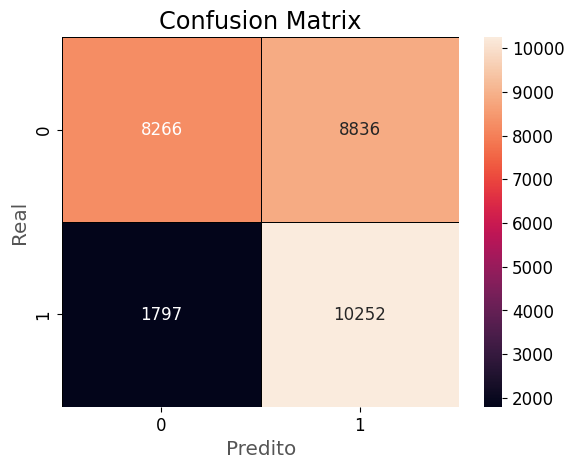

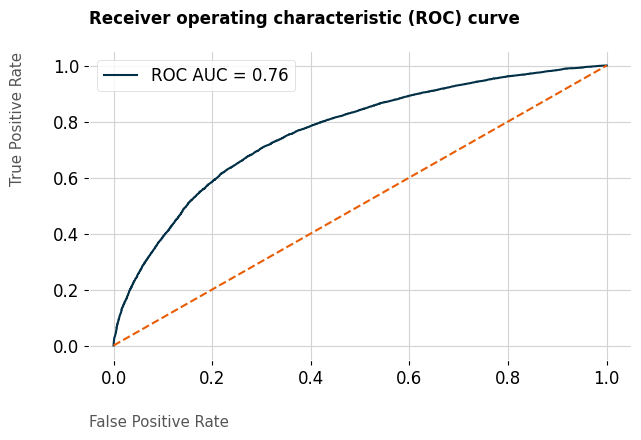

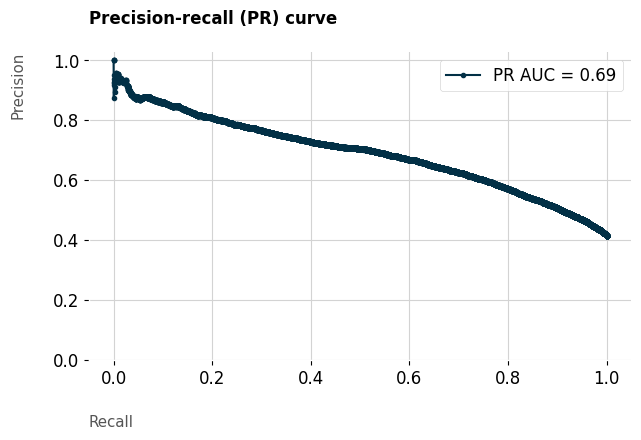

In [166]:
# Modelo LightGBM - com parametros
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_classifier(y_testEf, y_pred_test, evasao_probas_lgbmEf):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_testEf, y_pred_test))
        accuracy = accuracy_score(y_testEf, y_pred_test)
        precision = precision_score(y_testEf, y_pred_test) # average='weighted'
        recall = recall_score(y_testEf, y_pred_test)
        f1 = f1_score(y_testEf, y_pred_test)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_testEf, evasao_probas_lgbmEf)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_testEf, evasao_probas_lgbmEf)
        roc_auc = roc_auc_score(y_testEf, evasao_probas_lgbmEf)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_testEf.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_lgbmEf
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_testEf, y_pred_test)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_testEf, evasao_probas_lgbmEf)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_lgbm = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_lgbm_binario_original = model_metrics_lgbm.set_index('Metric').T
        
        return model_metrics_lgbm_binario_original


    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_lgbm_binario_original = evaluate_classifier(y_testEf, y_pred_test, evasao_probas_lgbmEf)


In [167]:
model_metrics_lgbm_binario_original

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.635244,0.537091,0.850859,0.658509,0.763531,0.405531,0.527063,0.690314,0.230862


              precision    recall  f1-score   support

           0       0.82      0.48      0.61     17102
           1       0.54      0.85      0.66     12049

    accuracy                           0.64     29151
   macro avg       0.68      0.67      0.63     29151
weighted avg       0.70      0.64      0.63     29151

Brier Score: 0.23
Gini: 0.53
KS: 0.41


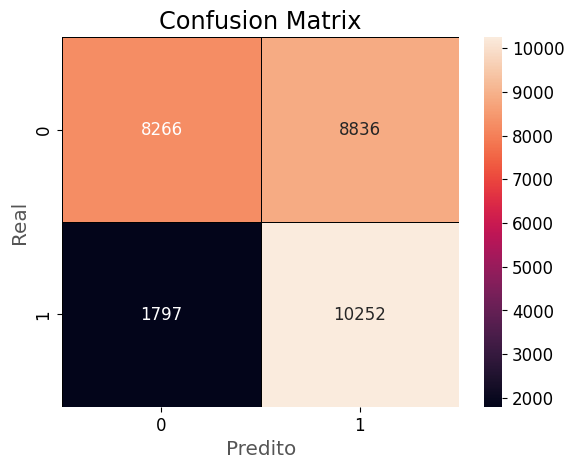

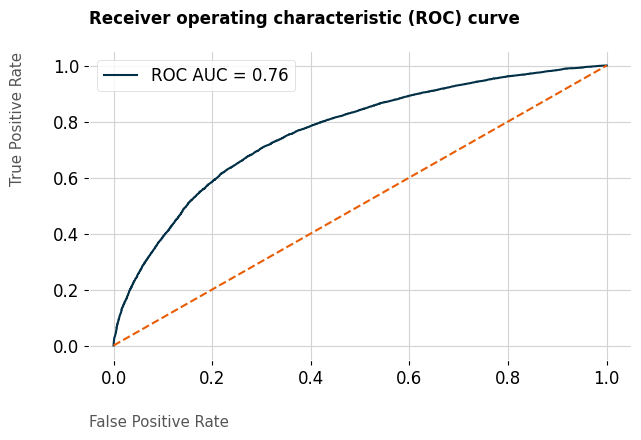

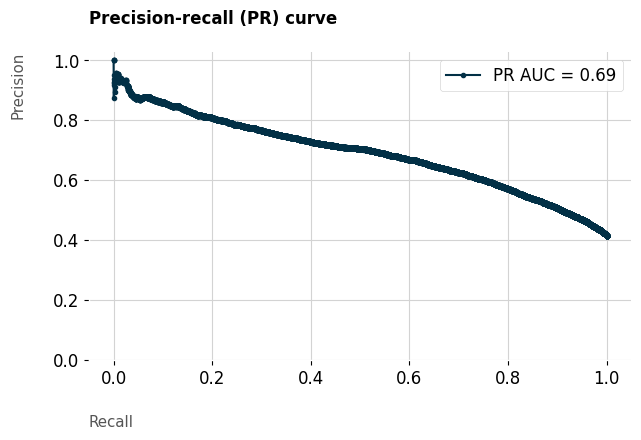

In [168]:
# Modelo LightGBM - CV e parametros na mão
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import sys



def evaluate_classifier(y_trainEf, y_pred_test, evasao_probas_lgbmEf):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_trainEf, y_pred_test))
        accuracy = accuracy_score(y_trainEf, y_pred_test)
        precision = precision_score(y_trainEf, y_pred_test) # average='weighted'
        recall = recall_score(y_trainEf, y_pred_test)
        f1 = f1_score(y_trainEf, y_pred_test)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_trainEf, evasao_probas_lgbmEf)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_trainEf, evasao_probas_lgbmEf)
        roc_auc = roc_auc_score(y_trainEf, evasao_probas_lgbmEf)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_trainEf.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_lgbmEf
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_trainEf, y_pred_test)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_trainEf, evasao_probas_lgbmEf)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_lgbmEf = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_lgbmEf = model_metrics_lgbmEf.set_index('Metric').T
        
        return model_metrics_lgbmEf

    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_lgbmEf = evaluate_classifier(y_testEf, y_pred_test, evasao_probas_lgbmEf)


In [169]:
model_metrics_lgbmEf

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.635244,0.537091,0.850859,0.658509,0.763531,0.405531,0.527063,0.690314,0.230862


## 6.2 CatBoost - Binário

              precision    recall  f1-score   support

           0       0.73      0.81      0.77     17102
           1       0.68      0.59      0.63     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.70      0.70     29151
weighted avg       0.71      0.72      0.71     29151

Brier Score: 0.19
Gini: 0.54
KS: 0.42


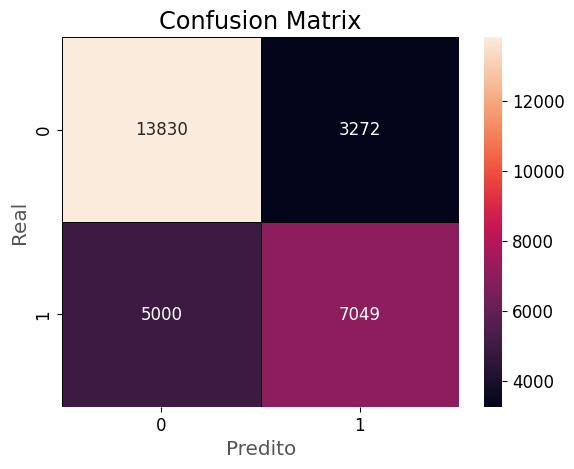

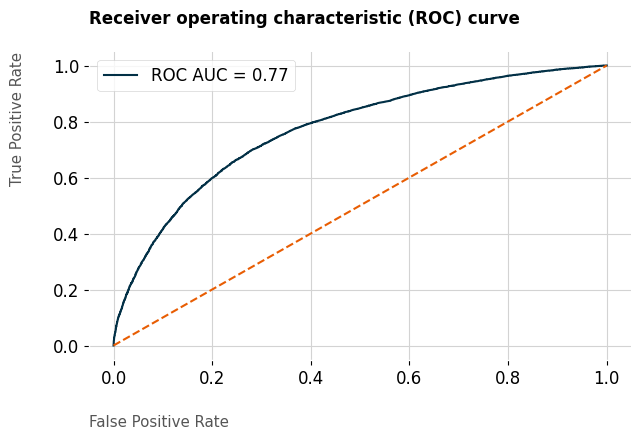

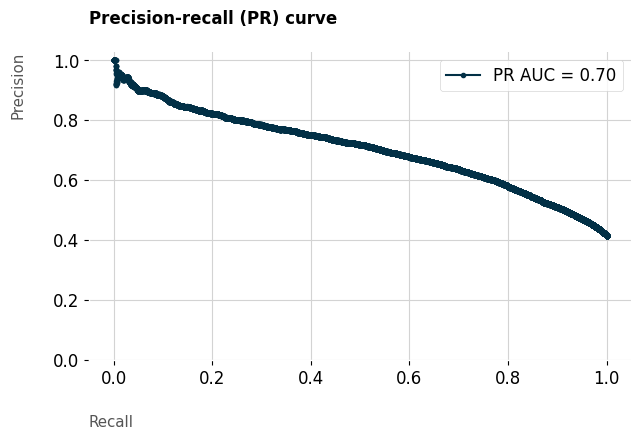

In [170]:
# Modelo CatBoost - CV e sem parametros
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_classifier(y_testEf, y_pred_cat_binario_sem_parametro, evasao_probas_catboost_binario_sem_paramentro):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_testEf, y_pred_cat_binario_sem_parametro))
        accuracy = accuracy_score(y_testEf, y_pred_cat_binario_sem_parametro)
        precision = precision_score(y_testEf, y_pred_cat_binario_sem_parametro, average='weighted') # average='weighted'
        recall = recall_score(y_testEf, y_pred_cat_binario_sem_parametro)
        f1 = f1_score(y_testEf, y_pred_cat_binario_sem_parametro)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_testEf, evasao_probas_catboost_binario_sem_paramentro)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_testEf, evasao_probas_catboost_binario_sem_paramentro)
        roc_auc = roc_auc_score(y_testEf, evasao_probas_catboost_binario_sem_paramentro)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_testEf.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_catboost_binario_sem_paramentro
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_testEf, y_pred_cat_binario_sem_parametro)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_testEf, evasao_probas_catboost_binario_sem_paramentro)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_catboost_binario_sem_param = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_catboost_binario_sem_param = model_metrics_catboost_binario_sem_param.set_index('Metric').T
        
        return model_metrics_catboost_binario_sem_param


    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_catboost_binario_sem_parametro = evaluate_classifier(y_testEf, y_pred_cat_binario_sem_parametro, evasao_probas_catboost_binario_sem_paramentro)

In [171]:
model_metrics_catboost_binario_sem_parametro

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.716236,0.713184,0.585028,0.630219,0.771512,0.41801,0.543025,0.703588,0.189311


In [172]:
print(y_trainEf.shape)
print(y_pred_model_catboost_cv_binario_param.shape)

(116600,)
(29151,)


              precision    recall  f1-score   support

           0       0.77      0.73      0.75     17102
           1       0.64      0.69      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.70      0.71      0.71     29151
weighted avg       0.72      0.71      0.71     29151

Brier Score: 0.19
Gini: 0.54
KS: 0.42


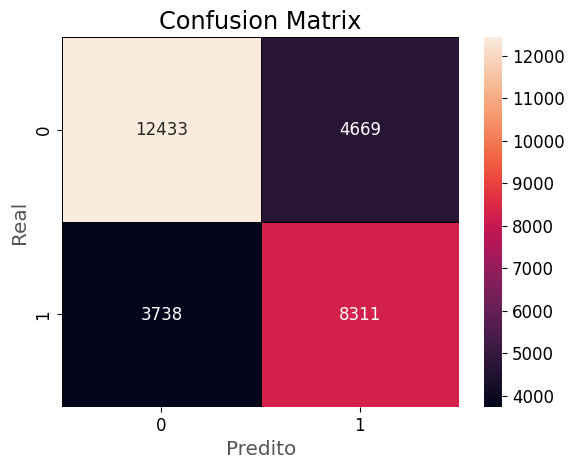

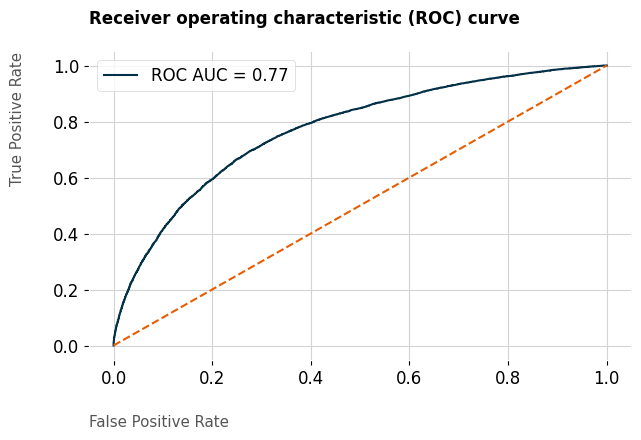

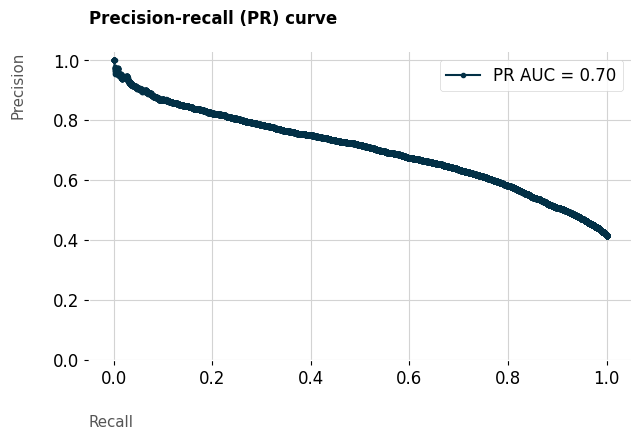

In [173]:
# Modelo CatBoost cv e com parametro
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_classifier(y_testEf, y_pred_model_catboost_cv_binario_param, evasao_probas_catboost_binario_cv_com_param):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_testEf, y_pred_model_catboost_cv_binario_param))
        accuracy = accuracy_score(y_testEf, y_pred_model_catboost_cv_binario_param)
        precision = precision_score(y_testEf, y_pred_model_catboost_cv_binario_param, average='weighted') # average='weighted'
        recall = recall_score(y_testEf, y_pred_model_catboost_cv_binario_param)
        f1 = f1_score(y_testEf, y_pred_model_catboost_cv_binario_param)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_testEf, evasao_probas_catboost_binario_cv_com_param)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_testEf, evasao_probas_catboost_binario_cv_com_param)
        roc_auc = roc_auc_score(y_testEf, evasao_probas_catboost_binario_cv_com_param)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_testEf.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_catboost_binario_cv_com_param
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_testEf, y_pred_model_catboost_cv_binario_param)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_testEf, evasao_probas_catboost_binario_cv_com_param)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_catboost_binario_cv_param = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_catboost_binario_cv_param = model_metrics_catboost_binario_cv_param.set_index('Metric').T
        
        return model_metrics_catboost_binario_cv_param


    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_catboost_binario_cv_param = evaluate_classifier(y_testEf, y_pred_model_catboost_cv_binario_param, evasao_probas_catboost_binario_cv_com_param)

In [174]:
model_metrics_catboost_binario_cv_param

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.711605,0.715711,0.689767,0.66411,0.771495,0.417759,0.54299,0.703229,0.193979


## 6.3 CatBoost - Categórico (Modelo campeão)

              precision    recall  f1-score   support

           0       0.77      0.74      0.75     17102
           1       0.65      0.69      0.67     12049

    accuracy                           0.72     29151
   macro avg       0.71      0.71      0.71     29151
weighted avg       0.72      0.72      0.72     29151

Brier Score: 0.19
Gini: 0.56
KS: 0.43


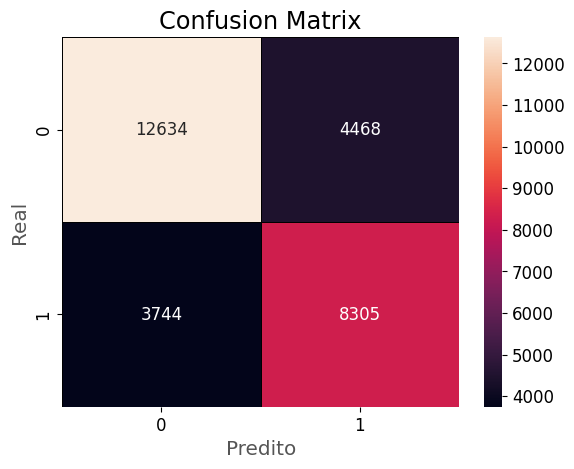

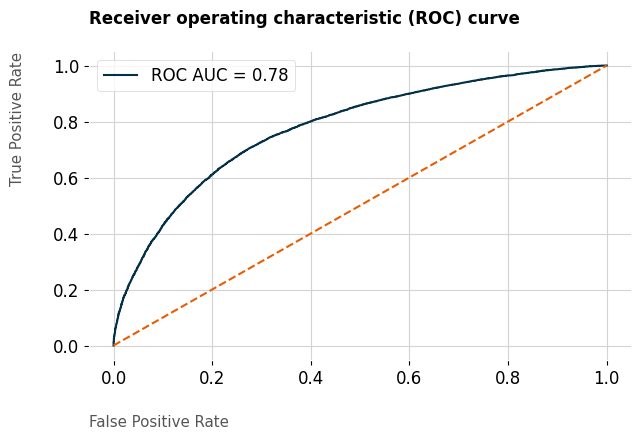

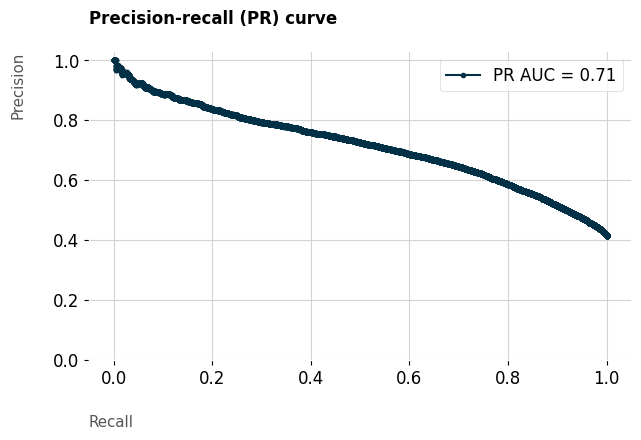

In [175]:
# Modelo CatBoost - cv com parametros
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_classifier(y_cat_test, y_pred_model_catboost_cv_categorico_param, evasao_probas_catboost_categorico_cv_com_param):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_cat_test, y_pred_model_catboost_cv_categorico_param))
        accuracy = accuracy_score(y_cat_test, y_pred_model_catboost_cv_categorico_param)
        precision = precision_score(y_cat_test, y_pred_model_catboost_cv_categorico_param, average='weighted') # average='weighted'
        recall = recall_score(y_cat_test, y_pred_model_catboost_cv_categorico_param)
        f1 = f1_score(y_cat_test, y_pred_model_catboost_cv_categorico_param)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)
        roc_auc = roc_auc_score(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_cat_test.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_catboost_categorico_cv_com_param
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_cat_test, y_pred_model_catboost_cv_categorico_param)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_catboost_categorico_com_param = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_catboost_categorico_com_param = model_metrics_catboost_categorico_com_param.set_index('Metric').T
        
        return model_metrics_catboost_categorico_com_param


    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_catboost_categorico_com_param = evaluate_classifier(y_cat_test, y_pred_model_catboost_cv_categorico_param, evasao_probas_catboost_categorico_cv_com_param)

In [176]:
model_metrics_catboost_categorico_com_param

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.718294,0.721305,0.689269,0.669164,0.778462,0.42932,0.556924,0.713878,0.190825


              precision    recall  f1-score   support

           0       0.77      0.73      0.75     17102
           1       0.64      0.69      0.66     12049

    accuracy                           0.71     29151
   macro avg       0.71      0.71      0.71     29151
weighted avg       0.72      0.71      0.71     29151

Brier Score: 0.19
Gini: 0.55
KS: 0.42


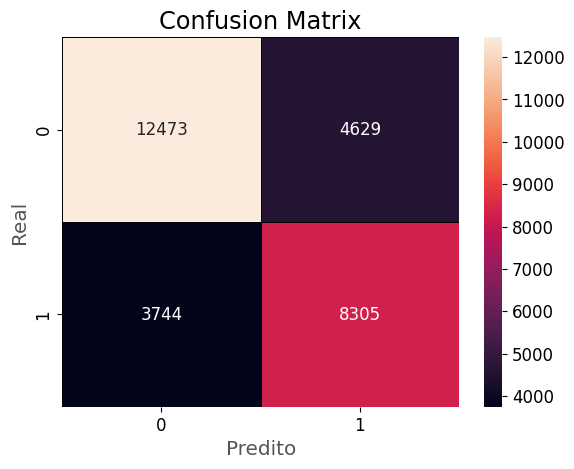

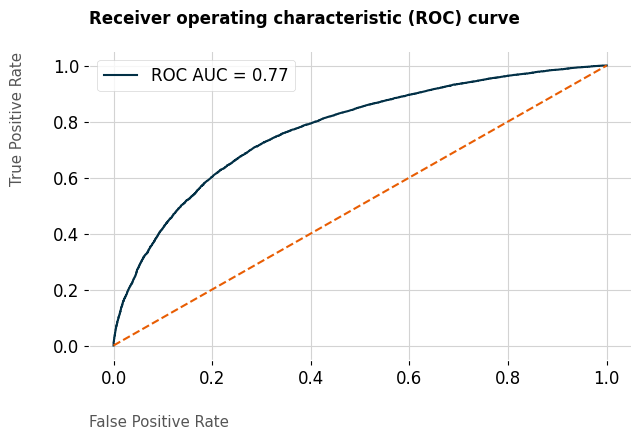

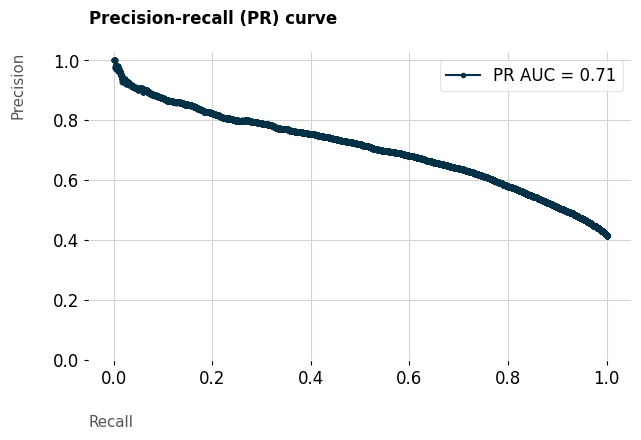

In [177]:
# Modelo CatBoost - cv com parametros
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, auc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def evaluate_classifier(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao, evasao_probas_catboost_categorico_clf):
    '''
    Evaluate the performance of a binary classifier and visualize the results.

    This function calculates and displays various evaluation metrics for a binary classifier,
    including the classification report, confusion matrix, ROC curve and AUC, PR curve and AUC,
    brier score, gini and ks.
    '''
    try:
        # Print classification report and calculate its metrics to include in the final metrics df.
        print(classification_report(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao))
        accuracy = accuracy_score(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao)
        precision = precision_score(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao, average='weighted') # average='weighted'
        recall = recall_score(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao)
        f1 = f1_score(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao)

        # Calculate and print brier score, gini and ks.
        brier_score = brier_score_loss(y_cat_test, evasao_probas_catboost_categorico_clf)
        print(f'Brier Score: {round(brier_score, 2)}')
        
        fpr, tpr, thresholds = roc_curve(y_cat_test, evasao_probas_catboost_categorico_clf)
        roc_auc = roc_auc_score(y_cat_test, evasao_probas_catboost_categorico_clf)
        gini = 2 * roc_auc - 1
        print(f'Gini: {round(gini, 2)}')
        
        scores = pd.DataFrame()
        scores['actual'] = y_cat_test.reset_index(drop=True)
        scores['evasão_probability'] = evasao_probas_catboost_categorico_clf
        sorted_scores = scores.sort_values(by=['evasão_probability'], ascending=False)
        sorted_scores['cum_negative'] = (1 - sorted_scores['actual']).cumsum() / (1 - sorted_scores['actual']).sum()
        sorted_scores['cum_positive'] = sorted_scores['actual'].cumsum() / sorted_scores['actual'].sum()
        sorted_scores['ks'] = np.abs(sorted_scores['cum_positive'] - sorted_scores['cum_negative'])
        ks = sorted_scores['ks'].max()
        
        print(f'KS: {round(ks, 2)}')
        
        # Confusion matrix.
        cm = confusion_matrix(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao)
        sns.heatmap(cm, annot=True, fmt = 'd', linecolor='black', linewidths=0.5 )
        plt.title('Confusion Matrix')
        plt.xlabel('Predito')
        plt.ylabel('Real')
        plt.show()
        
        # Plot ROC Curve and ROC-AUC.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.2f}', color='#023046')
        ax.plot([0, 1], [0, 1], linestyle='--', color='#e85d03')  # Random guessing line.
        ax.set_xlabel('False Positive Rate', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('True Positive Rate', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Receiver operating characteristic (ROC) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()
    
        # PR AUC Curve and score.
        p, r, _ = precision_recall_curve(y_cat_test, evasao_probas_catboost_categorico_clf)
        pr_auc = auc(r, p)
        
        # Plot the model precision-recall curve.
        fig, ax = plt.subplots(figsize=(7, 4))
        ax.plot(r, p, marker='.', label=f'PR AUC = {pr_auc:.2f}', color='#023046')
        ax.set_xlabel('Recall', fontsize=10.8, labelpad=20, loc='left')
        ax.set_ylabel('Precision', fontsize=10.8, labelpad=20, loc='top')
        ax.set_xticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_yticks(ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0.0', '0.2', '0.4', '0.6', '0.8', '1.0'])
        ax.set_title('Precision-recall (PR) curve', fontweight='bold', fontsize=12, pad=20, loc='left')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend()

        # Construct a DataFrame with metrics for passed sets.
        model_metrics_catboost_categorico_clf = pd.DataFrame({
                                    'Metric': ['Accuracy',
                                               'Precision',
                                               'Recall',
                                               'F1-Score',
                                               'ROC-AUC',
                                               'KS',
                                               'Gini',
                                               'PR-AUC',
                                               'Brier'],
                                    'Value': [accuracy, 
                                              precision, 
                                              recall,
                                              f1,
                                              roc_auc,
                                              ks,
                                              gini, 
                                              pr_auc,
                                              brier_score,
                                              ],
                                    })
        
        # Transpondo o DataFrame para exibição horizontal
        model_metrics_catboost_categorico_clf = model_metrics_catboost_categorico_clf.set_index('Metric').T
        
        return model_metrics_catboost_categorico_clf


    except Exception as e:
        raise CustomException(e, sys)

# Exemplo de chamada:
model_metrics_catboost_categorico_clf = evaluate_classifier(y_cat_test, y_pred_model_catboost_cv_categorico_param_mao, evasao_probas_catboost_categorico_clf)

In [178]:
model_metrics_catboost_categorico_clf

Metric,Accuracy,Precision,Recall,F1-Score,ROC-AUC,KS,Gini,PR-AUC,Brier
Value,0.712771,0.716628,0.689269,0.664852,0.773224,0.422319,0.546448,0.705376,0.1935


### Brier Score
- Mede a calibração das probabilidades preditas pelo modelo.
- Vai de 0 a 1, onde valores menores indicam melhor calibração.
- Um Brier Score baixo significa que as previsões probabilísticas do modelo são confiáveis.

### Gini Coefficient
- Mede a capacidade discriminativa do modelo.
- É derivado da métrica ROC-AUC.
- Varia de -1 a 1, onde:
 1 indica um modelo perfeito.
 0 indica um modelo aleatório.
- Valores negativos indicam um modelo pior que o aleatório.

### KS (Kolmogorov-Smirnov)
- Mede a separação entre as distribuições de positivos e negativos.
- Baseia-se na diferença máxima entre as curvas de distribuição acumulada dos dois grupos.
- Valores maiores indicam melhor separação entre classes.

# ----------------------------------------------------------------------------------------------

Os resultados do modelo são excelentes!

<b>Recall (0,70):</b> O modelo identifica corretamente 70% dos alunos que evadiram. Em termos práticos, analisando a matriz de confusão, ele previu corretamente 12010 dos 41.341 alunos que abandonram o curso técnico.

<b>Precisão (0,30):</b> Entre todos os alunos previstos como evadidos, 30% realmente evadiram. Em termos práticos, considerando a matriz de confusão, dos 324 alunos previstos como evadidos, 290 de fato evadiram.

<b>ROC-AUC (0,75):</b> Com uma pontuação ROC-AUC de 0,75, o modelo demonstra uma capacidade boa de diferenciar alunos que evadiram dos que não evadiram. Na prática, ao selecionar aleatoriamente um aluno que evadiu e outro que não evadiu, há uma probabilidade de 75% de o modelo atribuir uma maior probabilidade de evasão ao aluno que realmente evadiu.

- Esse desempenho  não se deve a vazamento de dados, uma vez que todas as variáveis incluídas estão disponíveis no momento da previsão e a divisão dos dados foi realizada antes de qualquer processamento adicional. O  desempenho é resultado da qualidade dos dados, pois as variáveis independentes distinguem relativamente bem os alunos que evadiram dos que não evadiram.

- Por fim, como as pontuações de treino, teste e validação são semelhantes, a capacidade de generalização do modelo é confiável.

## 6.2 Analise da distribuição das probabilidades previstas por evasão.

### 6.2.1 LightGBM

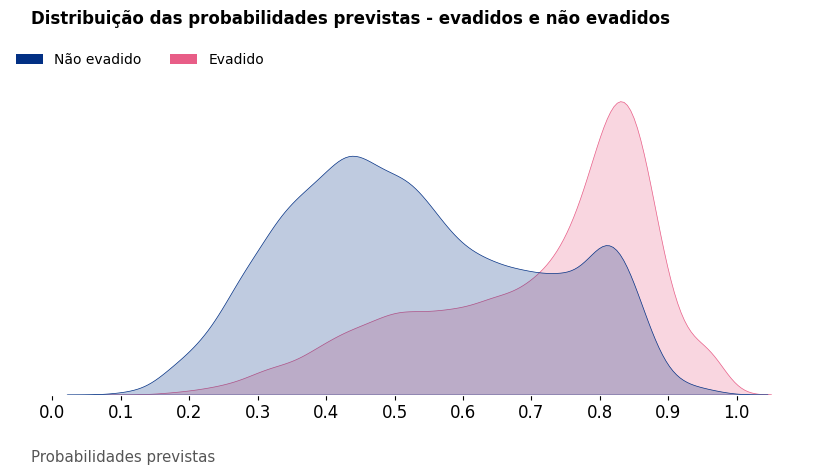

In [179]:
# Modelo com LightGBM - Binário com parametros
def plot_probability_distributions(y_testEf, evasao_probas_lgbmEf):
    '''
    Plots the kernel density estimate (KDE) of predicted probabilities for churners and non-churners.

    Parameters:
    - y_true (array-like): The true class labels (1 for churner, 0 for non-churner).
    - probas (array-like): Predicted probabilities for the positive class (churners).

    Raises:
    - CustomException: Raised if an unexpected error occurs during plotting.

    Example:
    ```python
    plot_probability_distributions(y_true, probas)
    ```

    Dependencies:
    - pandas
    - seaborn
    - matplotlib

    Note:
    The function creates a KDE plot illustrating the distribution of predicted probabilities for churners and non-churners.
    It provides visual insights into the model's ability to distinguish between the two classes.

    '''
    try:
        probas_df = pd.DataFrame({'evasao_probability': evasao_probas_lgbmEf,
                                'evasao': y_testEf})

        fig, ax = plt.subplots(figsize=(10, 4))
        sns.kdeplot(data=probas_df, x='evasao_probability', hue='evasao', fill=True, ax=ax, palette=['#023084', '#e85d87'])
        ax.set_title('Distribuição das probabilidades previstas - evadidos e não evadidos', fontweight='bold', fontsize=12, pad=45, loc='left')
        ax.set_xlabel('Probabilidades previstas', fontsize=10.8, labelpad=20, loc='left')
        ax.set_xticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                    ['0.0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0'],
                    )
        ax.yaxis.set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)

        
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#023084', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#e85d87', edgecolor = 'none')] ##e85d87
        labels = ['Não evadido', 'Evadido']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.14, 1.15), frameon=False, ncol=2, fontsize=10)

        
    except Exception as e:
        raise CustomException(e, sys)


plot_probability_distributions(y_testEf, evasao_probas_lgbmEf)

### 6.2.2 CatBoost binário

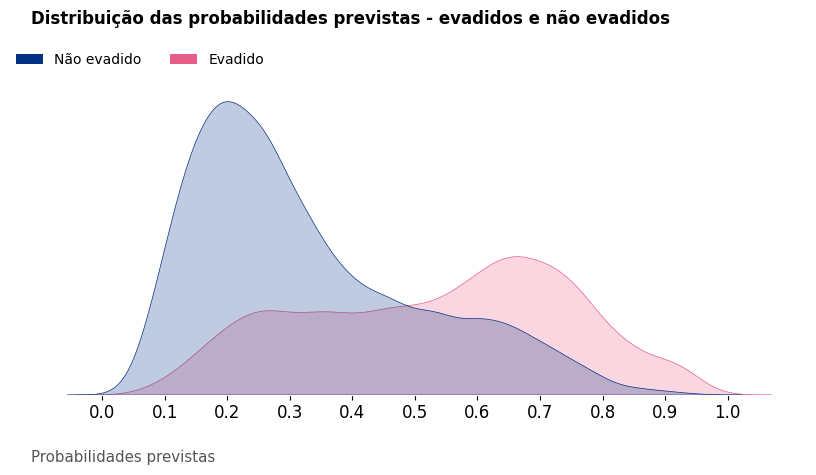

In [180]:
# Modelo com CatBoost - Binário - cv e sem parametro
def plot_probability_distributions(y_testEf, evasao_probas_catboost_binario_sem_paramentro):
    '''
    Plots the kernel density estimate (KDE) of predicted probabilities for churners and non-churners.

    Parameters:
    - y_true (array-like): The true class labels (1 for churner, 0 for non-churner).
    - probas (array-like): Predicted probabilities for the positive class (churners).

    Raises:
    - CustomException: Raised if an unexpected error occurs during plotting.

    Example:
    ```python
    plot_probability_distributions(y_true, probas)
    ```

    Dependencies:
    - pandas
    - seaborn
    - matplotlib

    Note:
    The function creates a KDE plot illustrating the distribution of predicted probabilities for churners and non-churners.
    It provides visual insights into the model's ability to distinguish between the two classes.

    '''
    try:
        probas_df = pd.DataFrame({'evasao_probability': evasao_probas_catboost_binario_sem_paramentro,
                                'evasao': y_testEf})

        fig, ax = plt.subplots(figsize=(10, 4))
        sns.kdeplot(data=probas_df, x='evasao_probability', hue='evasao', fill=True, ax=ax, palette=['#023084', '#e85d87'])
        ax.set_title('Distribuição das probabilidades previstas - evadidos e não evadidos', fontweight='bold', fontsize=12, pad=45, loc='left')
        ax.set_xlabel('Probabilidades previstas', fontsize=10.8, labelpad=20, loc='left')
        ax.set_xticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                    ['0.0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0'],
                    )
        ax.yaxis.set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)

        
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#023084', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#e85d87', edgecolor = 'none')] ##e85d87
        labels = ['Não evadido', 'Evadido']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.14, 1.15), frameon=False, ncol=2, fontsize=10)

        
    except Exception as e:
        raise CustomException(e, sys)


plot_probability_distributions(y_testEf, evasao_probas_catboost_binario_sem_paramentro)

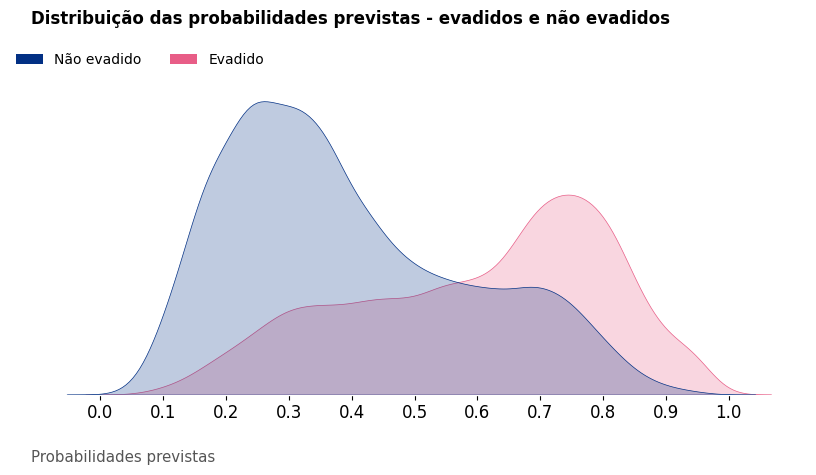

In [181]:
# Modelo com CatBoost - Binário - cv e sem parametro
def plot_probability_distributions(y_testEf, evasao_probas_catboost_binario_cv_com_param):
    '''
    Plots the kernel density estimate (KDE) of predicted probabilities for churners and non-churners.

    Parameters:
    - y_true (array-like): The true class labels (1 for churner, 0 for non-churner).
    - probas (array-like): Predicted probabilities for the positive class (churners).

    Raises:
    - CustomException: Raised if an unexpected error occurs during plotting.

    Example:
    ```python
    plot_probability_distributions(y_true, probas)
    ```

    Dependencies:
    - pandas
    - seaborn
    - matplotlib

    Note:
    The function creates a KDE plot illustrating the distribution of predicted probabilities for churners and non-churners.
    It provides visual insights into the model's ability to distinguish between the two classes.

    '''
    try:
        probas_df = pd.DataFrame({'evasao_probability': evasao_probas_catboost_binario_cv_com_param,
                                'evasao': y_testEf})

        fig, ax = plt.subplots(figsize=(10, 4))
        sns.kdeplot(data=probas_df, x='evasao_probability', hue='evasao', fill=True, ax=ax, palette=['#023084', '#e85d87'])
        ax.set_title('Distribuição das probabilidades previstas - evadidos e não evadidos', fontweight='bold', fontsize=12, pad=45, loc='left')
        ax.set_xlabel('Probabilidades previstas', fontsize=10.8, labelpad=20, loc='left')
        ax.set_xticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                    ['0.0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0'],
                    )
        ax.yaxis.set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)

        
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#023084', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#e85d87', edgecolor = 'none')] ##e85d87
        labels = ['Não evadido', 'Evadido']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.14, 1.15), frameon=False, ncol=2, fontsize=10)

        
    except Exception as e:
        raise CustomException(e, sys)


plot_probability_distributions(y_testEf, evasao_probas_catboost_binario_cv_com_param)

É possível observar uma leve separação entre as distribuições das probabilidades previstas para alunos que evadiram e os que não evadiram. 

### 6.2.3 CatBoost categórico

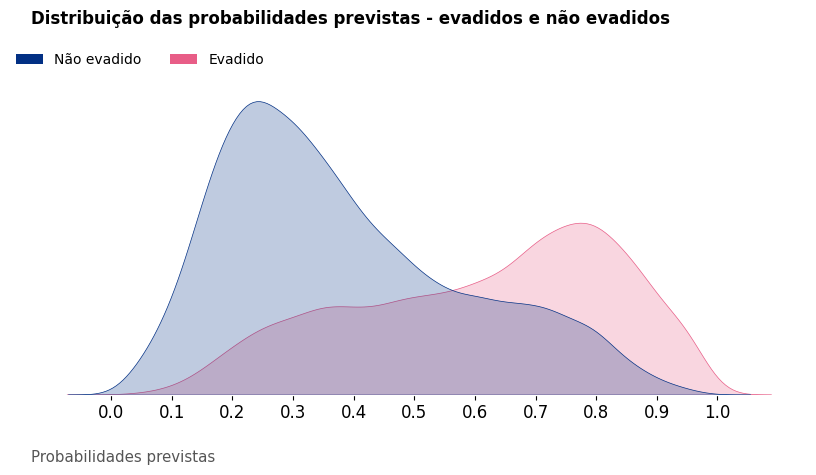

In [182]:
# Modelo com CatBoost - Categórico - cv e com parametro
def plot_probability_distributions(y_cat_test, evasao_probas_catboost_categorico_cv_com_param):
    '''
    Plots the kernel density estimate (KDE) of predicted probabilities for churners and non-churners.

    Parameters:
    - y_true (array-like): The true class labels (1 for churner, 0 for non-churner).
    - probas (array-like): Predicted probabilities for the positive class (churners).

    Raises:
    - CustomException: Raised if an unexpected error occurs during plotting.

    Example:
    ```python
    plot_probability_distributions(y_true, probas)
    ```

    Dependencies:
    - pandas
    - seaborn
    - matplotlib

    Note:
    The function creates a KDE plot illustrating the distribution of predicted probabilities for churners and non-churners.
    It provides visual insights into the model's ability to distinguish between the two classes.

    '''
    try:
        probas_df = pd.DataFrame({'evasao_probability': evasao_probas_catboost_categorico_cv_com_param,
                                'evasao': y_cat_test})

        fig, ax = plt.subplots(figsize=(10, 4))
        sns.kdeplot(data=probas_df, x='evasao_probability', hue='evasao', fill=True, ax=ax, palette=['#023084', '#e85d87'])
        ax.set_title('Distribuição das probabilidades previstas - evadidos e não evadidos', fontweight='bold', fontsize=12, pad=45, loc='left')
        ax.set_xlabel('Probabilidades previstas', fontsize=10.8, labelpad=20, loc='left')
        ax.set_xticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                    ['0.0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1.0'],
                    )
        ax.yaxis.set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(False)

        
        handles = [plt.Rectangle((0,0), 0.1, 0.1, fc='#023084', edgecolor = 'none'),
                plt.Rectangle((0,0), 0.1, 0.1, fc='#e85d87', edgecolor = 'none')] ##e85d87
        labels = ['Não evadido', 'Evadido']
            
        ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.14, 1.15), frameon=False, ncol=2, fontsize=10)

        
    except Exception as e:
        raise CustomException(e, sys)


plot_probability_distributions(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)

É possível observar uma leve separação entre as distribuições das probabilidades previstas para alunos que evadiram e os que não evadiram. 

### 6.3.1 LightGBM binário - Scores de Probabilidade

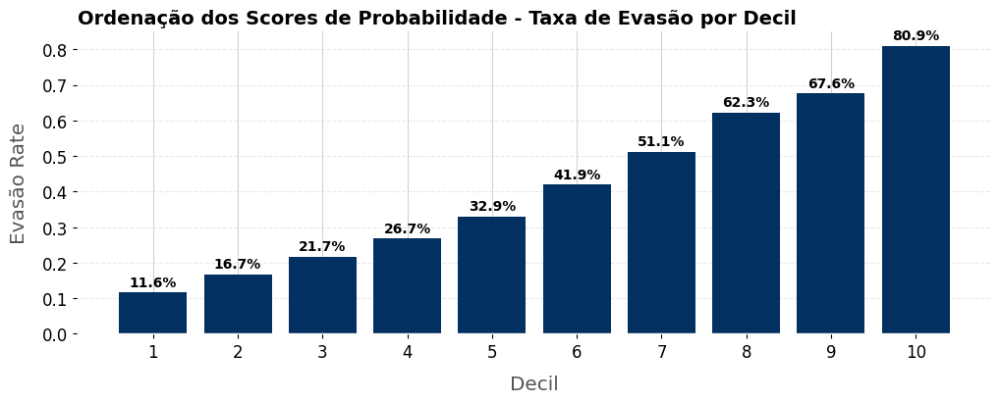

In [183]:
# Modelo LightGBM  - cv e sem parametro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def probability_scores_ordering(y_testEf, evasao_probas_lgbmEf):
    """
    Order and visualize the probability scores in deciles based on predicted probabilities and true labels.

    Parameters:
    - y_true (pd.Series): Actual target values for the set. 1 is churner and 0 is non-churner.
    - probas (pd.Series): Predicted probabilities of churning for the passed set.

    Returns:
    - None: Plots the probability scores ordering.
    """
    try:
        # Add slight noise to avoid duplicate bin limits
        evasao_probas_lgbmEf += np.random.uniform(0, 0.0001, size=evasao_probas_lgbmEf.shape)

        # Create DataFrame with actual values and probabilities
        probas_actual_df = pd.DataFrame({'probabilities': evasao_probas_lgbmEf, 'actual': y_testEf.reset_index(drop=True)})

        # Sort by probabilities
        probas_actual_df = probas_actual_df.sort_values(by='probabilities', ascending=True)

        # Assign deciles
        probas_actual_df['deciles'] = pd.qcut(probas_actual_df['probabilities'], q=10, labels=False, duplicates='drop')

        # Calculate the churn rate per decile
        decile_df = probas_actual_df.groupby('deciles')['actual'].mean().reset_index()
        decile_df.rename(columns={'actual': 'evasao_rate'}, inplace=True)

        # Plot settings
        fig, ax = plt.subplots(figsize=(12, 4))
        bars = ax.bar(decile_df['deciles'], decile_df['evasao_rate'], color='#023061')

        ax.set_title('Ordenação dos Scores de Probabilidade - Taxa de Evasão por Decil', loc='left', fontweight='bold', fontsize=14)
        ax.set_xticks(range(10))
        ax.set_xticklabels([str(i + 1) for i in range(10)])  # Deciles from 1 to 10
        ax.set_xlabel('Decil', labelpad=10)
        ax.set_ylabel('Evasão Rate', labelpad=10)
        ax.spines[['top', 'right']].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Annotate bars with percentages
        for bar, rate in zip(bars, decile_df['evasao_rate']):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{rate * 100:.1f}%', 
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

        plt.show()

    except Exception as e:
        raise CustomException(e, sys)

# Executar função
probability_scores_ordering(y_testEf, evasao_probas_lgbmEf)


A ordenação dos scores de probabilidade também está boa. Grande parte  dos alunos que evadiram estão entre o 7º e 10º deciles.

### 6.3.2 CatBoost binário - Scores de Probabilidade

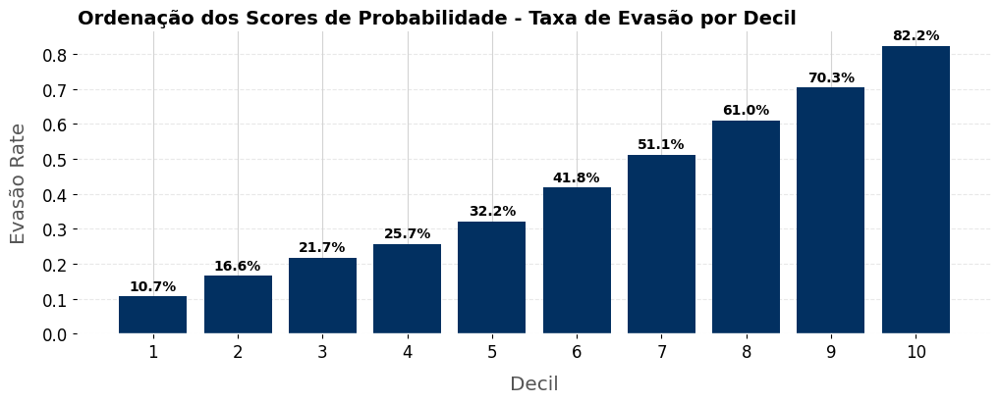

In [184]:
# Modelo CatBoost Binario - cv e sem parametro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def probability_scores_ordering(y_testEf, evasao_probas_catboost_binario_sem_paramentro):
    """
    Order and visualize the probability scores in deciles based on predicted probabilities and true labels.

    Parameters:
    - y_true (pd.Series): Actual target values for the set. 1 is churner and 0 is non-churner.
    - probas (pd.Series): Predicted probabilities of churning for the passed set.

    Returns:
    - None: Plots the probability scores ordering.
    """
    try:
        # Add slight noise to avoid duplicate bin limits
        evasao_probas_catboost_binario_sem_paramentro += np.random.uniform(0, 0.0001, size=evasao_probas_catboost_binario_sem_paramentro.shape)

        # Create DataFrame with actual values and probabilities
        probas_actual_df = pd.DataFrame({'probabilities': evasao_probas_catboost_binario_sem_paramentro, 'actual': y_testEf.reset_index(drop=True)})

        # Sort by probabilities
        probas_actual_df = probas_actual_df.sort_values(by='probabilities', ascending=True)

        # Assign deciles
        probas_actual_df['deciles'] = pd.qcut(probas_actual_df['probabilities'], q=10, labels=False, duplicates='drop')

        # Calculate the churn rate per decile
        decile_df = probas_actual_df.groupby('deciles')['actual'].mean().reset_index()
        decile_df.rename(columns={'actual': 'evasao_rate'}, inplace=True)

        # Plot settings
        fig, ax = plt.subplots(figsize=(12, 4))
        bars = ax.bar(decile_df['deciles'], decile_df['evasao_rate'], color='#023061')

        ax.set_title('Ordenação dos Scores de Probabilidade - Taxa de Evasão por Decil', loc='left', fontweight='bold', fontsize=14)
        ax.set_xticks(range(10))
        ax.set_xticklabels([str(i + 1) for i in range(10)])  # Deciles from 1 to 10
        ax.set_xlabel('Decil', labelpad=10)
        ax.set_ylabel('Evasão Rate', labelpad=10)
        ax.spines[['top', 'right']].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Annotate bars with percentages
        for bar, rate in zip(bars, decile_df['evasao_rate']):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{rate * 100:.1f}%', 
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

        plt.show()

    except Exception as e:
        raise CustomException(e, sys)

# Executar função
probability_scores_ordering(y_testEf, evasao_probas_catboost_binario_sem_paramentro)


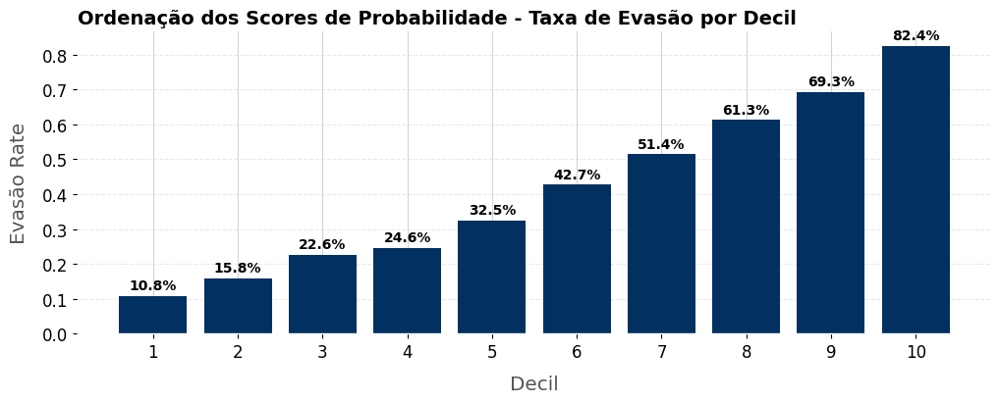

In [185]:
# Modelo CatBoost Binario - cv e sem parametro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def probability_scores_ordering(y_testEf, evasao_probas_catboost_binario_cv_com_param):
    """
    Order and visualize the probability scores in deciles based on predicted probabilities and true labels.

    Parameters:
    - y_true (pd.Series): Actual target values for the set. 1 is churner and 0 is non-churner.
    - probas (pd.Series): Predicted probabilities of churning for the passed set.

    Returns:
    - None: Plots the probability scores ordering.
    """
    try:
        # Add slight noise to avoid duplicate bin limits
        evasao_probas_catboost_binario_cv_com_param += np.random.uniform(0, 0.0001, size=evasao_probas_catboost_binario_cv_com_param.shape)

        # Create DataFrame with actual values and probabilities
        probas_actual_df = pd.DataFrame({'probabilities': evasao_probas_catboost_binario_cv_com_param, 'actual': y_testEf.reset_index(drop=True)})

        # Sort by probabilities
        probas_actual_df = probas_actual_df.sort_values(by='probabilities', ascending=True)

        # Assign deciles
        probas_actual_df['deciles'] = pd.qcut(probas_actual_df['probabilities'], q=10, labels=False, duplicates='drop')

        # Calculate the churn rate per decile
        decile_df = probas_actual_df.groupby('deciles')['actual'].mean().reset_index()
        decile_df.rename(columns={'actual': 'evasao_rate'}, inplace=True)

        # Plot settings
        fig, ax = plt.subplots(figsize=(12, 4))
        bars = ax.bar(decile_df['deciles'], decile_df['evasao_rate'], color='#023061')

        ax.set_title('Ordenação dos Scores de Probabilidade - Taxa de Evasão por Decil', loc='left', fontweight='bold', fontsize=14)
        ax.set_xticks(range(10))
        ax.set_xticklabels([str(i + 1) for i in range(10)])  # Deciles from 1 to 10
        ax.set_xlabel('Decil', labelpad=10)
        ax.set_ylabel('Evasão Rate', labelpad=10)
        ax.spines[['top', 'right']].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Annotate bars with percentages
        for bar, rate in zip(bars, decile_df['evasao_rate']):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{rate * 100:.1f}%', 
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

        plt.show()

    except Exception as e:
        raise CustomException(e, sys)

# Executar função
probability_scores_ordering(y_testEf, evasao_probas_catboost_binario_cv_com_param)


A ordenação dos scores de probabilidade também está boa. Grande parte  dos alunos que evadiram estão entre o 7º e 10º deciles.

### 6.3.3 CatBoost categórico - Scores de Probabilidade

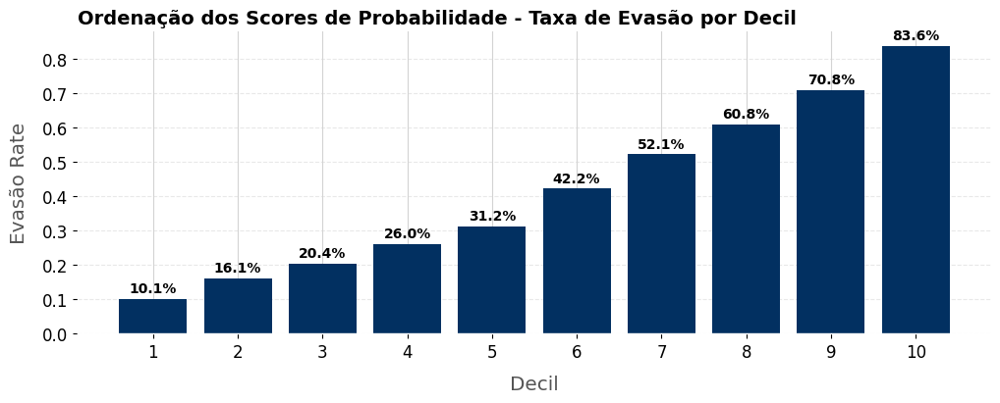

In [186]:
# Modelo CatBoost Binario - cv e com parametro
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def probability_scores_ordering(y_cat_test, evasao_probas_catboost_categorico_cv_com_param):
    """
    Order and visualize the probability scores in deciles based on predicted probabilities and true labels.

    Parameters:
    - y_true (pd.Series): Actual target values for the set. 1 is churner and 0 is non-churner.
    - probas (pd.Series): Predicted probabilities of churning for the passed set.

    Returns:
    - None: Plots the probability scores ordering.
    """
    try:
        # Add slight noise to avoid duplicate bin limits
        evasao_probas_catboost_categorico_cv_com_param += np.random.uniform(0, 0.0001, size=evasao_probas_catboost_categorico_cv_com_param.shape)

        # Create DataFrame with actual values and probabilities
        probas_actual_df = pd.DataFrame({'probabilities': evasao_probas_catboost_categorico_cv_com_param, 'actual': y_cat_test.reset_index(drop=True)})

        # Sort by probabilities
        probas_actual_df = probas_actual_df.sort_values(by='probabilities', ascending=True)

        # Assign deciles
        probas_actual_df['deciles'] = pd.qcut(probas_actual_df['probabilities'], q=10, labels=False, duplicates='drop')

        # Calculate the churn rate per decile
        decile_df = probas_actual_df.groupby('deciles')['actual'].mean().reset_index()
        decile_df.rename(columns={'actual': 'evasao_rate'}, inplace=True)

        # Plot settings
        fig, ax = plt.subplots(figsize=(12, 4))
        bars = ax.bar(decile_df['deciles'], decile_df['evasao_rate'], color='#023061')

        ax.set_title('Ordenação dos Scores de Probabilidade - Taxa de Evasão por Decil', loc='left', fontweight='bold', fontsize=14)
        ax.set_xticks(range(10))
        ax.set_xticklabels([str(i + 1) for i in range(10)])  # Deciles from 1 to 10
        ax.set_xlabel('Decil', labelpad=10)
        ax.set_ylabel('Evasão Rate', labelpad=10)
        ax.spines[['top', 'right']].set_visible(False)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Annotate bars with percentages
        for bar, rate in zip(bars, decile_df['evasao_rate']):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{rate * 100:.1f}%', 
                    ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

        plt.show()

    except Exception as e:
        raise CustomException(e, sys)

# Executar função
probability_scores_ordering(y_cat_test, evasao_probas_catboost_categorico_cv_com_param)


A ordenação dos scores de probabilidade também está boa. Grande parte  dos alunos que evadiram estão entre o 7º e 10º deciles.

# _______________________________________________________________________________________________________________________________________________________________________________________

# 6.3 Interpretação dos Resultados do Modelo com SHAP (Shapley Additive Explanations)

- Para interpretar os resultados do LightGBM, são analisados os valores SHAP.
- SHAP é uma biblioteca que permite a interpretação dos resultados de algoritmos de aprendizado de máquina.
- Com o SHAP, é possível entender o impacto de cada característica na previsão individual do modelo, seguindo a equação: f(x) = E(f(x)) + SHAP.
- Basicamente, o valor SHAP de uma característica (seu impacto em uma previsão individual) é determinado pela soma ponderada das contribuições marginais, considerando todas as possíveis coalizões de características.
- Uma coalizão de características é um grupo de características, cujo valor corresponde à previsão individual do modelo utilizando apenas essas características.
- A contribuição marginal de uma característica é definida como a diferença entre o valor previsto para uma coalizão de características com e sem essa característica.
- As contribuições marginais são somadas para todas as combinações possíveis, tanto com quanto sem a característica.
- Os pesos são determinados com base na probabilidade de a característica estar presente em uma determinada combinação ao calcular seu valor SHAP.



## 6.3.1 SHARP - CatBoost categórico

In [33]:
# Modelo CatBoost categórico  - Inicializando o explicador SHAP com o modelo final.
ex = shap.TreeExplainer(modelo_catboost_categorico_com_param)

# Compute shap values.
shap_values_cat = ex(X_cat_test)

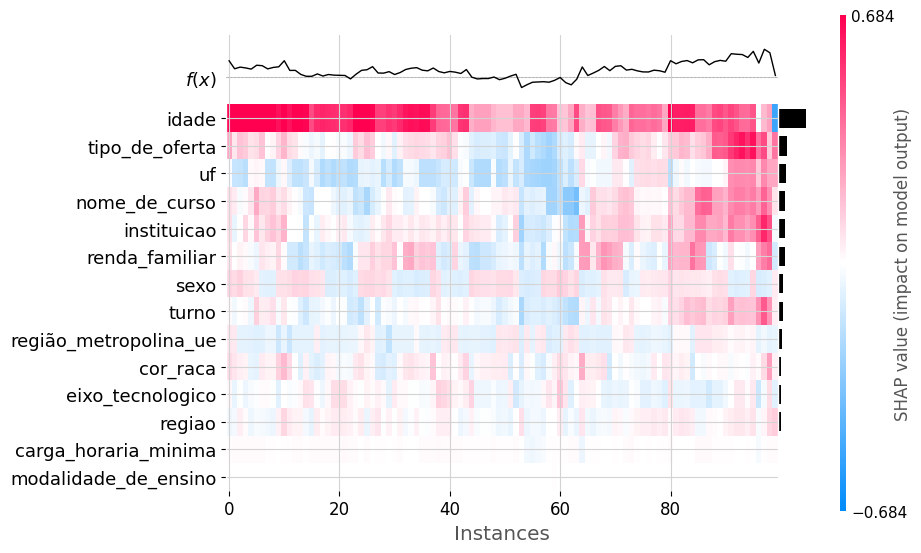

<Axes: xlabel='Instances'>

In [34]:
# compute SHAP values
shap_values_map = ex(X[:100])
shap.plots.heatmap(shap_values_map, max_display=15)

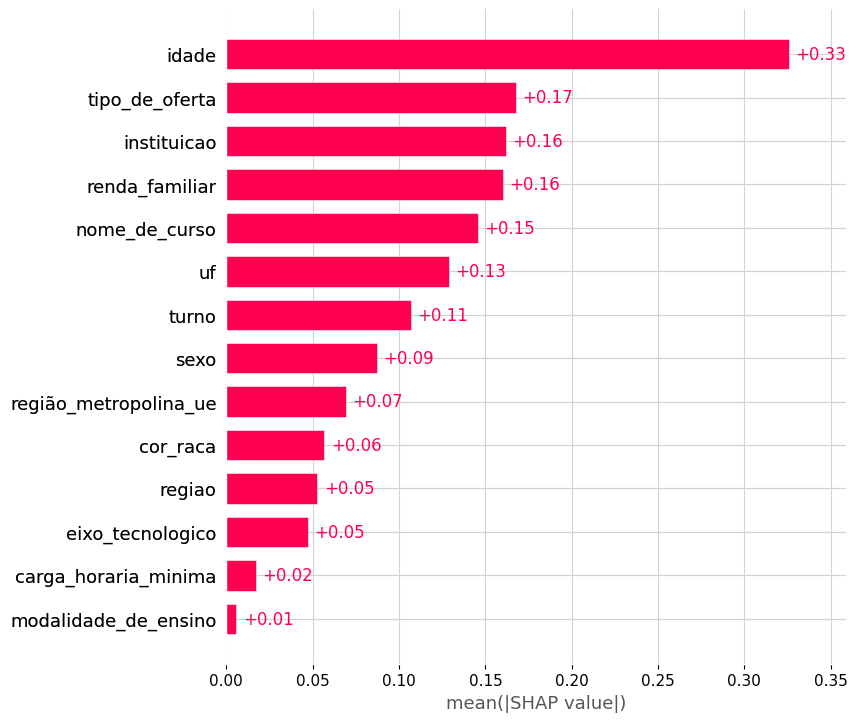

In [35]:
# avalia a importância das variáveis para o modelo
shap.plots.bar(shap_values_cat, max_display=15) #ascending=False

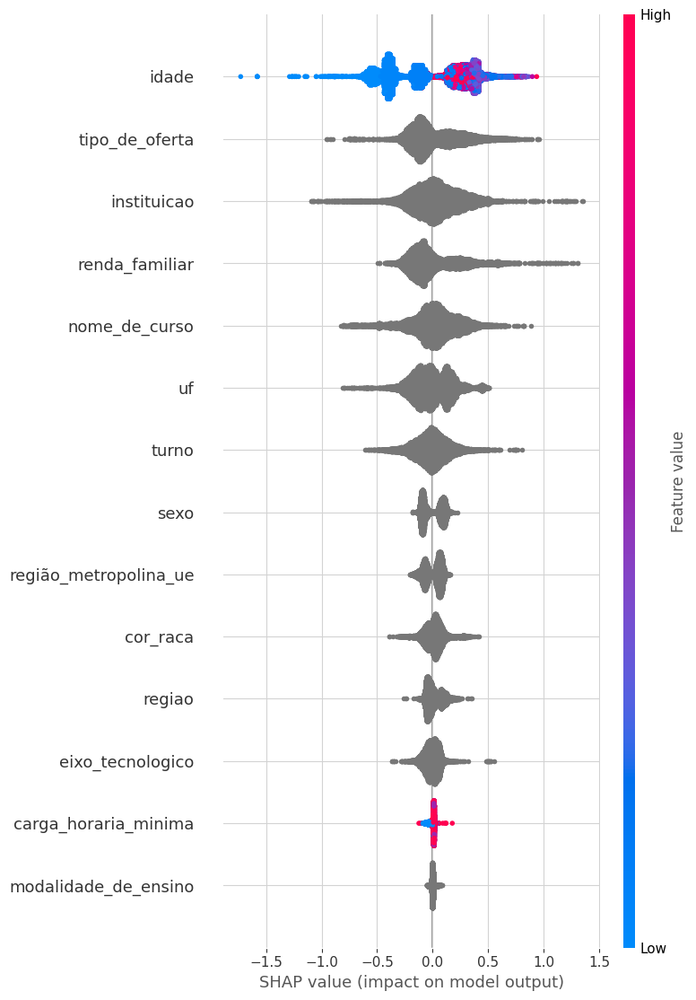

In [36]:
shap.summary_plot(shap_values_cat, X_cat_test, plot_size =.7)

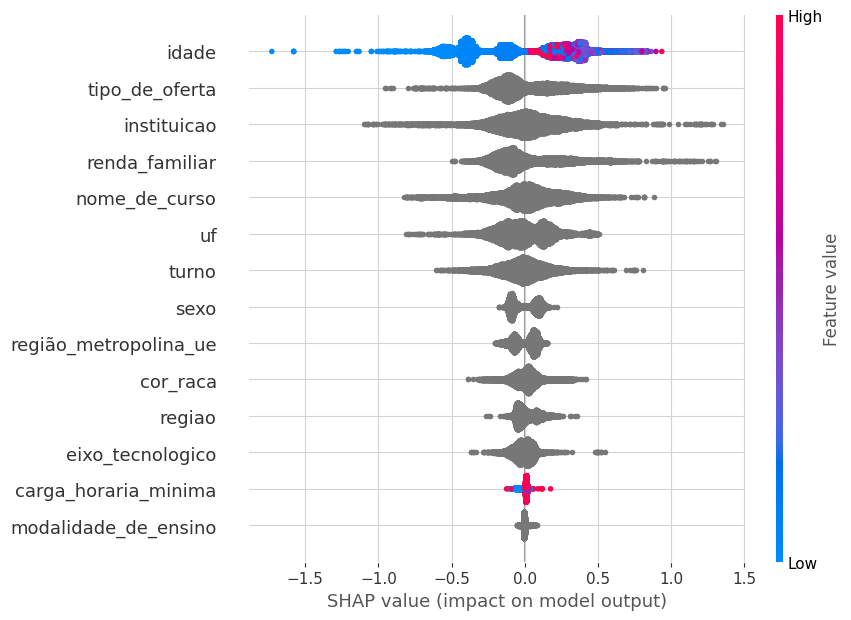

In [37]:
shap.plots.beeswarm(shap_values_cat, max_display=15)

In [49]:
# Crie um objeto Explanation 
###################################### 15445 EVADIU e 10 NAO EVADIU
explanation = shap.Explanation(
    values=shap_values_cat[15445].values,
    base_values=ex.expected_value,
    data=X_cat_test.iloc[15445],   # ou X_trainEf.iloc[0], depende de onde veio
    feature_names=X_cat_test.columns.tolist()
)
shap.plots.force(explanation)

In [62]:
expected_value = ex.expected_value

In [63]:
print(shap_values_cat[10].shape, X_cat_test.iloc[10].shape)

(14,) (14,)


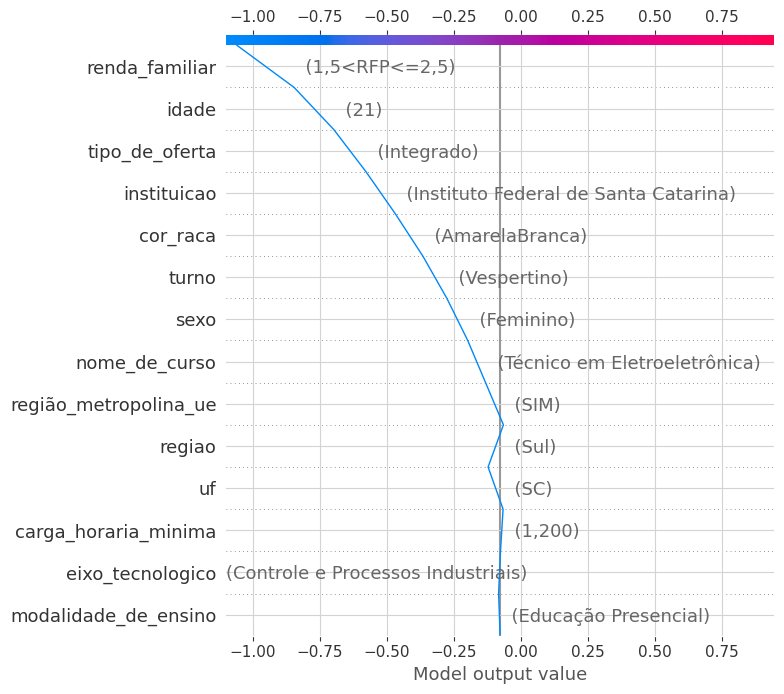

In [71]:
import shap
import matplotlib.pyplot as plt

# 1. Primeiro certifique-se de calcular os valores SHAP corretamente
explainer = shap.TreeExplainer(modelo_catboost_categorico_com_param)  # Substitua 'model' pelo seu modelo treinado
shap_values = explainer.shap_values(X_cat_test)  # Calcula todos os valores SHAP

# 2. Para classificação binária, selecione a classe correta (geralmente shap_values[1] para classe positiva)
if isinstance(shap_values, list):
    shap_values = shap_values[1]  # Para problemas de classificação

# 3. Obtenha o valor base esperado
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]  # Para classificação binária

# 4. Crie o decision plot corretamente
plt.figure(figsize=(6, 6))
shap.decision_plot(
    base_value=expected_value,
    shap_values=shap_values[10],  # Para a 10ª instância
    features=X_cat_test.iloc[10],
    feature_names=X_cat_test.columns.tolist(),
    show=False
)

plt.tight_layout()
plt.show()

- Esse matricula está EM_CURSO

- Há 41/33 variáveis. Para cada uma delas, existe um valor SHAP correspondente para cada observação.
- Para a classificação binária, os resultados são interpretados em termos de log-odds. Nos gráficos a seguir, E(f(X)) representa a média das previsões em log-odds. Log-odds é, basicamente, o logaritmo das odds, que corresponde à razão entre a probabilidade do evento ocorrer e a probabilidade de não ocorrer. O logaritmo é utilizado para converter as odds em uma escala linear. SHAP positivo aumentam os log-odds e, consequentemente, a probabilidade de evasão, e vice-versa.
- Para obter a probabilidade de evasão a partir dos log-odds, basta aplicar a função logística, definida como: $$ \text{sigmoid}(x) = \frac{1}{1 + e^{-\ln\left(\frac{p}{1-p}
\right)}} $$
- Por meio do gráfico de cascata (waterfall plot), será possível visualizar a contribuição de cada variável na previsão para uma instância positiva (evsão) e uma instância negativa (não-evasão).

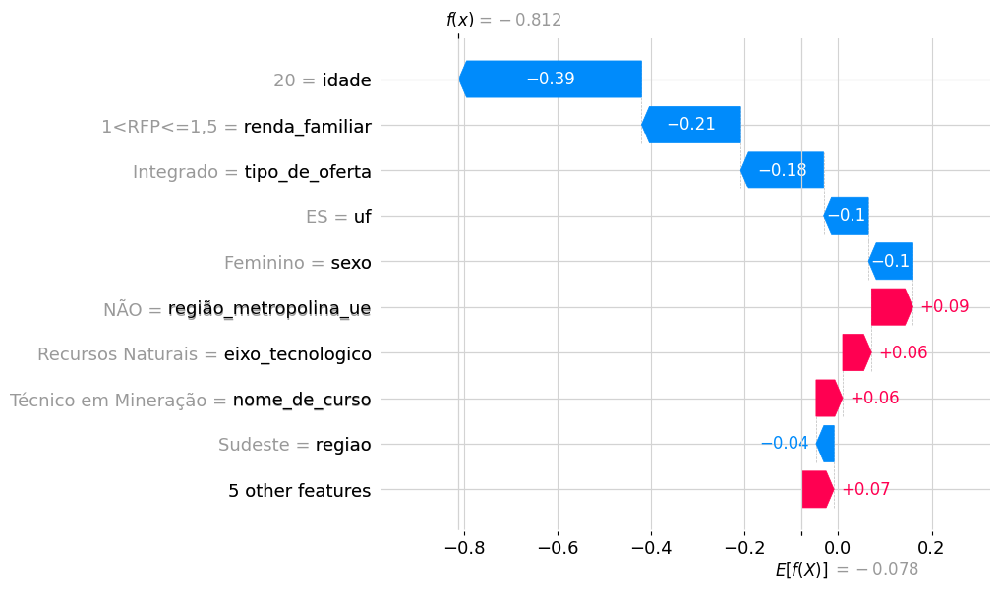

In [41]:
# Avalia a explicação individual de uma previsão de um modelo
shap.plots.waterfall(shap_values_cat[14001]) # 0

# Interpretação:
    #Barras azuis 🟦: Diminuíram a chance de evasão.
    #Barras vermelhas 🟥: Aumentaram a chance de evasão.
# Exemplo de interpretação: Se idade tiver um valor SHAP alto e positivo (+0.20), significa que ter maior idade aumenta a chance de evasão.


- Esse matricula está EM_CURSO

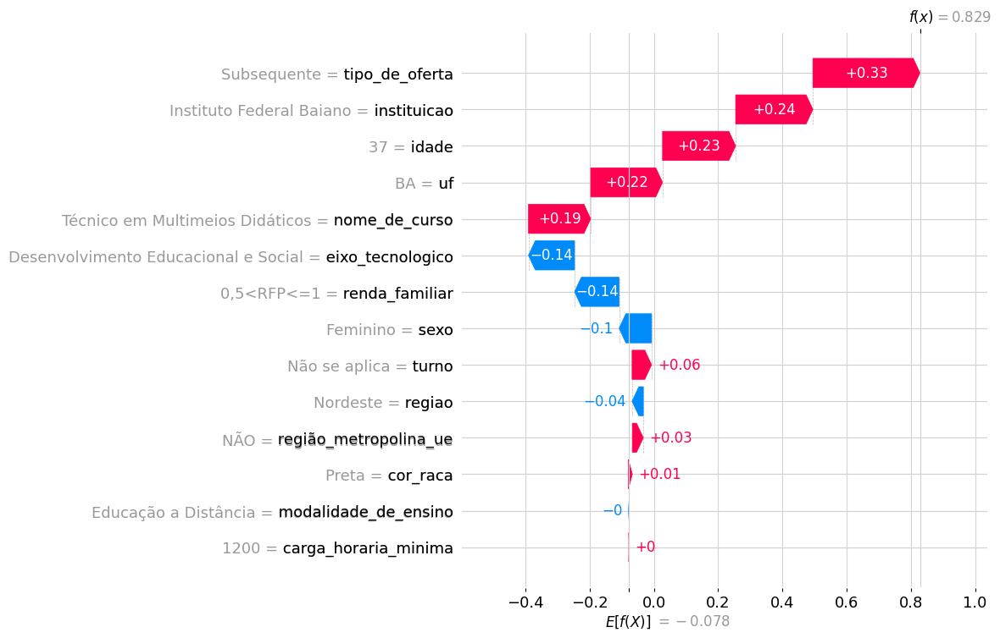

In [50]:
shap.plots.waterfall(shap_values_cat[15445], max_display=14)

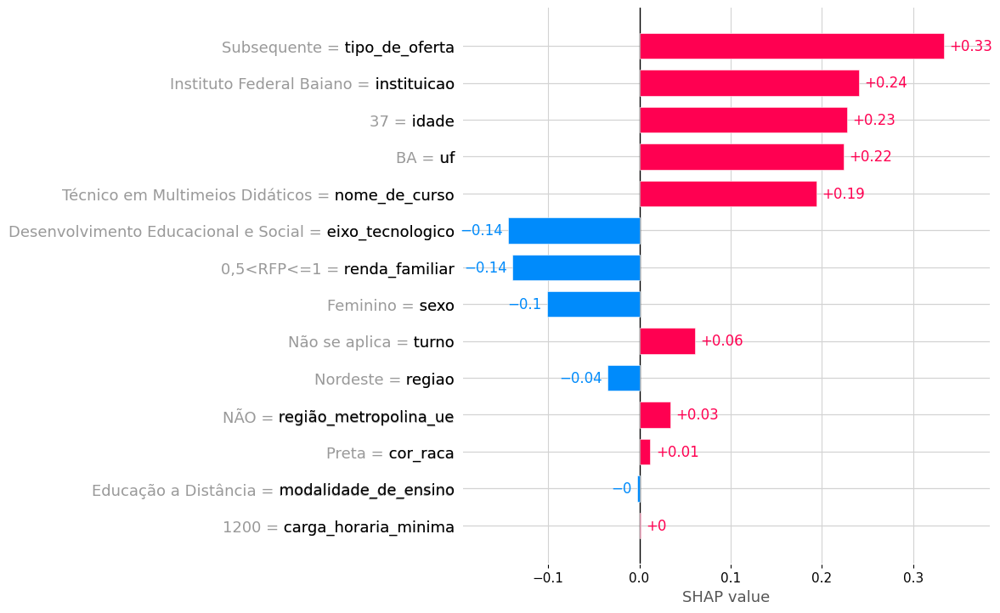

In [51]:
shap.plots.bar(shap_values_cat[15445], max_display=15)

- Esse matricula está EM_CURSO

- Esse aluno não evadiu. O fato dele ter idade = 17 reduziu os log-odds de evasão para 0.54. Em contraste, a renda familiar dele ser entre 0 e 1 salário mínimo aumentou os log-odds de evasão em 0.35.

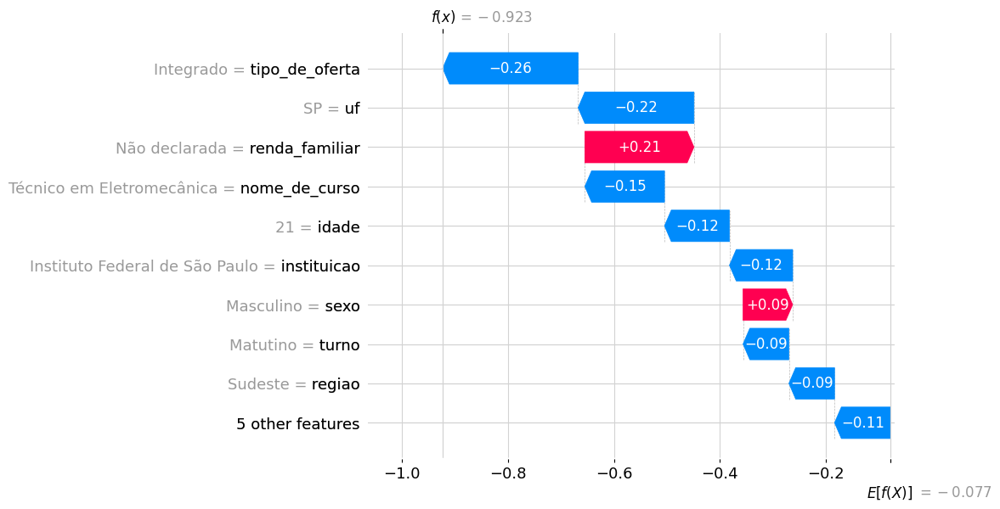

In [ ]:
# Avalia a explicação individual de uma previsão de um modelo
shap.plots.waterfall(shap_values_cat[15445])

- Esse aluno não evadiu. O fato dele ter idade = 17 reduziu os log-odds de evasão para 0.54. Em contraste, a renda familiar dele ser entre 0 e 1 salário mínimo aumentou os log-odds de evasão em 0.35.

In [41]:
# Avalia como um intervalo/variável contribui para a previsão do modelo em diferentes observações
shap.initjs()
shap.plots.force(shap_values_cat[0:100])

#Eixo horizontal = Escala de predição do modelo (de menor a maior chance de evasão, por exemplo).
#Eixo vertical = Diferentes amostras (linhas do dataset).

# As cores indicam o impacto das features:
    # 🔴 Vermelho = As features aumentam a previsão (ex: aumentam a chance de evasão).
    # 🔵 Azul = As features diminuem a previsão (ex: reduzem a chance de evasão).
# Posição no gráfico = Quanto mais à direita, maior a previsão; quanto mais à esquerda, menor a previsão.

Por meio do gráfico de barras a seguir, é possível observar quais variáveis são mais importantes. Neste gráfico, temos o valor médio absoluto do SHAP para cada variável, indicando quais variáveis contribuem mais (positiva ou negativamente) para as previsões do modelo.

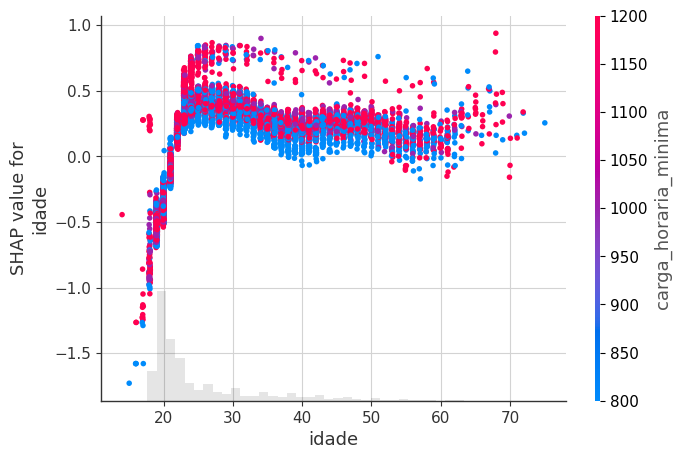

In [55]:
# Analisa a relação entre a idade e os valores SHAP correspondentes, usando a renda familiar como escala de cor.
shap.plots.scatter(shap_values_cat[:, "idade"],
                   color=shap_values_cat[:, "carga_horaria_minima"])

- Os pontos com idades mais baixas estão associados a valores SHAP negativos (renda familiar), isso indica que a idade menor aumenta a previsão do modelo, ou seja, menor risco de evasão.

- Os pontos com idades mais altas estão associados a valores SHAP positivos, isso indica que a idade mais avançada reduz a previsão, ou seja, maior risco de evasão.

Por meio do gráfico de enxame (beeswarm plot), é possível observar a relação entre as variáveis e a previsão do modelo.

- É perceptível que valores mais baixos na idade têm um impacto negativo nas log-odds de evasão e, consequentemente, na probabilidade de evasão, enquanto valores mais altos têm um impacto positivo.

- Por outro lado, o aluno estudar em um curso técnico na modalidade de oferta integrada (ao ensino médio) tendem a refletir um impacto positivo nas log-odds de evasão e, consequentemente, na probabilidade de evasão, enquanto alunos realizarem cursos em outras modalidade de oferta (subsequente e concomitante ao ensino médio) tendem a ter um impacto negativo.

## 6.3.2 SHARP - CatBoost - Binário

In [131]:
# CatBoost - Biário
explainer = shap.TreeExplainer(model_catboost_cv_binario_param)
# Compute shap values.
shap_values_test = explainer.shap_values(X_testEf)


In [ ]:
# compute SHAP values
shap_values_map_binario = explainer(X[:100])
shap.plots.heatmap(shap_values_map_binario, max_display=50)


In [222]:
# Avalia como um intervalo/variável contribui para a previsão do modelo em diferentes observações
shap.initjs()
shap_values = explainer.shap_values(X_testEf)
shap.plots.force(shap_values_test[0:100])

#Eixo horizontal = Escala de predição do modelo (de menor a maior chance de evasão, por exemplo).
#Eixo vertical = Diferentes amostras (linhas do dataset).

# As cores indicam o impacto das features:
    # 🔴 Vermelho = As features aumentam a previsão (ex: aumentam a chance de evasão).
    # 🔵 Azul = As features diminuem a previsão (ex: reduzem a chance de evasão).
# Posição no gráfico = Quanto mais à direita, maior a previsão; quanto mais à esquerda, menor a previsão.

100%|===================| 29138/29151 [545:11<00:14]         

In [212]:
# Assess the shape.
np.shape(shap_values_test)

(29151, 256)

- Há 41/33 variáveis. Para cada uma delas, existe um valor SHAP correspondente para cada observação.
- Para a classificação binária, os resultados são interpretados em termos de log-odds. Nos gráficos a seguir, E(f(X)) representa a média das previsões em log-odds. Log-odds é, basicamente, o logaritmo das odds, que corresponde à razão entre a probabilidade do evento ocorrer e a probabilidade de não ocorrer. O logaritmo é utilizado para converter as odds em uma escala linear. Positive SHAP aumentam os log-odds e, consequentemente, a probabilidade de evasão, e vice-versa.
- Para obter a probabilidade de churn a partir dos log-odds, basta aplicar a função logística, definida como: $$ \text{sigmoid}(x) = \frac{1}{1 + e^{-\ln\left(\frac{p}{1-p}
\right)}} $$
- Por meio do gráfico de cascata (waterfall plot), será possível visualizar a contribuição de cada variável na previsão para uma instância positiva (evsão) e uma instância negativa (não-evasão).



- Este aluno [1] não evadiu/evadiu. A probabilidade estimada de evasão para ele, calculada por meio da função logística, é muito próxima de zero.
- É possível observar que o eixo tecnologico do curso técnico dele: Produção Cultural e Desing, reduziu os log-odds de evasão em 0.58. Em contraste, o saldo rotativo total, que é zero, aumentou os log-odds de evasão em 1,41. Isso faz total sentido, pois foi observado que os cursos desse eixo tecnológico, menor o risco de evasão, e muitos alunos que evadem estavam concentrados em eixos e idade mais elevada.
- Observe como as variáveis criadas no processo de feature engineering impactaram negativa ou positivamente os log-odds de evasão, como no caso de renda_familiar e cor_raca Preta, por exemplo.

- Esse matricula está EM_CURSO

- This customer churned. The estimated probability of churning for him through the aforementioned logistic function is about 72%.
- It is possible to observe that, again, the number of transactions (in the last 12 months) increased the log-odds of churning by 3.19, which makes total sense, as mentioned before.

- Este aluno evadiu. A probabilidade estimada de evasão para ele, calculada por meio da função logística mencionada anteriormente, é de aproximadamente 72%.
- É possível observar que, por ser da região Centro-Oeste aumentou os log-odds de evasão em 0,23, o que faz total sentido, conforme mencionado anteriormente.


- Now, through the bar plot, we will observe which features are most important. In this plot, we have the average absolute SHAP value for each feature, indicating which features contribute more (positively or negatively) to the model predictions.

- Agora, por meio do gráfico de barras, será possível observar quais variáveis são mais importantes. Neste gráfico, o valor médio absoluto de SHAP é exibido para cada variável, indicando quais delas contribuem mais (positiva ou negativamente) para as previsões do modelo.

- Como esperado, Idade e o tipo de oferta = Integrado são as variáveis mais importantes. Isso faz total sentido, e foi observado na análise exploratória de dados (EDA) que essas variáveis apresentaram uma distinção clara entre alunos que evadiram e os que não evadiram. Além disso, as variáveis criadas na etapa de feature engineering também se destacaram entre as mais importantes, evidenciando a relevância dessa etapa para a melhoria do desempenho de um modelo de machine learning. É o caso de Região = Nordeste e o aluno ter estudando em uma escola em regiaão metropolitana, por exemplo.

- Agora, por meio do beeswarm plot, é possível observar a relação entre as variáveis e a previsão do modelo.

100%|===================| 29146/29151 [42:05<00:00]        

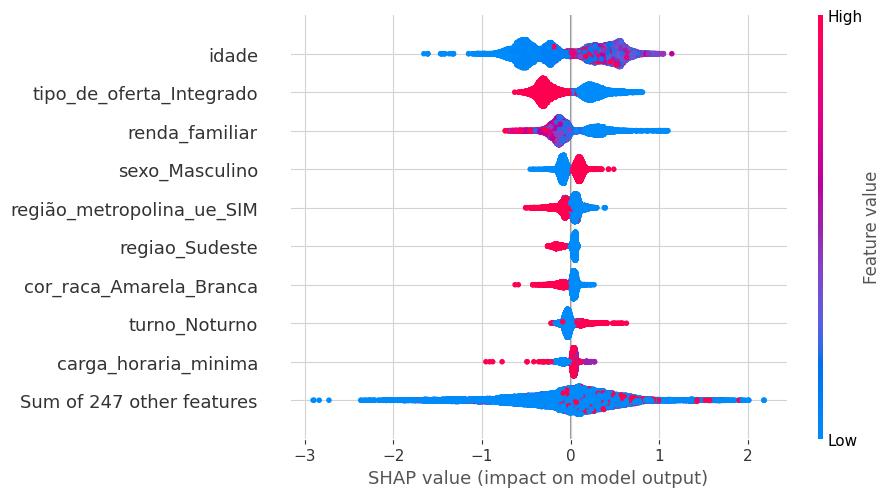

In [223]:
explainer = shap.Explainer(model_catboost_cv_binario_param, X_testEf)
shap_values_test = explainer(X_testEf)
shap.plots.beeswarm(shap_values_test)

# shap.plots.beeswarm(shap_values_test)

- Nota-se que valores mais baixos na contagem de Idade têm um impacto (negativo) positivo nos log-odds de evasão e, consequentemente, na probabilidade de evadir, enquanto valores mais altos têm um impacto negativo (postivo).

- De forma surpreendente, valores mais altos da renda_familiar tendem a ter um impacto positivo (negativo) nos log-odds de evadir e, consequentemente, na probabilidade de evadir, enquanto valores mais baixos tendem a ter um impacto negativo (positivo).

Exemplo: Enem

Os resultados foram interpretados através da biblioteca SHAP, fornecendo uma visão do impacto de cada variável nas predições individuais e a sua importância agregada através dos SHAP values. Por exemplo, através do gráfico beeswarm, vemos que:

Claramente, valores maiores de faixa etária (variável mais importante), como idoso ou pré-aposentado, impactam de forma positiva (em maior magnitude) as predições do modelo. Isso significa um aumento na log-odds e, consequentemente, na probabilidade de abstenção.
Para o tipo de escola, temos uma clara separação. Valores menores, que correspondem a escola particular, impactam de forma negativa as predições do modelo. Isso significa uma diminuição na log-odds e, consequentemente, na probabilidade de abstenção.
Para renda e acesso tecnológico por pessoa, o contrário é verdadeiro, menores valores acarretam um aumento na log-odds e na probabilidade de abstenção.

# _______________________________________________________________________________________________________________________________________________________________________________________

# Resultados acadêmicos
- O   modelo treinado e testado será aplicar em uma plataforma on line, a fim de demonstrar que o projeto pode ser utilizado por instituições e gestores interessadas em verificar e analisar as tendências de evasão na Rede Federal EPCT. 

- Foi utilizado a biblioteca <b>pickle</b> para salvar o modelo, assim será carregado em um aplicação criado em <b>streamlit</b> (html) para possibilizar a simulação de alunos e gestores como uma ferramenta para direcionar atenção e processo seletivos de cursos técnicos.

- Considerando isso, a aplicação do modelo de machine learning <b>LightGBM</b> e sua aplicação em um ambiente de simulação poderá gerar os seguintes ganhos:

    1️. <b>Antecipação de riscos e ações preventivas</b>

    - A ferramenta permitirá que gestores e educadores identifiquem padrões de risco de evasão antes que os alunos abandonem o curso.
    - Com base em dados históricos e modelos preditivos, será possível classificar alunos em diferentes níveis de vulnerabilidade, permitindo ações personalizadas.
    - Exemplos de ações preventivas: bolsas de estudo, reforço acadêmico, mentorias ou suporte psicológico.

    📌 Impacto: Redução das taxas de evasão e melhor aproveitamento dos recursos educacionais.

    2️. <b>Otimização da alocação de recursos</b>

    - As instituições poderão utilizar dados concretos para tomar decisões estratégicas, direcionando recursos para alunos com maior necessidade.
    - Melhor distribuição de tutores, materiais de apoio e programas sociais com base nos perfis de vulnerabilidade identificados.
    - Evita desperdício de orçamento em ações genéricas, tornando o investimento mais eficiente e assertivo.

    📌 Impacto: Maior eficiência na gestão de recursos e melhoria do retorno sobre investimentos educacionais.

    3️. <b>Aprimoramento das políticas institucionais</b>
    - A ferramenta gerará relatórios e insights em tempo real, permitindo ajustes rápidos em políticas de retenção estudantil.
    - Possibilita que gestores comparem diferentes cenários de evasão, testando o impacto de novas políticas antes de implementá-las.
    - Pode servir como base para desenvolvimento de políticas públicas, ajudando governos e instituições a criarem programas mais eficazes.

    📌 Impacto: Maior embasamento para decisões estratégicas e criação de políticas mais inclusivas e adaptadas à realidade dos alunos.

# Conclusões
- Neste projeto, foi desenvolvido um classificador <b>LightGBM</b> para prever a probabilidade de um aluno evadir de um curso técnico na Rede Federal EPCT. O objetivo do projeto foi construir um modelo capaz de prever com a melhor precisão a probabilidade de evasão de um aluno, identificar os fatores associados a evassão nas variáveis disponíveis e propor planos de ação para minimizar o problema. Com isso, a instituições e gestores podem implementar estratégias de retenção, garantindo a manutenção de sua oferta, já que realizar novas turmas  é mais caro do que reter as atuais.

- O problema de negócio foi solucionado. O modelo é capaz de prever corretamente  bem <b>70% dos alunos que evadiram</b>, com uma <b>AUC de 0,75</b> e uma boa capacidade de discriminar entre evadidos e não evadidos. Isso significa que, ao escolher aleatoriamente um aluno que evadiu e um que não evadiu, em 70% das vezes, o modelo atribuirá uma probabilidade maior de evasão ao aluno que realmente saiu. Além disso, foi possível identificar os principais fatores associados a evasão na etapa de <b>EDA</b> (Análise Exploratória de Dados) e fornecer sugestões para as instituições e gestores em relação aos padrões de evasão.

- Para lidar com o <b>desbalanceamento da variável-alvo</b>, foram utilizadas as seguintes estratégias: <b>Stratified Hold-Out</b>, <b>k-fold cross validation</b> e o ajuste do hiperparâmetro <b>class_weight</b>. Optou-se por não utilizar o <b>SMOTE</b>, pois essa técnica frequentemente não funciona bem em cenários do mundo real. O objetivo do projeto foi simular um caso prático de ciência de dados com uma solução realista.

- Os resultados do modelo foram interpretados e são coerentes! Por meio da análise de <b>SHAP</b>, foi possível identificar as variáveis com maior poder preditivo e entender como elas impactam o resultado do modelo, tanto para observações individuais quanto para o conjunto total de dados. Durante a etapa da <b>EDA</b>, já havia uma expectativa de que essas variáveis seriam as mais relevantes, reforçando a consistência dos resultados obtidos pelo modelo. Além disso, as probabilidades estimadas pelo modelo fazem sentido e confirmam que tudo está funcionando conforme esperado.

O projeto é relevante! O resultado concreto dependerá do seu uso e análises e das decisões de gestão ao implementar as estratégias de retenção com base nas probabilidades de evasão previstas. No entanto, para fins de estimativa e fundamentação, o projeto é viável e oferece benefícios significativos.

O próximo passo é implantar o modelo seguindo os princípios de CI/CD (Integração e Entrega Contínuas), utilizando uma abordagem de código modular para garantir escalabilidade e manutenção eficiente.